# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- **Ticker Symbol**: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- **Security**: Full name of the ticker symbol's underlying security (human-friendly full name of stock, fund, etc.).
- **Company**: Name of the company
- **GICS Sector**: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- **GICS Sub Industry**: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- **Current Price**: Current stock price in dollars
- **Price Change**: Percentage change in the stock price in 13 weeks
- **Volatility**: Standard deviation of the stock price over the past 13 weeks
- **ROE (Return on Equity)**: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- **Cash Ratio**: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- **Net Cash Flow**: The difference between a company's cash inflows and outflows (in dollars)
- **Net Income**: Revenues minus expenses, interest, and taxes (in dollars)
- **Earnings Per Share**: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- **Estimated Shares Outstanding**: Company's stock currently held by all its shareholders
- **P/E Ratio**: Ratio of the company's current stock price to the earnings per share
- **P/B Ratio**: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries and data

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
#!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 yellowbrick==1.5 -q --user

In [ ]:
# Import libraries we need to do our work

# Read and manipulate data
import numpy as np
import pandas as pd

# HTML styling
from IPython.display import display, HTML

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statistics
from scipy.stats import shapiro

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
#!pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.2 yellowbrick==1.5 -q --user
#!pip install --upgrade -q jinja2

In [ ]:
# Load Google Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define path to data file
path = r'/content/drive/MyDrive/Learning/Data Coursework/PGP-DSBA/7-Unsupervised Learning/Project 7/'
df = pd.read_csv(path + 'stock_data.csv')

## Data Overview

- Observations
- Sanity checks

In [ ]:
# Iterate through each column and determine its data type

# Calculate number of rows and columns
num_rows, num_cols = df.shape

# Initialize dictionary to store counts of each data type
data_type_counts = {}

# Iterate through each column and determine its data type
for col in df.columns:
    data_type = str(df[col].dtype)
    if data_type in data_type_counts:
        data_type_counts[data_type] += 1
    else:
        data_type_counts[data_type] = 1

# # Check size of dataset and print summary information
print(f'The data has {num_rows} rows and {num_cols} columns total:')
print()
for dtype, count in data_type_counts.items():
    print(f'{count} columns of type {dtype}')

The data has 340 rows and 15 columns total:

4 columns of type object
7 columns of type float64
4 columns of type int64


In [ ]:
# View information
print('Training')
display(df.info())

Training
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 

None

In [ ]:
# Describe the data. Can also use include=all to also show categorical series.
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ticker Symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.0,NaN,NaN,NaN,80.862345,98.055086,4.5,38.555,59.705,92.880001,1274.949951
Price Change,340.0,NaN,NaN,NaN,4.078194,12.006338,-47.129693,-0.939484,4.819505,10.695493,55.051683
Volatility,340.0,NaN,NaN,NaN,1.525976,0.591798,0.733163,1.134878,1.385593,1.695549,4.580042
ROE,340.0,NaN,NaN,NaN,39.597059,96.547538,1.0,9.75,15.0,27.0,917.0
Cash Ratio,340.0,NaN,NaN,NaN,70.023529,90.421331,0.0,18.0,47.0,99.0,958.0
Net Cash Flow,340.0,NaN,NaN,NaN,55537620.588235,1946365312.175789,-11208000000.0,-193906500.0,2098000.0,169810750.0,20764000000.0


In [ ]:
# Check for empty values
print(f'Dataset has {df.isnull().sum().sum()} null values:',)

# Replace any missing values with NaNs
df = df.replace("?", np.nan)

Dataset has 0 null values:


In [ ]:
# Retrieve and preview the categorial column values, using a list.
df_eda = df.copy()

# Create numerical and categorical column lists
list_catcol = df_eda.select_dtypes(include=['object']).columns.to_list()
list_numcol = df_eda.select_dtypes(exclude=['object']).columns.to_list()

print('Dataset has', len(list_catcol), 'categorical columns and', len(list_numcol), 'numerical columns.')

Dataset has 4 categorical columns and 11 numerical columns.


In [ ]:
# Use a for loop to show the counts and percent contribution of each numerical column.
for col in list_numcol:
  print(f'***** {col} *****')
  print('Preview counts for:',df_eda[col].value_counts(),'\n')
  print('Preview % breakdown for:',df_eda[col].value_counts(normalize=True),'\n')

***** Current Price *****
Preview counts for: Current Price
54.360001     2
114.379997    2
43.230000     2
32.930000     2
103.889999    1
             ..
51.070000     1
52.130001     1
81.589996     1
302.399994    1
47.919998     1
Name: count, Length: 336, dtype: int64 

Preview % breakdown for: Current Price
54.360001     0.005882
114.379997    0.005882
43.230000     0.005882
32.930000     0.005882
103.889999    0.002941
                ...   
51.070000     0.002941
52.130001     0.002941
81.589996     0.002941
302.399994    0.002941
47.919998     0.002941
Name: proportion, Length: 336, dtype: float64 

***** Price Change *****
Preview counts for: Price Change
 9.999995     1
 6.237855     1
 6.585554     1
 5.796884     1
 9.529966     1
             ..
 8.037605     1
 10.019650    1
-4.078593     1
 3.654238     1
 16.678836    1
Name: count, Length: 340, dtype: int64 

Preview % breakdown for: Price Change
 9.999995     0.002941
 6.237855     0.002941
 6.585554     0.002941
 

In [ ]:
# Use a for loop to show the counts and percent contribution of each categorical column.
for col in list_catcol:
  print(f'***** {col} *****')
  print('Preview counts for:',df_eda[col].value_counts(),'\n')
  print('Preview % breakdown for:',df_eda[col].value_counts(normalize=True),'\n')

***** Ticker Symbol *****
Preview counts for: Ticker Symbol
AAL     1
NEE     1
NUE     1
NTRS    1
NSC     1
       ..
EQR     1
EQIX    1
EOG     1
EMN     1
ZTS     1
Name: count, Length: 340, dtype: int64 

Preview % breakdown for: Ticker Symbol
AAL     0.002941
NEE     0.002941
NUE     0.002941
NTRS    0.002941
NSC     0.002941
          ...   
EQR     0.002941
EQIX    0.002941
EOG     0.002941
EMN     0.002941
ZTS     0.002941
Name: proportion, Length: 340, dtype: float64 

***** Security *****
Preview counts for: Security
American Airlines Group    1
NextEra Energy             1
Nucor Corp.                1
Northern Trust Corp.       1
Norfolk Southern Corp.     1
                          ..
Equity Residential         1
Equinix                    1
EOG Resources              1
Eastman Chemical           1
Zoetis                     1
Name: count, Length: 340, dtype: int64 

Preview % breakdown for: Security
American Airlines Group    0.002941
NextEra Energy             0.002941

In [ ]:
# Check counts, unique counts and duplicate values for each column. Based on this, we can decide how to approach each variable.
for col in df_eda:
  unique_count = df_eda[col].nunique()
  duplicate_count = df_eda[col].count()-df_eda[col].nunique()
  empty_count = df_eda[col].isnull().sum().sum()
  print(f'Series {col} has {unique_count} unique values, {duplicate_count} duplicate values, and {empty_count} missing values.')

Series Ticker Symbol has 340 unique values, 0 duplicate values, and 0 missing values.
Series Security has 340 unique values, 0 duplicate values, and 0 missing values.
Series GICS Sector has 11 unique values, 329 duplicate values, and 0 missing values.
Series GICS Sub Industry has 104 unique values, 236 duplicate values, and 0 missing values.
Series Current Price has 336 unique values, 4 duplicate values, and 0 missing values.
Series Price Change has 340 unique values, 0 duplicate values, and 0 missing values.
Series Volatility has 340 unique values, 0 duplicate values, and 0 missing values.
Series ROE has 82 unique values, 258 duplicate values, and 0 missing values.
Series Cash Ratio has 124 unique values, 216 duplicate values, and 0 missing values.
Series Net Cash Flow has 332 unique values, 8 duplicate values, and 0 missing values.
Series Net Income has 335 unique values, 5 duplicate values, and 0 missing values.
Series Earnings Per Share has 268 unique values, 72 duplicate values, a

In [ ]:
# Chart high-level assessment for each numerical series
for col in list_numcol:
  mean = df[col].mean()
  median = df[col].median()
  min = df[col].min()
  max = df[col].max()

  this_range = max-min
  print('*****')
  print('For', col, ':')
  print(' * Mean =', mean)
  print(' * Median =' , median)
  print(' * Range =', min, 'to' , max,'(', round(this_range,3), ')')


*****
For Current Price :
 * Mean = 80.86234477216765
 * Median = 59.705
 * Range = 4.5 to 1274.949951 ( 1270.45 )
*****
For Price Change :
 * Mean = 4.078193812467648
 * Median = 4.819504729
 * Range = -47.12969338 to 55.05168339 ( 102.181 )
*****
For Volatility :
 * Mean = 1.5259762538411765
 * Median = 1.3855929255000001
 * Range = 0.733163184 to 4.58004173 ( 3.847 )
*****
For ROE :
 * Mean = 39.59705882352941
 * Median = 15.0
 * Range = 1 to 917 ( 916 )
*****
For Cash Ratio :
 * Mean = 70.02352941176471
 * Median = 47.0
 * Range = 0 to 958 ( 958 )
*****
For Net Cash Flow :
 * Mean = 55537620.5882353
 * Median = 2098000.0
 * Range = -11208000000 to 20764000000 ( 31972000000 )
*****
For Net Income :
 * Mean = 1494384602.9411764
 * Median = 707336000.0
 * Range = -23528000000 to 24442000000 ( 47970000000 )
*****
For Earnings Per Share :
 * Mean = 2.776661764705882
 * Median = 2.895
 * Range = -61.2 to 50.09 ( 111.29 )
*****
For Estimated Shares Outstanding :
 * Mean = 577028337.754029

In [ ]:
# Check for null values
print(f'EDA dataset has {df_eda.isnull().sum().sum()} null values:',)

# Replace any missing values with NaNs
df_eda = df_eda.replace("?", np.nan)

# Count NaN values
nan_count = df_eda.isnull().sum().sum()

if nan_count > 0:
    print(f"EDA DataFrame has {nan_count} NaN values.")
else:
    print("EDA DataFrame does not have NaN values.")

EDA dataset has 0 null values:
EDA DataFrame does not have NaN values.


In [ ]:
# Preview rows with missing data
df_eda[df_eda.isnull().any(axis=1)]

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio


In [ ]:
# Preview a random sample of the data
df_eda.sample(n=10, random_state=1)

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
102,DVN,Devon Energy Corp.,Energy,Oil & Gas Exploration & Production,32.000000,-15.478079,2.923698,205,70,830000000,-14454000000,-35.55,4.065823e+08,93.089287,1.785616
125,FB,Facebook,Information Technology,Internet Software & Services,104.660004,16.224320,1.320606,8,958,592000000,3669000000,1.31,2.800763e+09,79.893133,5.884467
11,AIV,Apartment Investment & Mgmt,Real Estate,REITs,40.029999,7.578608,1.163334,15,47,21818000,248710000,1.52,1.636250e+08,26.335526,-1.269332
248,PG,Procter & Gamble,Consumer Staples,Personal Products,79.410004,10.660538,0.806056,17,129,160383000,636056000,3.28,4.913916e+08,24.070121,-2.256747
238,OXY,Occidental Petroleum,Energy,Oil & Gas Exploration & Production,67.610001,0.865287,1.589520,32,64,-588000000,-7829000000,-10.23,7.652981e+08,93.089287,3.345102
336,YUM,Yum! Brands Inc,Consumer Discretionary,Restaurants,52.516175,-8.698917,1.478877,142,27,159000000,1293000000,2.97,4.353535e+08,17.682214,-3.838260
112,EQT,EQT Corporation,Energy,Oil & Gas Exploration & Production,52.130001,-21.253771,2.364883,2,201,523803000,85171000,0.56,1.520911e+08,93.089287,9.567952
147,HAL,Halliburton Co.,Energy,Oil & Gas Equipment & Services,34.040001,-5.101751,1.966062,4,189,7786000000,-671000000,-0.79,8.493671e+08,93.089287,17.345857
89,DFS,Discover Financial Services,Financials,Consumer Finance,53.619999,3.653584,1.159897,20,99,2288000000,2297000000,5.14,4.468872e+08,10.431906,-0.375934
173,IVZ,Invesco Ltd.,Financials,Asset Management & Custody Banks,33.480000,7.067477,1.580839,12,67,412000000,968100000,2.26,4.283628e+08,14.814159,4.218620


**OBSERVATIONS**

* The raw dataset has 340 rows and 15 columns total:

  * 4 columns of type object
    * Ticker Symbol
    * Security
    * GICS Sector
    * GICS Sub Industry

  * 7 columns of type float64
    * Current Price
    * Price Change
    * Volatility
    * Earnings Per Share
    * Estimated Shares Outstanding
    * P/E Ratio
    * P/B Ratio
    
  * 4 columns of type int64
    * ROE
    * Cash Ratio
    * Net Cash Flow
    * Net Income

* Some duplicate data exists. We'll need to examine these to see if we expect duplicates in these features, or if we need to de-dupe the dataset.

* No values are null or missing.


## Exploratory Data Analysis (EDA)

As part of our analysis, we will answer the following questions:

1. What does the distribution of stock prices look like?
2. The stocks of which economic sector have seen the maximum price increase on average?
3. How are the different variables correlated with each other?
4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?
5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

###EDA Helpers

The following functions will assist us in our analysis.

In [ ]:
# Import libraries we need
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
# The functions below are defined here so we can avoid repeating similar code for commonly used plots.
# These functions are called throughout this notebook.

# This function prints a barplot
def print_barplot(data, column, width, height, titleText, hue=None):
    '''
    Print a single, sorted barplot with title and labels and optional hue.
    '''

    # Set figure size and title
    plt.figure(figsize=(width, height))
    plt.title(titleText)
    plt.xticks(rotation=90)

    # Sort by values
    data_sorted = data[column].value_counts().sort_values(ascending=False).reset_index()
    data_sorted.columns = ['category', 'counts']

    # Plotting
    if hue is None:
        sns.barplot(x='category', y='counts', data=data_sorted)
    else:
        sns.barplot(x='category', y='counts', hue=hue, data=data_sorted)

    plt.xlabel('Categories')
    plt.ylabel('Counts')
    plt.show()

In [ ]:
# This function creates a labeled barplot

def print_labeled_barplot(data, feature, perc=False, n=None):
    '''
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    '''

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [ ]:
# Function to plot a boxplot and a histogram on same scale

def histogram_boxplot(data, feature, figsize=(10, 5), kde=False, bins=None):
  '''
  Boxplot and histogram combined

  data: dataframe
  feature: dataframe column
  figsize: size of figure (default (10,5))
  kde: whether to the show density curve (default False)
  bins: number of bins for histogram (default None)
  '''
  # Create a figure with two subplots
  f2, (ax_box2, ax_hist2) = plt.subplots(
      nrows=2,  # Number of rows of the subplot grid
      sharex=True,  # x-axis will be shared among all subplots
      gridspec_kw={'height_ratios': (0.25, 0.75)},  # Ratio of subplot heights
      figsize=figsize,  # Size of the figure
  )

  # Boxplot
  sns.boxplot(
      data=data, x=feature, ax=ax_box2, showmeans=True, color='blue'
  )
  ax_box2.set_title(f'Boxplot of {feature}')  # Title for the boxplot

  # Histogram
  if bins:
      sns.histplot(
          data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette='winter'
      )
  else:
      sns.histplot(
          data=data, x=feature, kde=kde, ax=ax_hist2
      )

  ax_hist2.axvline(
      data[feature].mean(), color='green', linestyle="--", label='Mean'
  )
  ax_hist2.axvline(
      data[feature].median(), color='black', linestyle="-", label='Median'
  )
  ax_hist2.set_title(f'Histogram of {feature}')  # Title for the histogram
  ax_hist2.legend()  # Add legend to the histogram plot

  # Adjust layout
  plt.tight_layout()
  plt.show()

In [ ]:
# Function to calculate Z-score
def calculate_z_score(value, mean, std):
    '''Calculate the Z-score for a single value '''
    if std == 0:
        return 0  # Avoid division by zero
    return (value - mean) / std

In [ ]:
# Function to print the statistics for each feature
def print_numerical_feature_statistics(data, feature):
    '''
    Show the statistics of a feature.

    data: dataframe
    feature: dataframe column
    '''

    # Calculate Shapiro-Wilks to test normal distribution
    stat, p = shapiro(data[feature])

    # Calculate mean and standard deviation
    mean = data[feature].mean()
    std = data[feature].std()

    # Calculate Z-score for the mean
    z_score = calculate_z_score(mean, mean, std)

    new_stats = {
        'Feature': feature,
        'Mean': mean,
        'Median': data[feature].median(),
        'Min': data[feature].min(),
        'Max': data[feature].max(),
        'Range': data[feature].max() - data[feature].min(),
        'Standard Deviation': std,
        'Variance': data[feature].var(),
        'P-value': p
    }

    new_stats_df = pd.DataFrame([new_stats])

    return new_stats_df

###Univariate Analysis

First, we want to analyze each feature independently.

In [ ]:
# Analyze critical statistics

# Create empty dataframe to store the vital statistics
stat_columns = [
    'Feature',
    'Mean',
    'Median',
    'Min',
    'Max',
    'Range',
    'Standard Deviation',
    'Variance',
    'P-value']

df_stats = pd.DataFrame(columns=stat_columns)

In [ ]:
# Drop ticker symbol and security for this purpose, since they are unique
df_eda.drop(columns=['Ticker Symbol','Security'], axis=1, inplace=True)

# Recreate numerical and categorical column lists
list_catcol = df_eda.select_dtypes(include=['object']).columns.to_list()
list_numcol = df_eda.select_dtypes(exclude=['object']).columns.to_list()


In [ ]:
# Populate stats and show them
for feature in list_numcol:
    new_stats_df = print_numerical_feature_statistics(df_eda.select_dtypes(include=['number']), feature)
    df_stats = pd.concat([df_stats, new_stats_df], ignore_index=True)

# Set the display precision
pd.set_option('display.float_format', '{:.6f}'.format)

# Show statistics
df_stats

,Feature,Mean,Median,Min,Max,Range,Standard Deviation,Variance,P-value
0,Current Price,80.862345,59.705000,4.500000,1274.949951,1270.449951,98.055086,9614.799896,0.000000
1,Price Change,4.078194,4.819505,-47.129693,55.051683,102.181377,12.006338,144.152149,0.000000
2,Volatility,1.525976,1.385593,0.733163,4.580042,3.846879,0.591798,0.350225,0.000000
3,ROE,39.597059,15.000000,1.000000,917.000000,916.000000,96.547538,9321.427130,0.000000
4,Cash Ratio,70.023529,47.000000,0.000000,958.000000,958.000000,90.421331,8176.017144,0.000000
5,Net Cash Flow,55537620.588235,2098000.000000,-11208000000.000000,20764000000.000000,31972000000.000000,1946365312.175789,3788337928441157632.000000,0.000000
6,Net Income,1494384602.941176,707336000.000000,-23528000000.000000,24442000000.000000,47970000000.000000,3940150279.327937,15524784223688019968.000000,0.000000
7,Earnings Per Share,2.776662,2.895000,-61.200000,50.090000,111.290000,6.587779,43.398830,0.000000
8,Estimated Shares Outstanding,577028337.754030,309675137.800000,27672156.860000,6159292035.000000,6131619878.140000,845849595.417695,715461538068278272.000000,0.000000
9,P/E Ratio,32.612563,20.819876,2.935451,528.039074,525.103623,44.348731,1966.809957,0.000000


In [ ]:
# Drop numerical columns for charting object histograms
df_eda_plot_cat = df_eda.copy().drop(columns=list_numcol, axis=1)

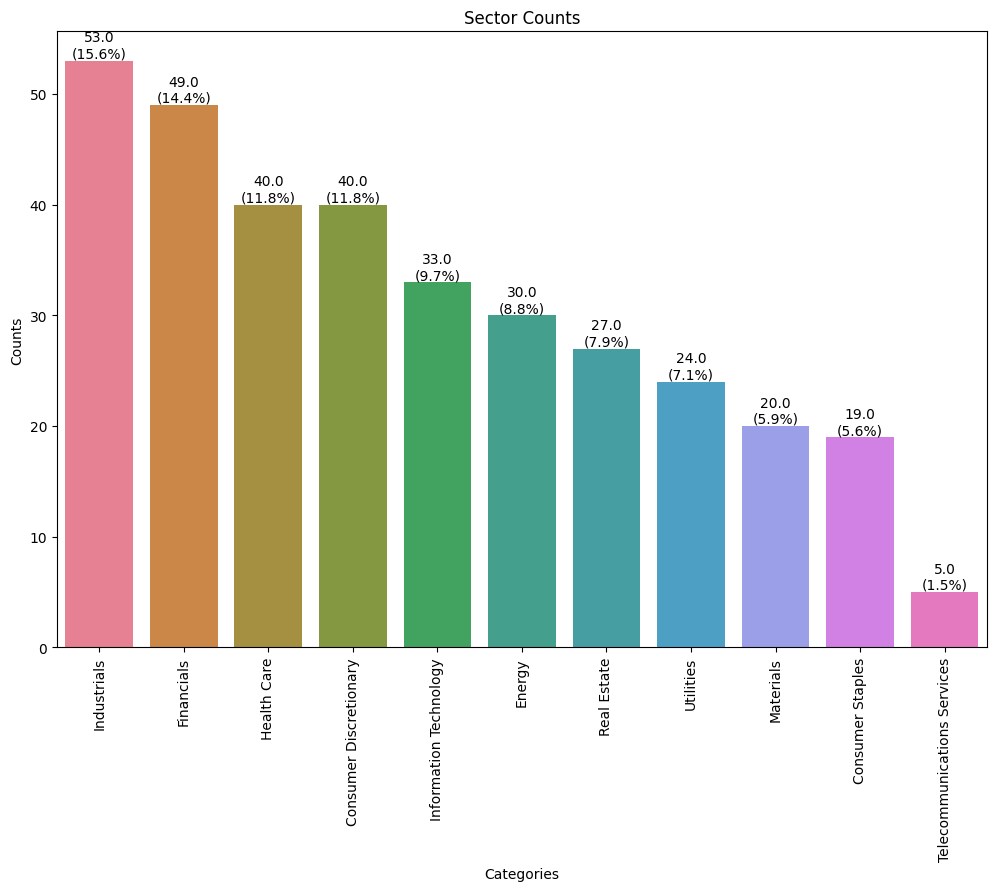

In [ ]:
# Show sectors as a visual

# Create counts and percentages
value_counts = df_eda_plot_cat['GICS Sector'].value_counts().reset_index()
value_counts.columns = ['Category', 'Count']
total_counts = value_counts['Count'].sum()
value_counts['Percentage'] = (value_counts['Count'] / total_counts) * 100
value_counts_sorted = value_counts.sort_values(by='Count', ascending=False)

# Plot sector contributions
plt.figure(figsize=(12, 8))
bar_plot = sns.barplot(x='Category', y='Count', data=value_counts_sorted, order=value_counts_sorted['Category'], hue='Category')

plt.xticks(rotation=90)
plt.xlabel('Categories')
plt.ylabel('Counts')
plt.title('Sector Counts')

for p in bar_plot.patches:
    count = p.get_height()
    percentage = value_counts_sorted["Percentage"].iloc[int(p.get_x() + p.get_width() / 2)]
    bar_plot.annotate(f'{count:.1f}\n({percentage:.1f}%)',
                      (p.get_x() + p.get_width() / 2., count),
                      ha='center', va='bottom')

In [ ]:
# Print value contributions for each sector
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

display(value_counts_sorted)

# Since our dataset is small, we'll leave this display option intact for later
#pd.set_option('display.max_rows', 10)
#pd.set_option('display.max_columns', 10)

,Category,Count,Percentage
0,Industrials,53,15.588235
1,Financials,49,14.411765
2,Health Care,40,11.764706
3,Consumer Discretionary,40,11.764706
4,Information Technology,33,9.705882
5,Energy,30,8.823529
6,Real Estate,27,7.941176
7,Utilities,24,7.058824
8,Materials,20,5.882353
9,Consumer Staples,19,5.588235


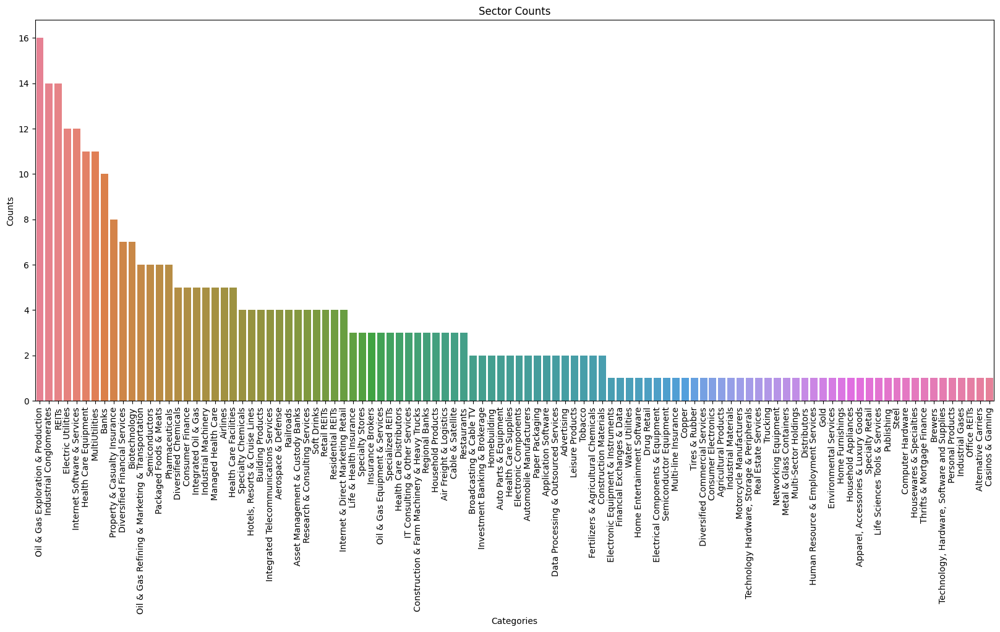

In [ ]:
# Show sub sector contributions as a visual

# Create counts and percentages
value_counts_sub = df_eda_plot_cat['GICS Sub Industry'].value_counts().reset_index()
value_counts_sub.columns = ['Category', 'Count']
total_counts_sub = value_counts_sub['Count'].sum()
value_counts_sub['Percentage'] = (value_counts_sub['Count'] / total_counts_sub) * 100
value_counts_sorted_sub = value_counts_sub.sort_values(by='Count', ascending=False)

# Plot sector contributions
plt.figure(figsize=(20, 8))
bar_plot = sns.barplot(x='Category', y='Count', data=value_counts_sorted_sub, order=value_counts_sorted_sub['Category'], hue='Category')

plt.xticks(rotation=90)
plt.xlabel('Categories')
plt.ylabel('Counts')
plt.title('Sector Counts')

plt.show()

In [ ]:
# Print value contributions for each sub sector
print('Top 10 Sub Sectors')
display(value_counts_sorted_sub.head(10))


Top 10 Sub Sectors


,Category,Count,Percentage
0,Oil & Gas Exploration & Production,16,4.705882
2,Industrial Conglomerates,14,4.117647
1,REITs,14,4.117647
3,Electric Utilities,12,3.529412
4,Internet Software & Services,12,3.529412
5,Health Care Equipment,11,3.235294
6,MultiUtilities,11,3.235294
7,Banks,10,2.941176
8,Property & Casualty Insurance,8,2.352941
9,Diversified Financial Services,7,2.058824


In [ ]:
print('Bottom Sub Sectors')
display(value_counts_sorted_sub[value_counts_sorted_sub['Percentage'] < .3])

Bottom Sub Sectors


,Category,Count,Percentage
93,Electronic Equipment & Instruments,1,0.294118
85,Financial Exchanges & Data,1,0.294118
86,Water Utilities,1,0.294118
87,Home Entertainment Software,1,0.294118
88,Drug Retail,1,0.294118
89,Electrical Components & Equipment,1,0.294118
90,Semiconductor Equipment,1,0.294118
91,Multi-line Insurance,1,0.294118
92,Copper,1,0.294118
96,Tires & Rubber,1,0.294118


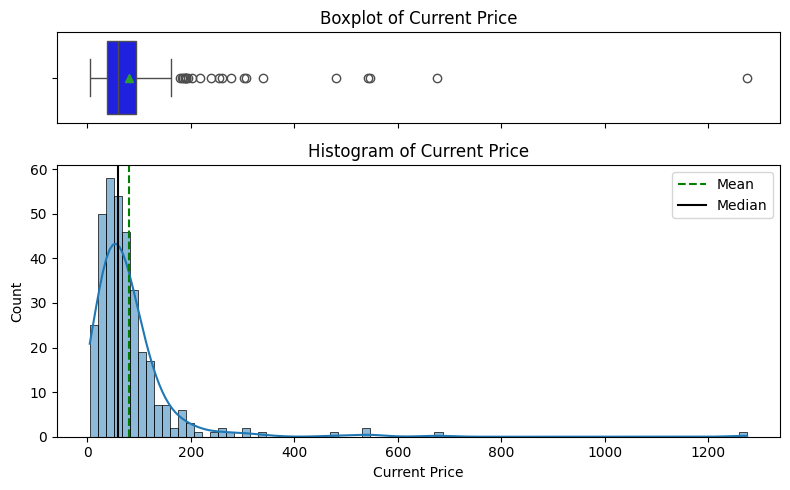

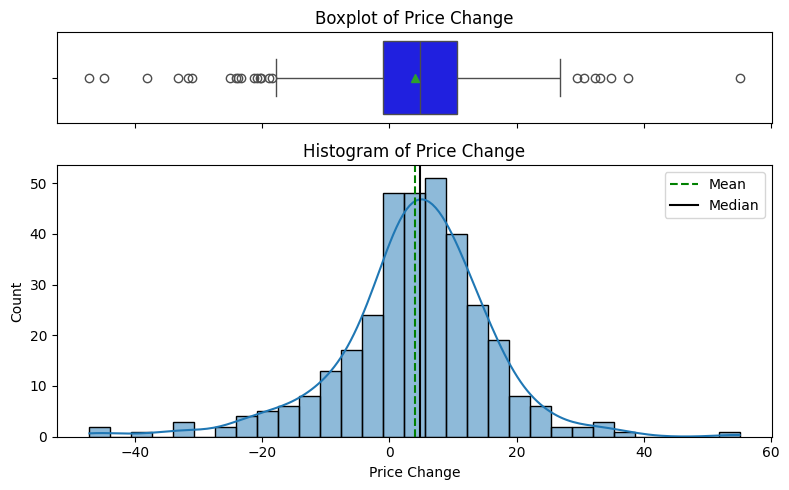

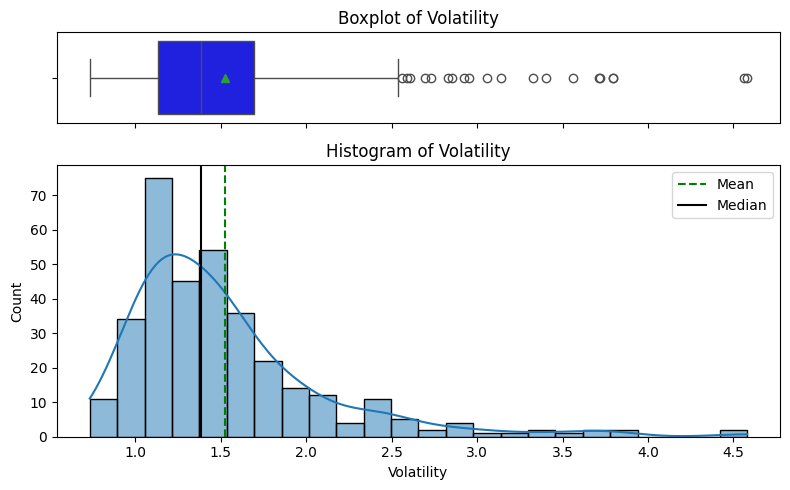

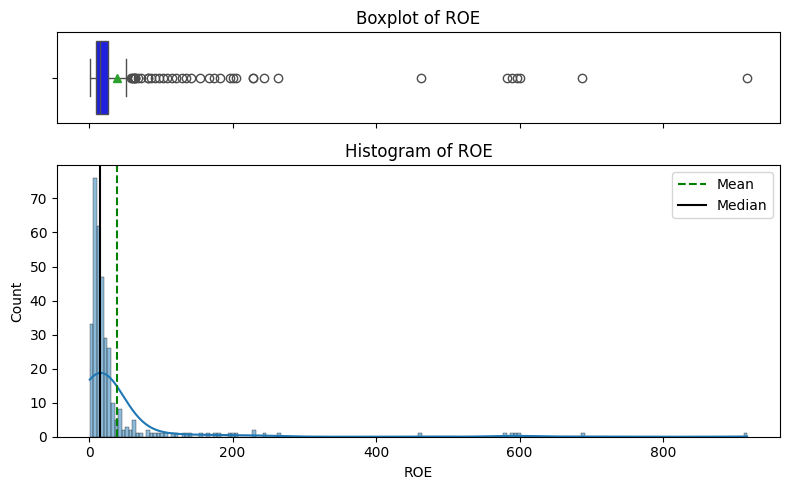

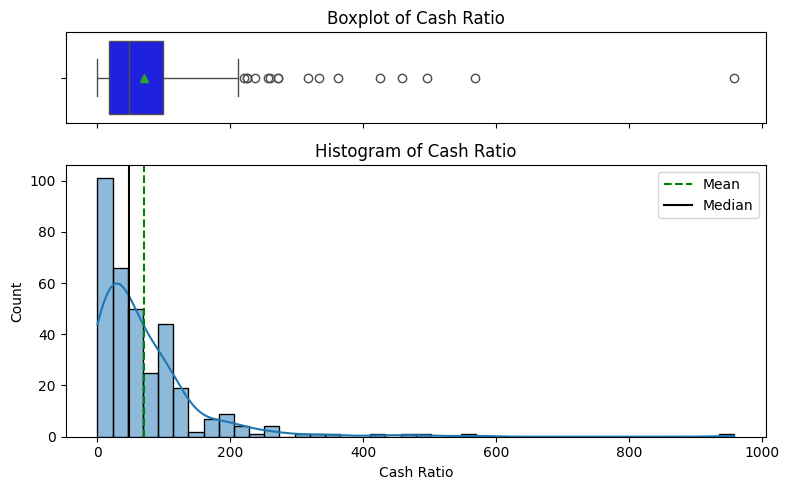

...

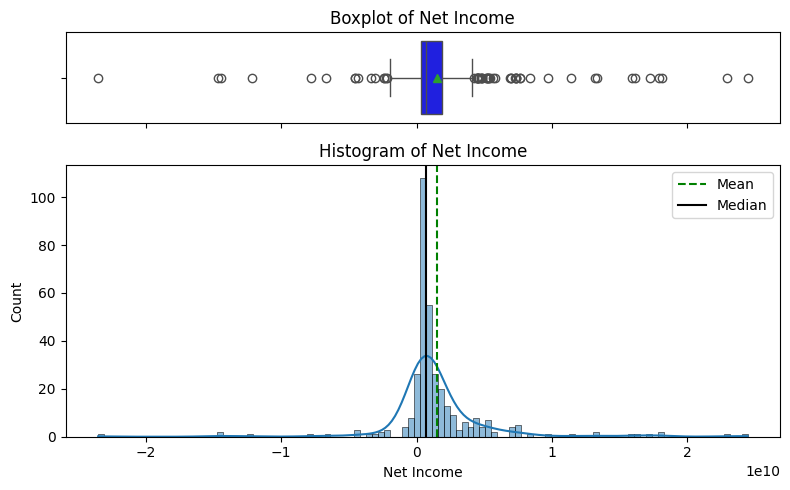

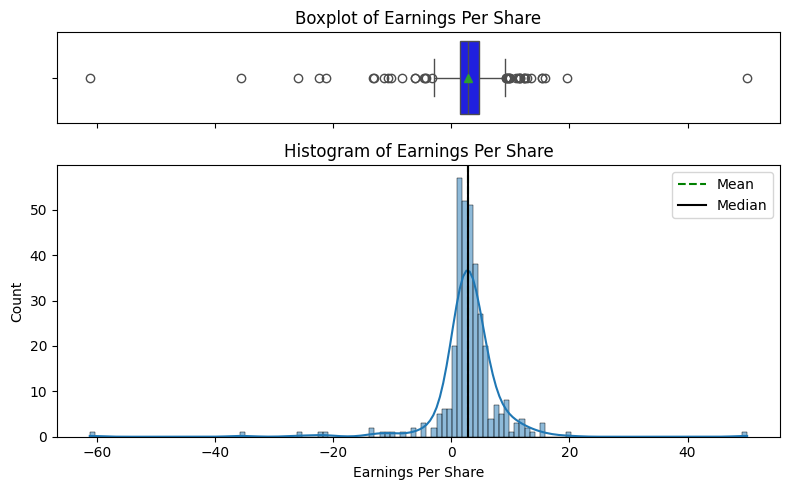

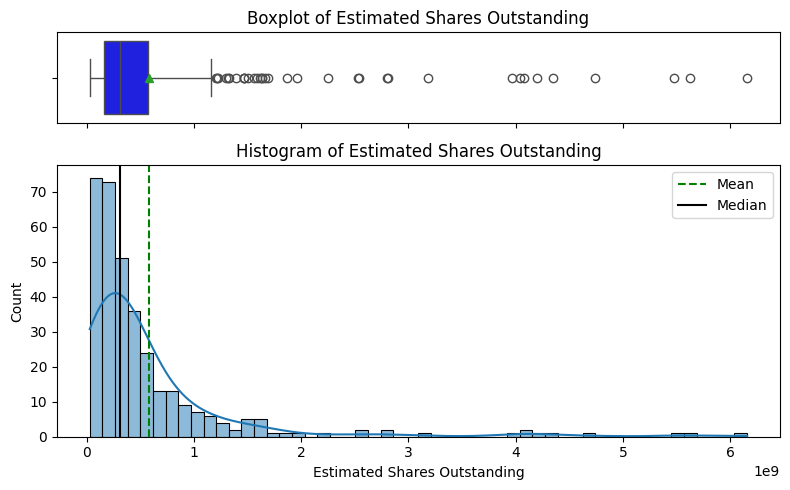

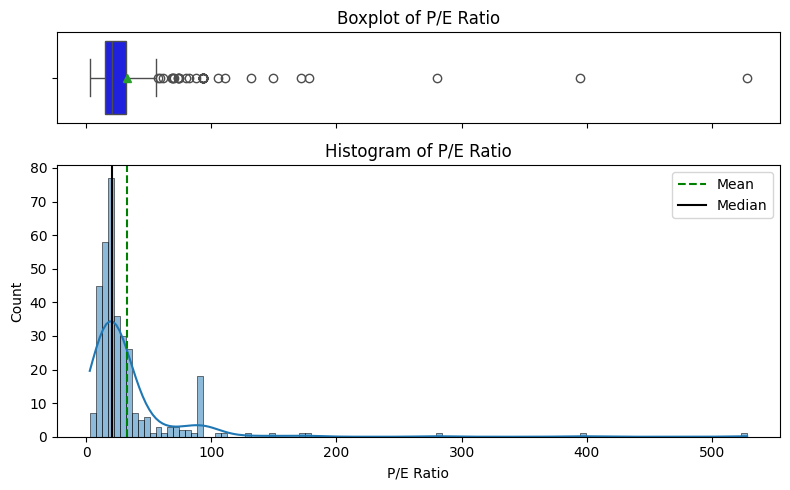

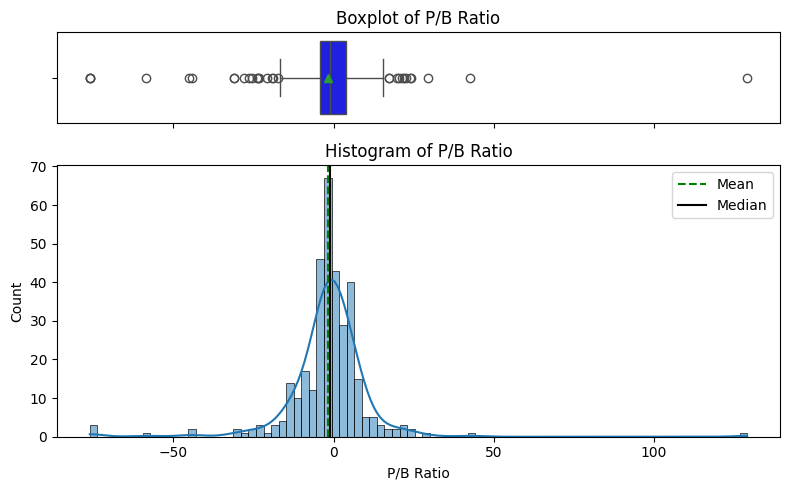

In [ ]:
# Drop categorical columns this time, so we can chart histograms and boxplots for the numerical features
df_eda_plot_num = df_eda.copy().drop(columns=list_catcol, axis=1)

# Analyze features
for feature in df_eda_plot_num.columns:
  histogram_boxplot(df_eda_plot_num, feature, figsize=(8, 5), kde=True, bins=None)

**OBSERVATIONS**

* The sectors break down as follows, in terms of sub sector industry security counts:

  * Industrials: 53 (15.59%)
  * Financials: 49 (14.41%)
  * Health Care: 40 (11.76%)
  * Consumer Discretionary: 40 (11.76%)
  * Information Technology: 33 (9.71%)
  * Energy: 30 (8.82%)
  * Real Estate: 27 (7.94%)
  * Utilities: 24 (7.06%)
  * Materials: 20 (5.88%)
  * Consumer Staples: 19 (5.59%)
  * Telecommunications Services: 5 (1.5%)

* Many of the features exhibit skewness, while a few appear normal. Most have outliers. In addition, the ranges of data vary on scales that are quite different. We will likely need to scale our data and calculate z-scores later prior to clustering the data.

    * Right-skewed
      * Current Price
      * Volatility
      * ROE
      * Cash Ratio
      * Estimated Shares Outstanding
      * P/E Ratio

    * Fairly normal
      * Price Change
      * Net Cash Flow
      * Net Income
      * Earnings Per Share
      * P/B Ratio

  For Current Price :
  * Mean = 80.86234477216765
  * Median = 59.705
  * Range = 4.5 to 1274.949951 ( 1270.45 )

  For Price Change :
  * Mean = 4.078193812467648
  * Median = 4.819504729
  * Range = -47.12969338 to 55.05168339 ( 102.181 )

  For Volatility :
  * Mean = 1.5259762538411765
  * Median = 1.3855929255000001
  * Range = 0.733163184 to 4.58004173 ( 3.847 )

  For ROE :
  * Mean = 39.59705882352941
  * Median = 15.0
  * Range = 1 to 917 ( 916 )

  For Cash Ratio :
  * Mean = 70.02352941176471
  * Median = 47.0
  * Range = 0 to 958 ( 958 )

  For Net Cash Flow :
  * Mean = 55537620.5882353
  * Median = 2098000.0
  * Range = -11208000000 to 20764000000 ( 31972000000 )

  For Net Income :
  * Mean = 1494384602.9411764
  * Median = 707336000.0
  * Range = -23528000000 to 24442000000 ( 47970000000 )

  For Earnings Per Share :
  * Mean = 2.776661764705882
  * Median = 2.895
  * Range = -61.2 to 50.09 ( 111.29 )

  For Estimated Shares Outstanding :
  * Mean = 577028337.7540295
  * Median = 309675137.79999995
  * Range = 27672156.86 to 6159292035.0 ( 6131619878.14 )

  For P/E Ratio :
  * Mean = 32.612563318264705
  * Median = 20.81987609
  * Range = 2.935450768 to 528.0390742 ( 525.104 )

  For P/B Ratio :
  * Mean = -1.7182493633029414
  * Median = -1.0671703205
  * Range = -76.11907749 to 129.0645854 ( 205.184 )


* The five most common GICS Sectors by percentage and counts, out of 340 total:
	* Industrials: 15.6% (53)
	* Financials: 14.4% (49)
	* Health Care: 11.8% (40)
	* Consumer Discretionary: 11.8% (40)
	* Information Technology: 9.7% (33)

* The five least common GICS Sectors by percentage and counts, out of 340 total:
	* Real Estate: 7.9% (27)
	* Utilities: 7.1% (24)
	* Materials: 5.9% (20)
	* Consumer Staples: 5.6% (19)
	* Telecommunications Services: 1.5% (5)

* The top 5 sub industry sectors are:
  * Oil & Gas Exploration & Production: 4.7% (16)
  * Industrial Conglomerates: 4.1% (14)
  * REITs: 4.1% (14)
  * Electric Utilities: 3.5% (12)
  * Internet Software & Services: 3.5% (12)

* We can also see that 42 of the worst-performing sub industry sectors have contributions of less than .3%.

###Bivariate Analysis

Next, let's identify any relationships between variables.

In order to do this, we need to ensure all variables can be compared. As we can see below, we have several categorical variables.

* Ticker Symbol: We will drop this unique value
* Security: We will also drop this unique value
* GICS Industry Sector: We will convert this to ranked numerical data
* GICS Sub Industry Sector: We will likely drop this at first, and investigate more deeply across the top or bottom industries, once we can assess relationships of the parent industry sectors.


In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   GICS Sector                   340 non-null    object 
 1   GICS Sub Industry             340 non-null    object 
 2   Current Price                 340 non-null    float64
 3   Price Change                  340 non-null    float64
 4   Volatility                    340 non-null    float64
 5   ROE                           340 non-null    int64  
 6   Cash Ratio                    340 non-null    int64  
 7   Net Cash Flow                 340 non-null    int64  
 8   Net Income                    340 non-null    int64  
 9   Earnings Per Share            340 non-null    float64
 10  Estimated Shares Outstanding  340 non-null    float64
 11  P/E Ratio                     340 non-null    float64
 12  P/B Ratio                     340 non-null    float64
dtypes: fl

In [ ]:
# Create new rankings for GICS Sector
unique_sectors = df_eda['GICS Sector'].unique()
ranked_categories = sorted(unique_sectors)
rank_mapping = {}

# Add a dictionary for friendly names
friendly_name_mapping = {}

# Populate mapping and rank
for rank, category in enumerate(ranked_categories):
    rank_mapping[category] = rank + 1
    friendly_name_mapping[category] = f"Rank {rank + 1}: {category}"  # Example friendly name

# Map the rankings and create a new column in the DataFrame
df_eda['GICS Sector Int'] = df_eda['GICS Sector'].map(rank_mapping)

In [ ]:
# Drop the non-numerical columns
cols_to_drop = ['GICS Sector', 'GICS Sub Industry']
df_eda_corr = df_eda.copy().drop(columns=cols_to_drop, axis=1)

# Preview new dataframe we will use for correlation heatmap
df_eda_corr

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,GICS Sector Int
0,42.349998,9.999995,1.687151,135,51,-604000000,7610000000,11.390000,668129938.500000,3.718174,-8.784219,6
1,59.240002,8.339433,2.197887,130,77,51000000,5144000000,3.150000,1633015873.000000,18.806350,-8.750068,5
2,44.910000,11.301121,1.273646,21,67,938000000,4423000000,2.940000,1504421769.000000,15.275510,-0.394171,5
3,93.940002,13.977195,1.357679,9,180,-240840000,629551000,1.260000,499643650.800000,74.555557,4.199651,7
4,55.320000,-1.827858,1.701169,14,272,315120000,696878000,0.310000,2247993548.000000,178.451613,1.059810,7
5,36.680000,-12.017268,1.516493,10,49,-189000000,1849000000,2.990000,618394648.800000,12.267559,7.496831,2
6,276.570007,6.189286,1.116976,30,25,90885000,596541000,8.910000,66951851.850000,31.040405,129.064585,7
7,43.230000,2.174424,1.124186,9,14,287000000,636000000,2.600000,244615384.600000,16.626923,-0.719497,11
8,58.270000,2.371753,1.068485,11,9,13900000,2052300000,3.130000,421897810.200000,18.456543,-3.022649,11
9,59.900002,3.027181,1.048295,14,99,-308000000,2533000000,5.880000,430782312.900000,10.187075,-1.883912,4


#### Correlation Heatmap

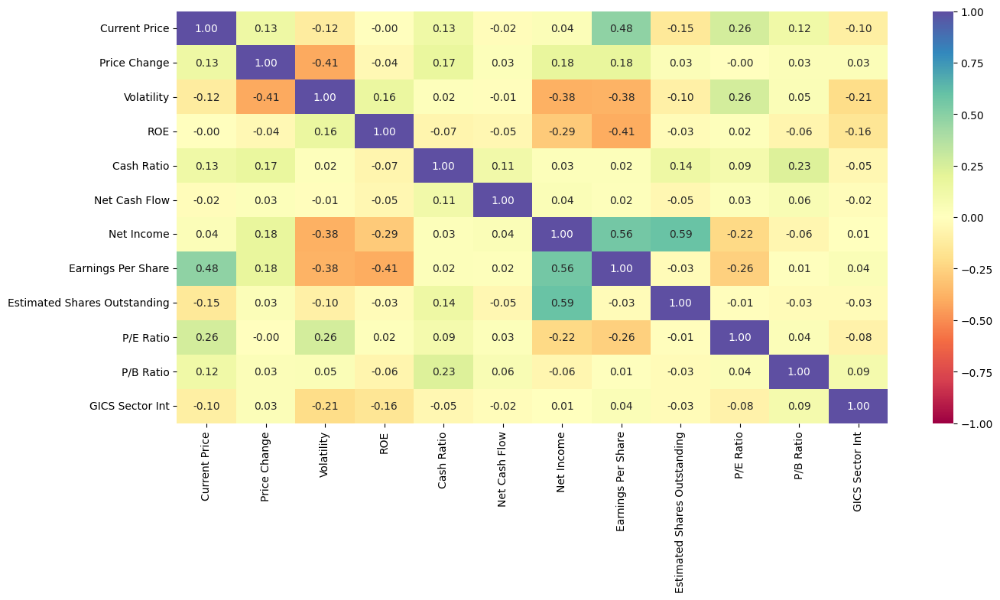

In [ ]:
# Plot correlation heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(df_eda_corr.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

##### Scale Data

Let's look at all the numerical variables with regard to sector.

To do this, we'll want to first normalize the scale of the various numerical series so we can get an accurate picture of how they vary by sector.

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   GICS Sector                   340 non-null    object 
 1   GICS Sub Industry             340 non-null    object 
 2   Current Price                 340 non-null    float64
 3   Price Change                  340 non-null    float64
 4   Volatility                    340 non-null    float64
 5   ROE                           340 non-null    int64  
 6   Cash Ratio                    340 non-null    int64  
 7   Net Cash Flow                 340 non-null    int64  
 8   Net Income                    340 non-null    int64  
 9   Earnings Per Share            340 non-null    float64
 10  Estimated Shares Outstanding  340 non-null    float64
 11  P/E Ratio                     340 non-null    float64
 12  P/B Ratio                     340 non-null    float64
 13  GICS 

In [ ]:
# Normalize the data
categorical_df_eda = df_eda[['GICS Sector', 'GICS Sector Int']] # we want to preserve the integer without scaling
numerical_df_eda = df_eda.drop(columns=['GICS Sector', 'GICS Sub Industry', 'GICS Sector Int'])

# Scale it using min-max method (vs. Z-score), since we want to preserve the relationships between data points
min_max_scaler = MinMaxScaler()
normalized_numerical_data = min_max_scaler.fit_transform(numerical_df_eda)

# Create dataframe for numerical correlation heatmap
normalized_df_eda = pd.DataFrame(normalized_numerical_data, columns=numerical_df_eda.columns)

# Combine back with sector for pairplot that recombines friendly Sector names
final_normalized_df_eda = pd.concat([categorical_df_eda, normalized_df_eda], axis=1)

In [ ]:
final_normalized_df_eda.head(5)

,GICS Sector,GICS Sector Int,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,Industrials,6,0.029793,0.559101,0.247990,0.146288,0.053236,0.331665,0.649114,0.652260,0.104452,0.001491,0.328169
1,Health Care,5,0.043087,0.542850,0.380757,0.140830,0.080376,0.352152,0.597707,0.578219,0.261814,0.030224,0.328335
2,Health Care,5,0.031808,0.571834,0.140499,0.021834,0.069937,0.379895,0.582677,0.576332,0.240842,0.023500,0.369059
3,Information Technology,7,0.070400,0.598024,0.162344,0.008734,0.187891,0.343024,0.503597,0.561236,0.076973,0.136392,0.391448
4,Information Technology,7,0.040002,0.443347,0.251634,0.014192,0.283925,0.360413,0.505001,0.552700,0.362110,0.334251,0.376145


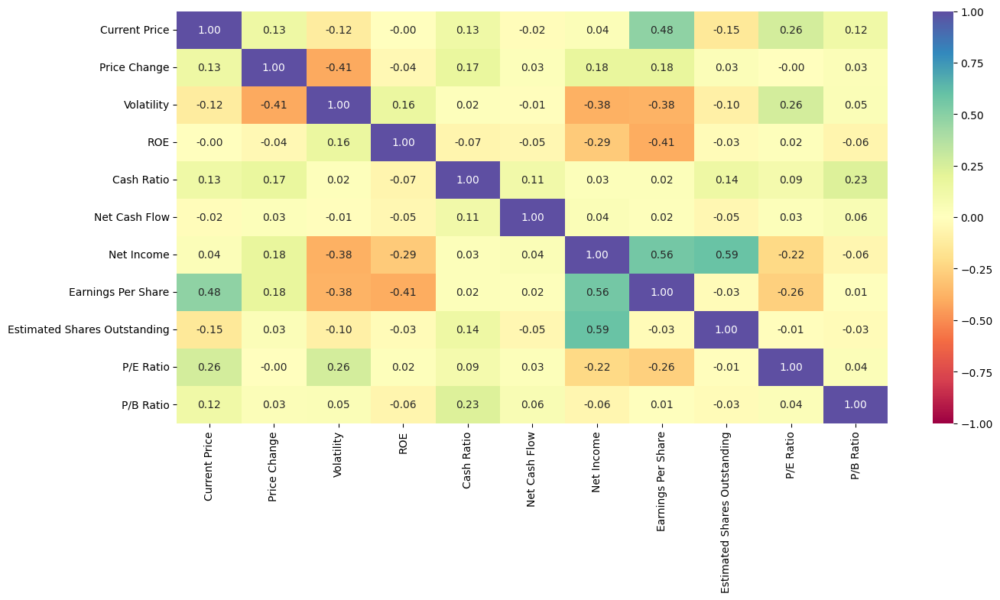

In [ ]:
#Re-plot the correlation heatmap using scaled data

# Convert scaled Numpy array results to dataframe
normalized_numerical_data_df = pd.DataFrame(normalized_numerical_data, columns=numerical_df_eda.columns)

# Plot new results
plt.figure(figsize=(15, 7))
sns.heatmap(normalized_numerical_data_df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

**OBSERVATIONS**

Our revised correlation matrix using scaled data modified the correlations considerably:

Positive correlations:

* Net Income and Estimated Shares Outstanding (.59)
* Net Income and Earnings per Share (.56)
* Earnings per Share and Current Price (.48)
* P/E Ratio and Current Price (.26)
* P/E Ratio and Volatility (.26)

Negative correlations:

* Price Change and Volatility (-.41)
* Net Income and Volatility (-.38)
* Net Income and ROE (-.29)
* Earnings per Share and Volatility (-.38)
* Earnings per Share and P/E Ratio (-.26)


#### Pairplot

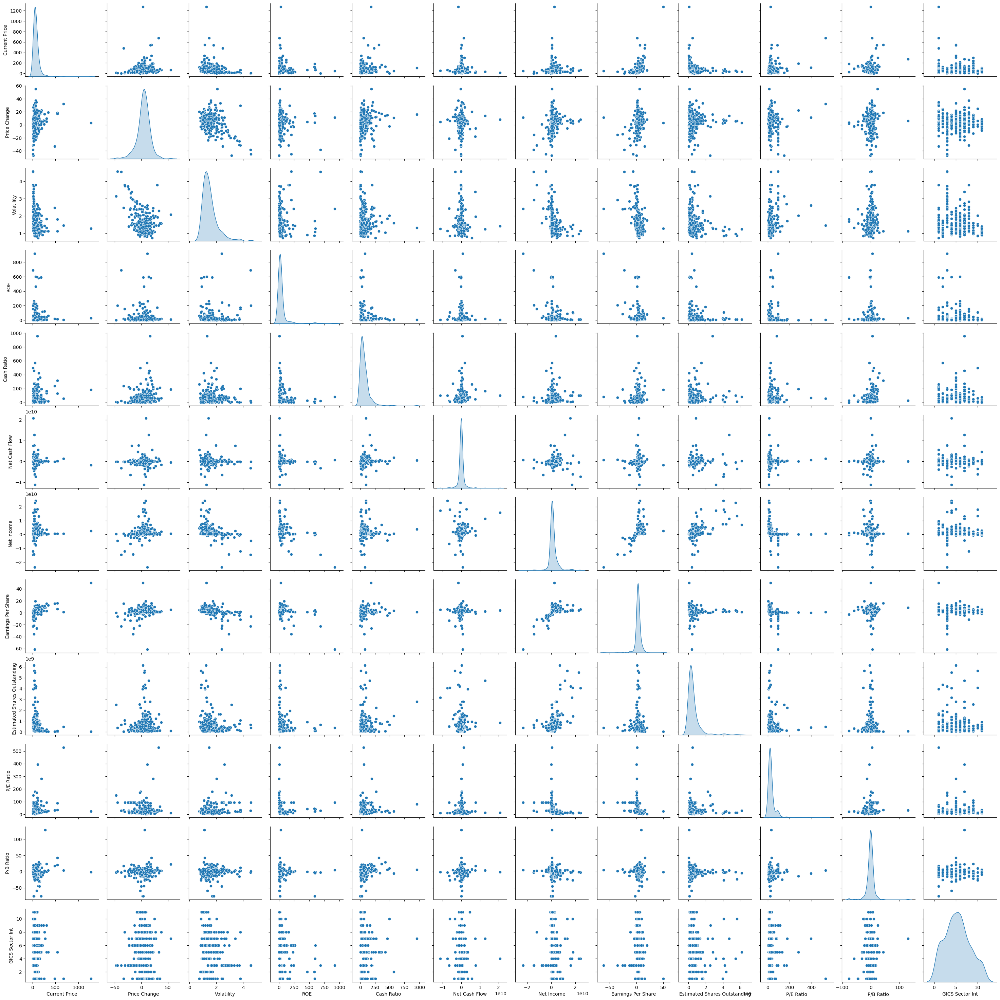

In [ ]:
# Create pairplot, noting the sector values
sns.pairplot(df_eda_corr, diag_kind='kde')

**OBSERVATIONS**

* The pairplot above clearly shows us that sector is an important feature with data clustered into multiple peaks, even though this isn't apparent in our correlation heatmap.

* Price Change and Net Income are fairly normally distributed

* P/E Ratio appears to be bi-modal.

* GICS Sector (converted to an integer) appears to be tri-modal.

* As noted earlier, many of the remaining features exhibit skewness (primary right-skewed).




#### Sector vs. Numerical Series

Since we have a major categorical variable (Sector), let's next compare each numerical series to it.

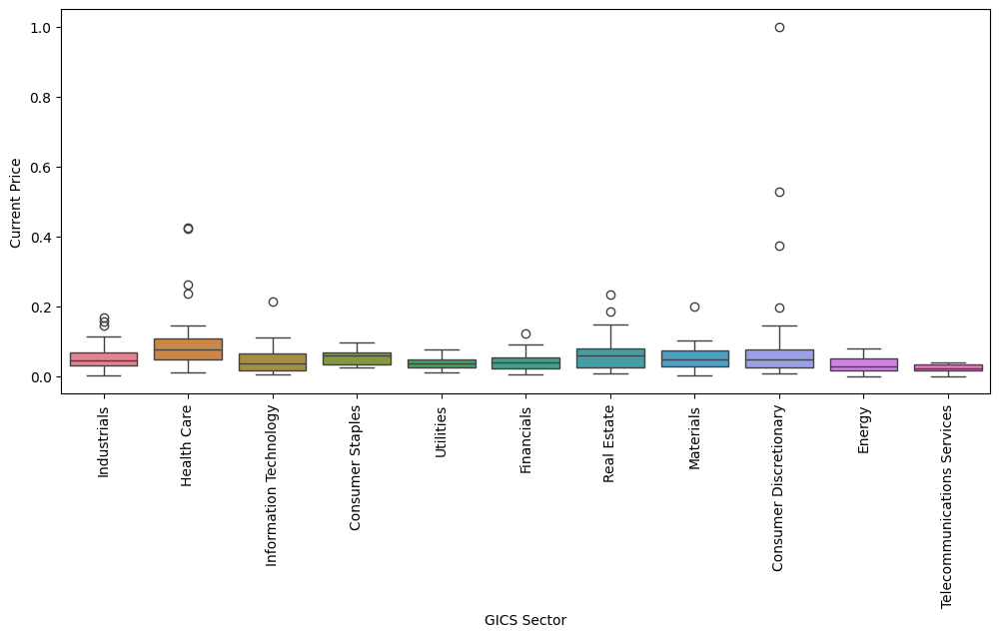

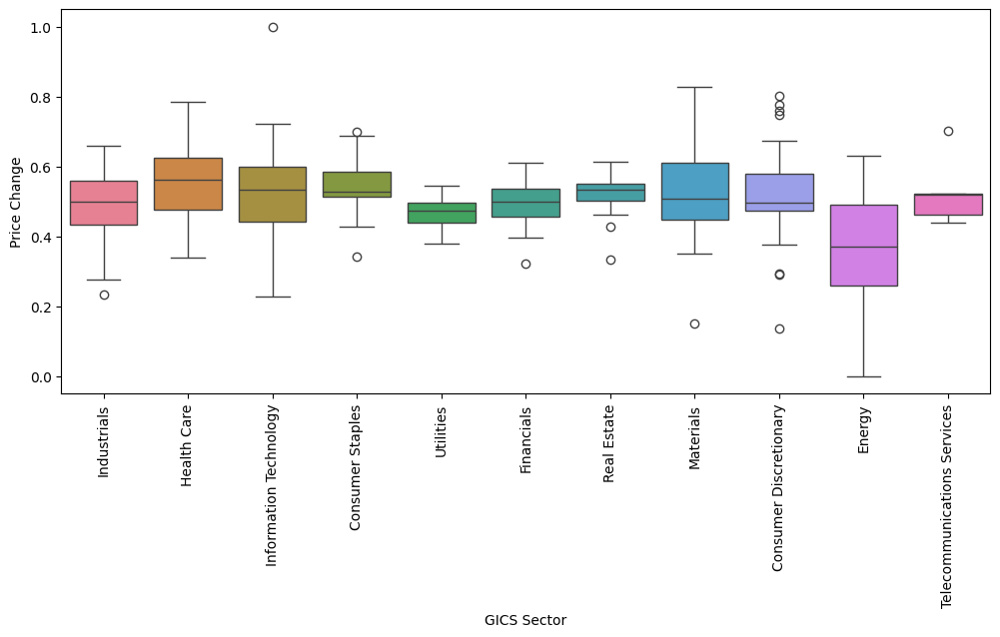

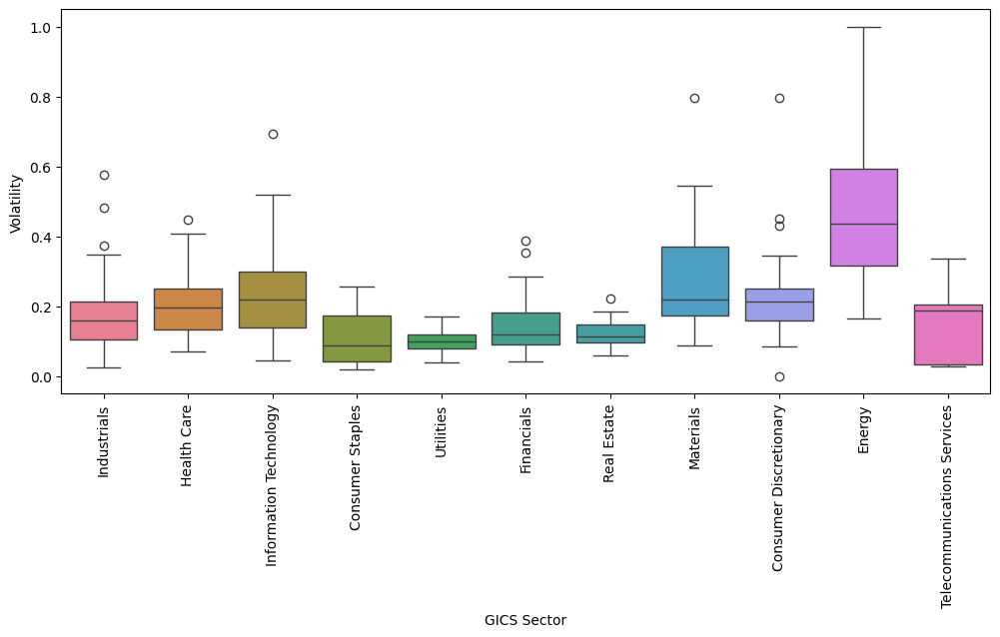

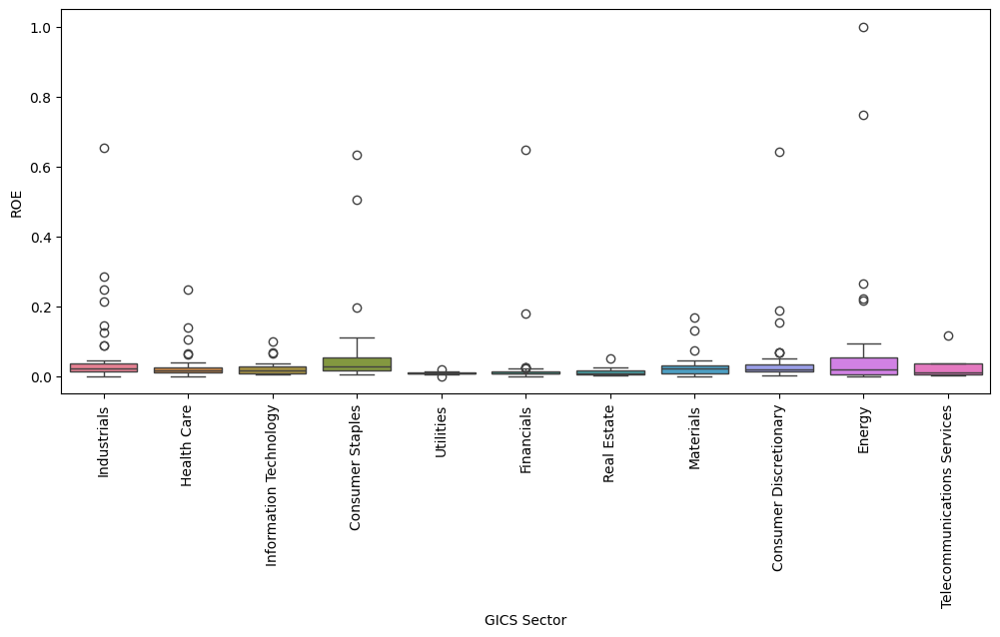

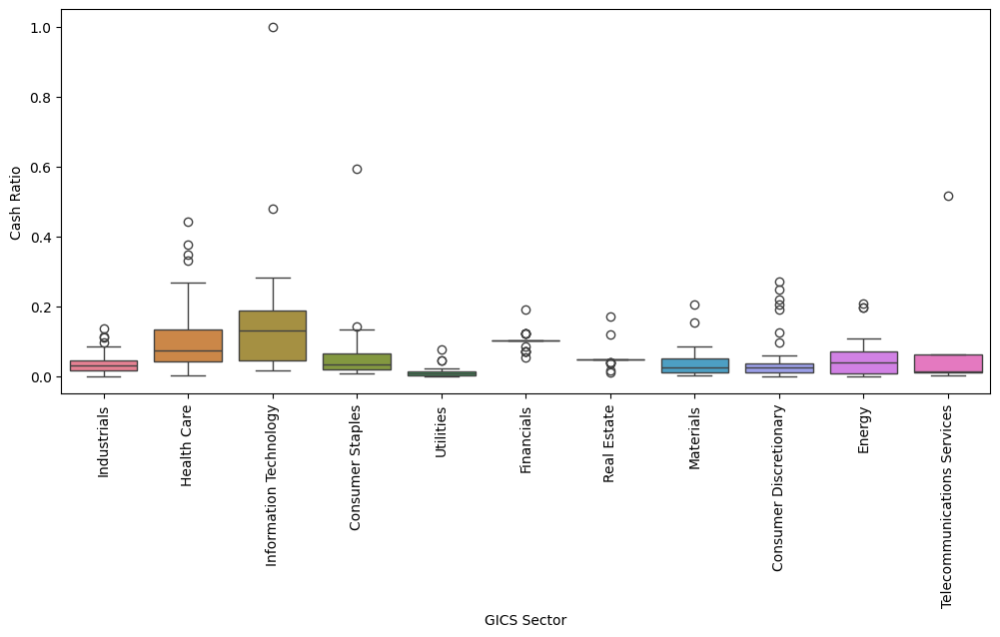

...

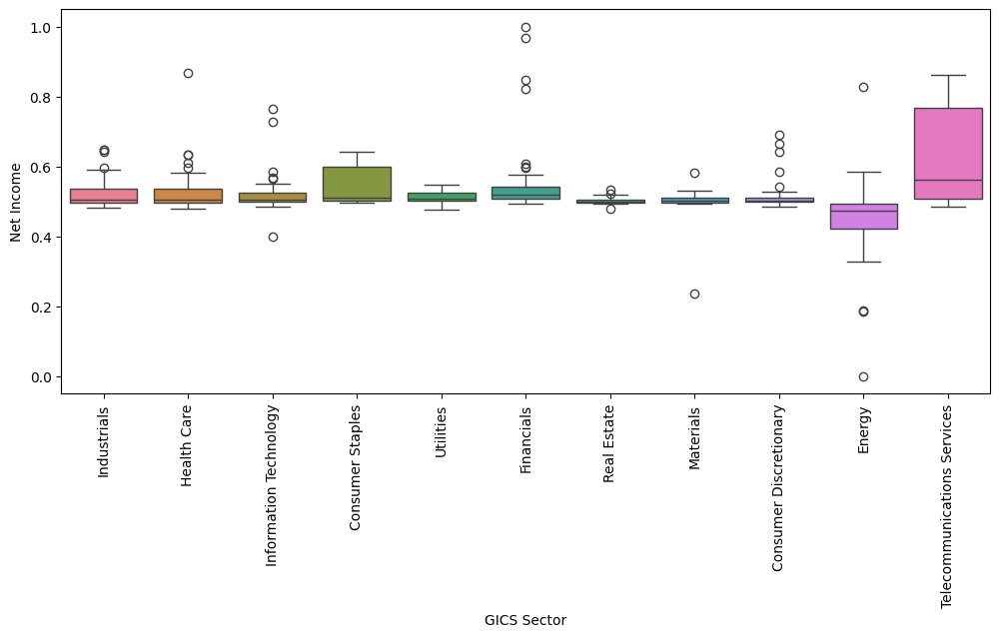

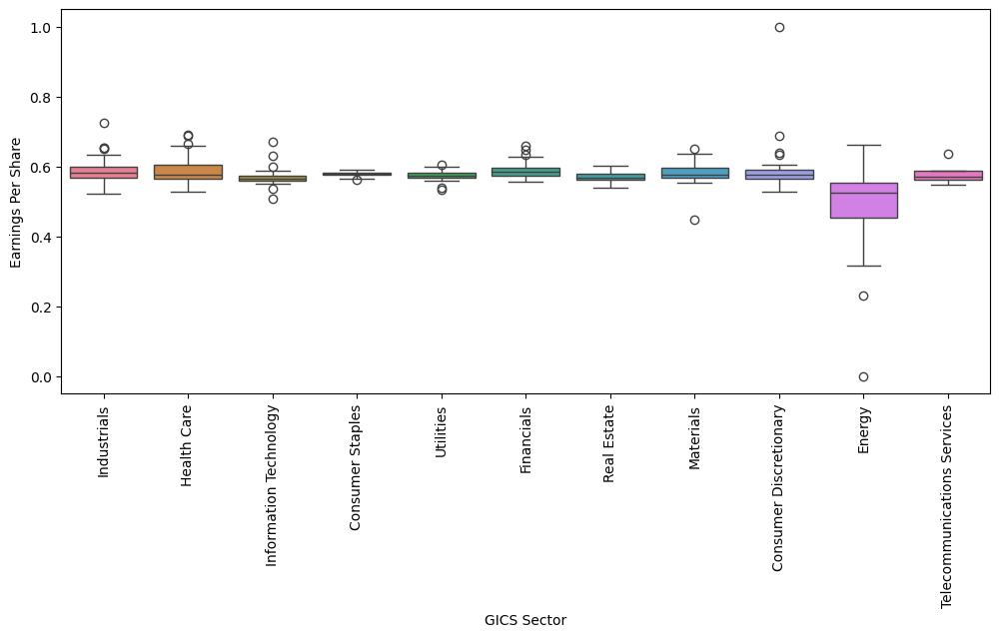

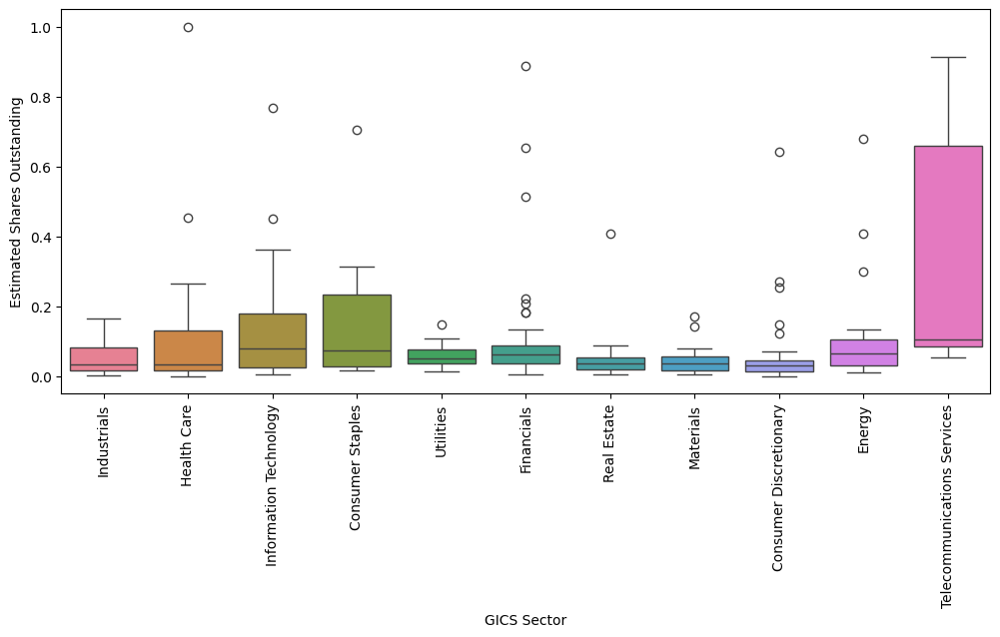

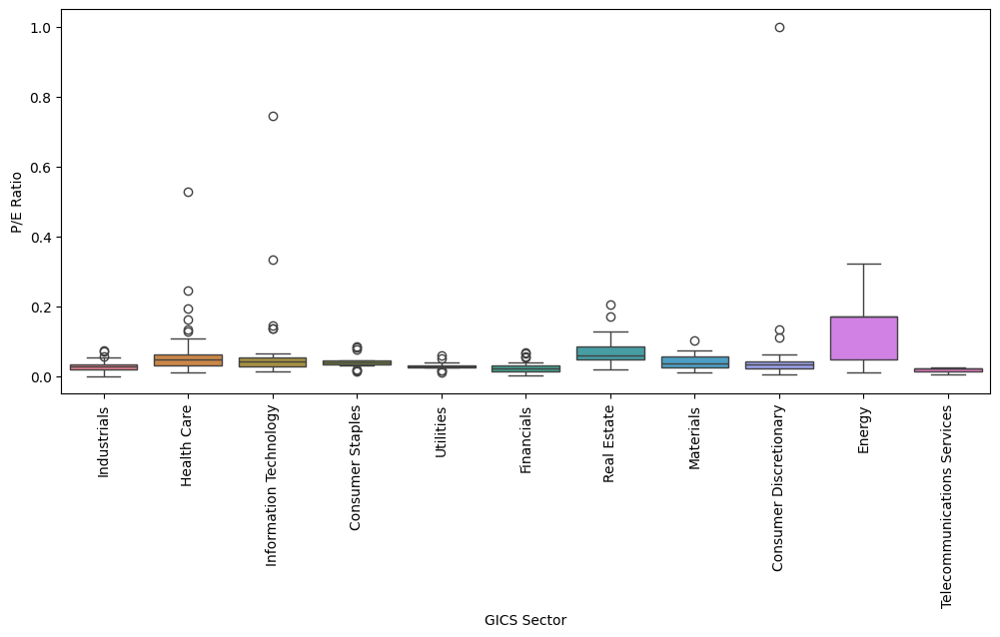

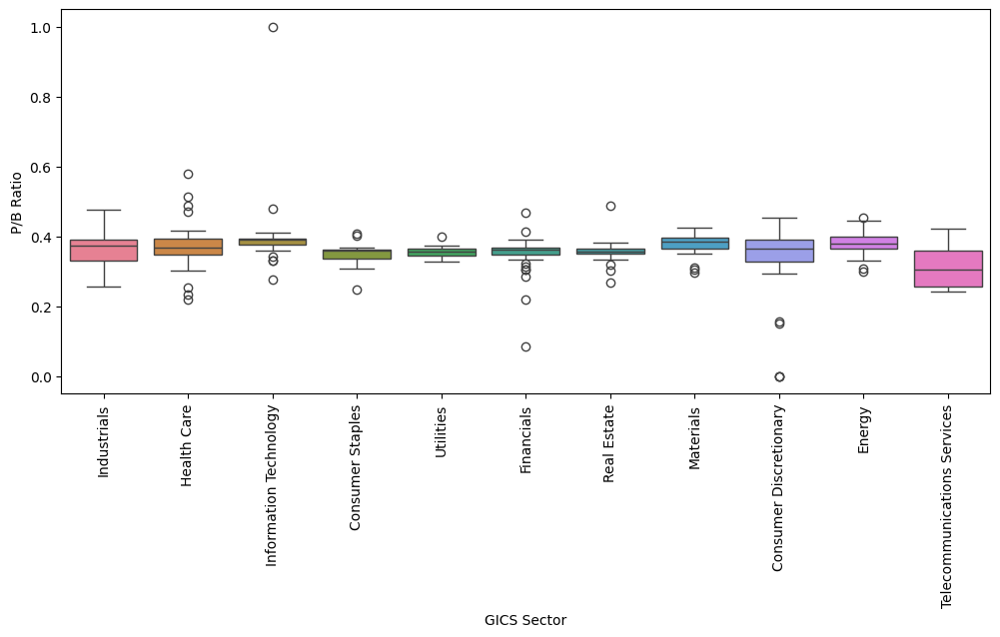

In [ ]:
# Show sector vs. other numeric series using normalized dataframe
for feature in list_numcol:
  plt.figure(figsize=(12, 5))
  sns.boxplot(data=final_normalized_df_eda, x='GICS Sector', y=feature, hue='GICS Sector')
  plt.xticks(rotation=90)
  plt.show()

**OBSERVATIONS**

For Sector vs. other variables, we can note a few apparent impacts. Energy in particular seems to have the widest range of values for numerous series.


* Current Price and ROE seem to vary widely by sector.

* Other series vary moderately by sector. Energy and Telecommunications in particular exhibit wide ranges.

  * Price Change: Energy, Materials, Information Technology, Health Care, Industrials
  * Volatility: Energy, Materials, Telecommunications
  * Cash Ratio: Information Technology, Health Care
  * Net Cash Flow: Telecommunications
  * Net Income: Telecommunications, Consumer Staples, Energy
  * Earnings per Share: Energy
  * Estimated Shares Outstanding: Telecommunications, Consumer Staples, Information Technology, Health Care
  * P/E Ratio: Energy
  * P/B Ratio: Telecommunications Services

###Questions to Answer

#####**Q1: What does the distribution of stock prices look like?**

In [ ]:
# Create pivot table for price by sector (counts and averages)
df_eda_sector_pivot = df_eda.pivot_table(
    index='GICS Sector',
    values='Current Price',
    aggfunc=['count', 'mean']  # Calculate both count and mean
)

# Rename the columns for clarity
df_eda_sector_pivot.columns = ['Count', 'Average Current Price']
df_eda_sector_pivot = df_eda_sector_pivot.reset_index()

# Calculate percentages relative to the total count, excluding the total row
total_counts = df_eda_sector_pivot['Count'].sum()
df_eda_sector_pivot['Percentage of Total'] = (df_eda_sector_pivot['Count'] / total_counts) * 100

# Sort the DataFrame by counts in descending order
df_eda_sector_pivot.sort_values(by='Average Current Price', ascending=False, inplace=True)

# Display the combined DataFrame
display(df_eda_sector_pivot)


,GICS Sector,Count,Average Current Price,Percentage of Total
4,Health Care,40,132.048250,11.764706
0,Consumer Discretionary,40,128.095404,11.764706
8,Real Estate,27,90.976925,7.941176
7,Materials,20,76.551501,5.882353
5,Industrials,53,74.411807,15.588235
1,Consumer Staples,19,71.972807,5.588235
6,Information Technology,33,63.548485,9.705882
3,Financials,49,58.659183,14.411765
10,Utilities,24,52.968542,7.058824
2,Energy,30,46.042334,8.823529


**Answer**

* As a whole, the range of Current Price is very wide, and it has a distinctly right-skewed distribution, with a maximum price of 1274.95 and minimum price of 4.50. Half of the stock prices fall below 80.86.
  * Mean: 80.86
  * Median: 59.71
  * Range: 1270.45
  * Standard Deviation: 98.06

* Looking by sector, the highest average prices belong to the Health Care and Consumer Discretionary sectors, both of which comprise about 11.8% each of our dataset and have prices averaging around 130.

* The lowest current prices belong to Telecommunications (1.5% of our dataset, at about 32.96) and Energy (8.8%, at 45.04).

* Consumer discretionary has the highest outliers of any sector.


#####**Q2: The stocks of which economic sector have seen the maximum price increase on average?**

Earlier, we found that the average price change was just over $4.

To answer this question, let's further compare the price changes by sector.

In [ ]:
# Show prior dataframe
df_stats[df_stats['Feature'] == 'Price Change']

,Feature,Mean,Median,Min,Max,Range,Standard Deviation,Variance,P-value
1,Price Change,4.078194,4.819505,-47.129693,55.051683,102.181377,12.006338,144.152149,0.000000


In [ ]:
# Create pivot table for price change by sector
df_eda_sector_price_change_pivot = df_eda.pivot_table(
    index='GICS Sector',
    values='Price Change',
    aggfunc=['mean', 'min', 'max']
)

df_eda_sector_price_change_pivot['Range'] = df_eda_sector_price_change_pivot['max'] - df_eda_sector_price_change_pivot['min']

df_eda_sector_price_change_pivot.columns = ['Mean Price Change', 'Min', 'Max', 'Range']
df_eda_sector_price_change_pivot.sort_values(by='Mean Price Change', ascending=False, inplace=True)
df_eda_sector_price_change_pivot = df_eda_sector_price_change_pivot.reset_index()

df_eda_sector_price_change_pivot

,GICS Sector,Mean Price Change,Min,Max,Range
0,Health Care,9.585652,-12.532337,33.177346,45.709684
1,Consumer Staples,8.684750,-12.017268,24.496225,36.513493
2,Information Technology,7.217476,-23.790903,55.051683,78.842586
3,Telecommunications Services,6.956980,-2.301255,24.707504,27.008759
4,Real Estate,6.205548,-13.067267,15.573900,28.641168
5,Consumer Discretionary,5.846093,-33.131268,34.803917,67.935185
6,Materials,5.589738,-31.685167,37.489677,69.174843
7,Financials,3.865406,-14.292764,15.462833,29.755597
8,Industrials,2.833127,-23.244191,20.432767,43.676958
9,Utilities,0.803657,-8.230553,8.596874,16.827427


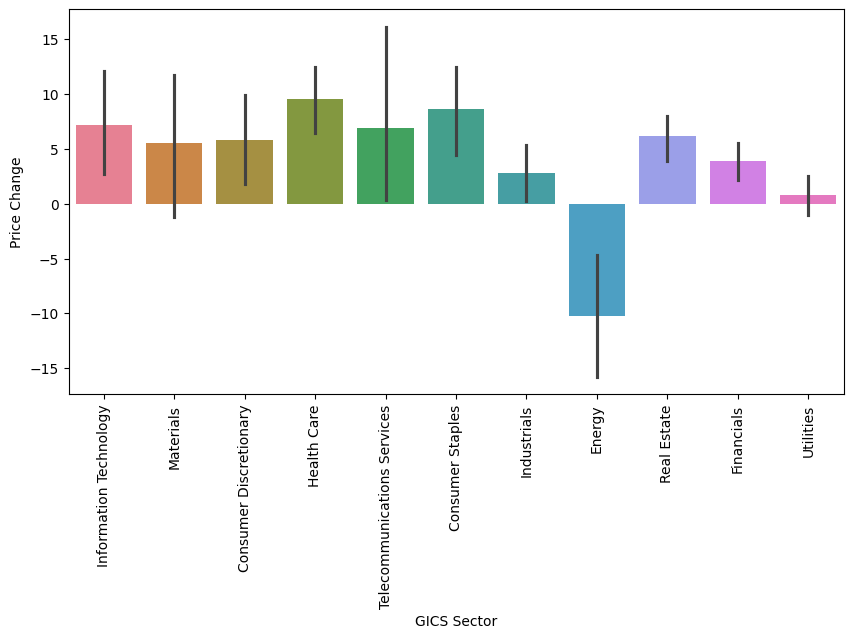

In [ ]:
# Visualize price change
plt.figure(figsize=(10, 5))
sns.barplot(data=df_eda.sort_values(by='Price Change', ascending=False), x='GICS Sector', y='Price Change', hue='GICS Sector')
plt.xticks(rotation=90)
plt.show()

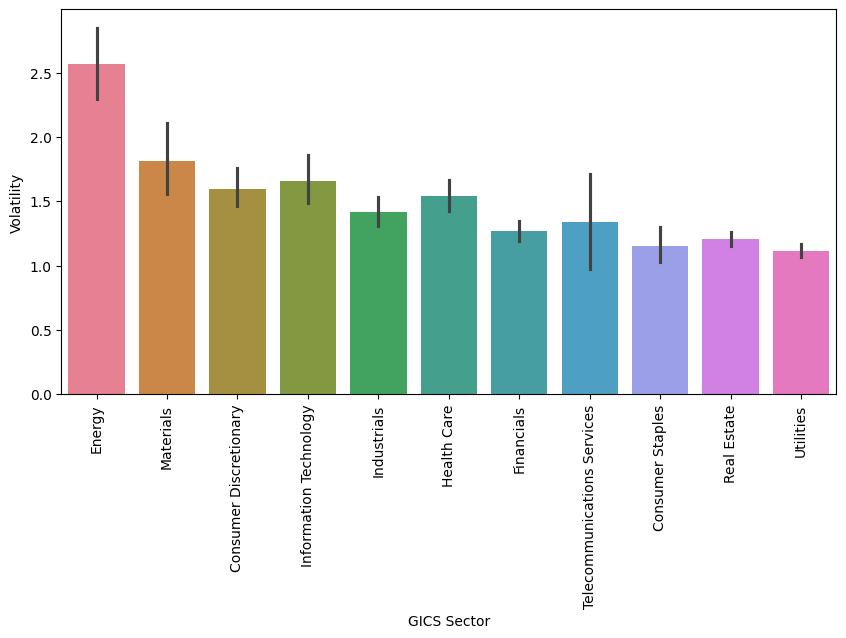

In [ ]:
# Visualize volatility
plt.figure(figsize=(10, 5))
sns.barplot(data=df_eda.sort_values(by='Volatility', ascending=False), x='GICS Sector', y='Volatility', hue='GICS Sector')
plt.xticks(rotation=90)
plt.show()

**OBSERVATIONS**

* Health Care has the highest average price change out of all sectors. The top three sectors with the highest average price change are:

  * Health Care: \$9.59 (3.5%)
  * Consumer Staples: \$8.68 (2.8%)
  * Information Technology: \$7.22 (7.6%)

* All sectors except the four listed below exceed the average price change of \$4.09:
  * Financials
  * Industrials
  * Utilities
  * Energy

* Energy is the only sector with an average negative price change, and also exhibits the second-highest range of values. It also has the most volatility in price.


#####**Q3: How are the different variables correlated with each other?**

Next, let's drill down by sector into scaled correlation data to see if the relationships differ widely by sector.

In [ ]:
rank_mapping

{'Consumer Discretionary': 1,
 'Consumer Staples': 2,
 'Energy': 3,
 'Financials': 4,
 'Health Care': 5,
 'Industrials': 6,
 'Information Technology': 7,
 'Materials': 8,
 'Real Estate': 9,
 'Telecommunications Services': 10,
 'Utilities': 11}

In [ ]:
final_normalized_df_eda

,GICS Sector,GICS Sector Int,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,Industrials,6,0.029793,0.559101,0.247990,0.146288,0.053236,0.331665,0.649114,0.652260,0.104452,0.001491,0.328169
1,Health Care,5,0.043087,0.542850,0.380757,0.140830,0.080376,0.352152,0.597707,0.578219,0.261814,0.030224,0.328335
2,Health Care,5,0.031808,0.571834,0.140499,0.021834,0.069937,0.379895,0.582677,0.576332,0.240842,0.023500,0.369059
3,Information Technology,7,0.070400,0.598024,0.162344,0.008734,0.187891,0.343024,0.503597,0.561236,0.076973,0.136392,0.391448
4,Information Technology,7,0.040002,0.443347,0.251634,0.014192,0.283925,0.360413,0.505001,0.552700,0.362110,0.334251,0.376145
5,Consumer Staples,2,0.025330,0.343628,0.203627,0.009825,0.051148,0.344645,0.529018,0.576781,0.096340,0.017772,0.407517
6,Information Technology,7,0.214152,0.521807,0.099773,0.031659,0.026096,0.353399,0.502909,0.629976,0.006406,0.053523,1.000000
7,Utilities,11,0.030485,0.482516,0.101647,0.008734,0.014614,0.359533,0.503731,0.573277,0.035381,0.026074,0.367474
8,Utilities,11,0.042324,0.484447,0.087167,0.010917,0.009395,0.350991,0.533256,0.578039,0.064294,0.029558,0.356249
9,Financials,4,0.043607,0.490861,0.081919,0.014192,0.103340,0.340923,0.543277,0.602750,0.065743,0.013810,0.361799


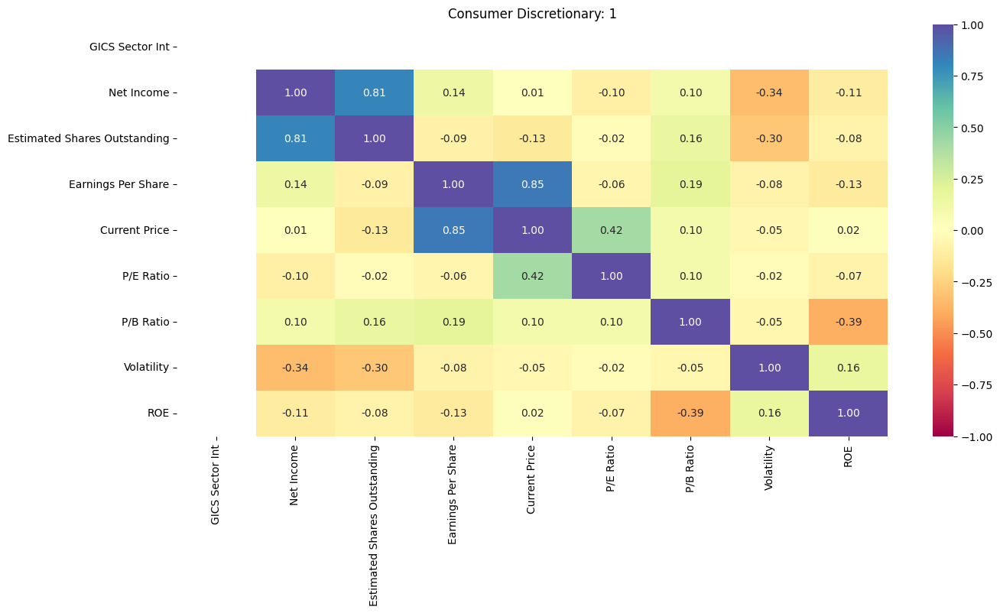

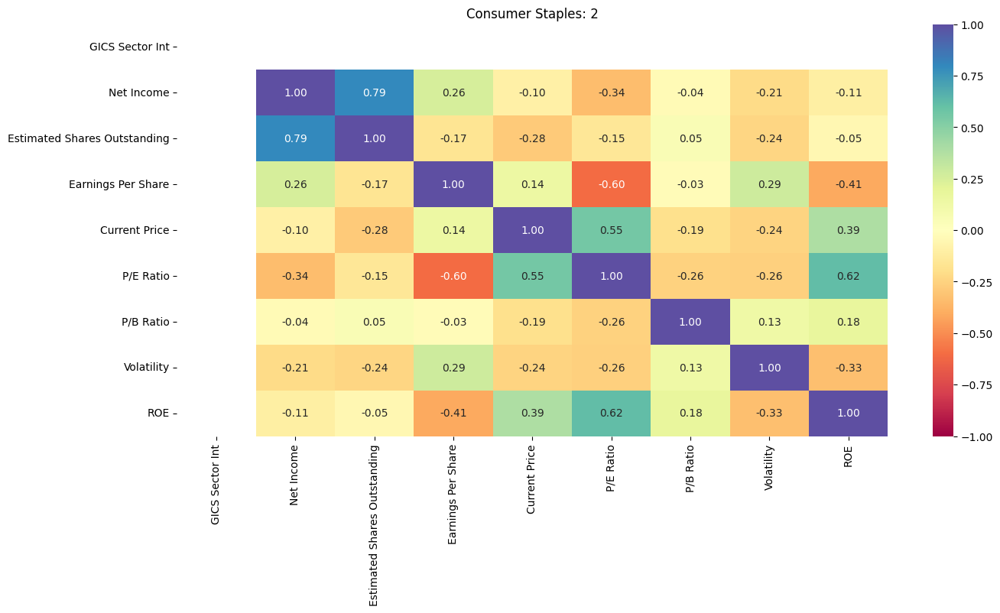

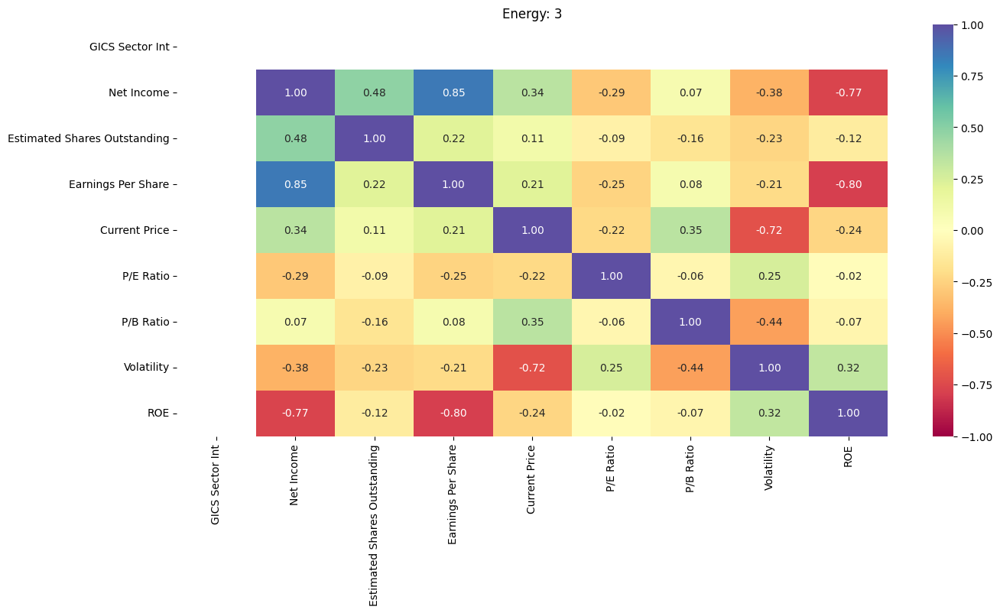

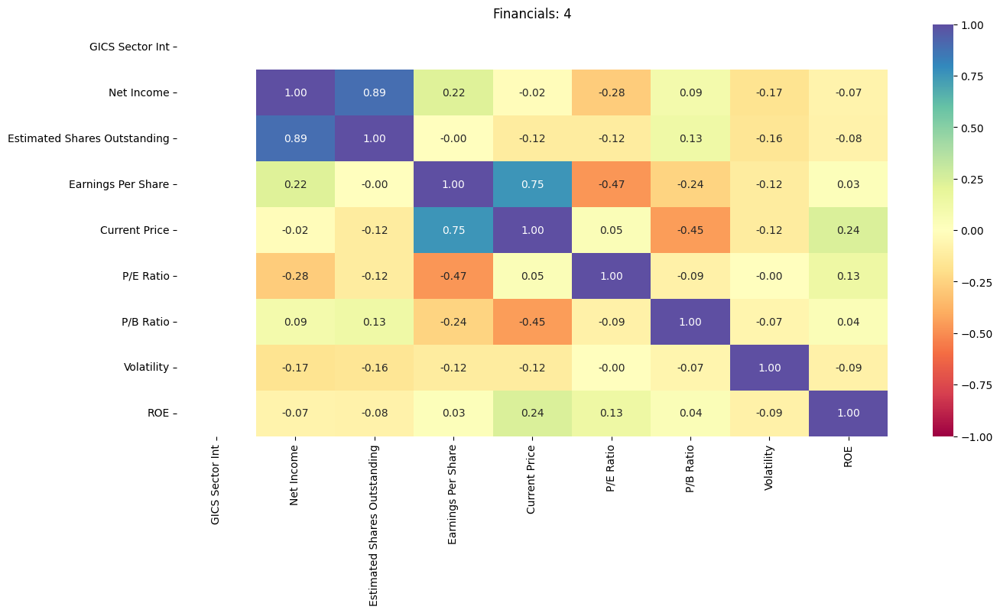

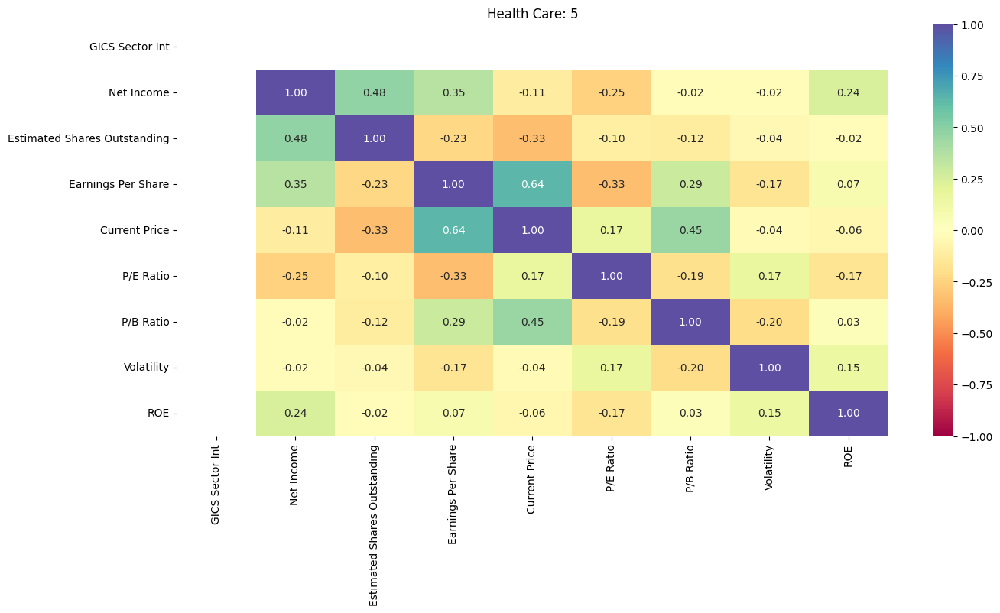

...

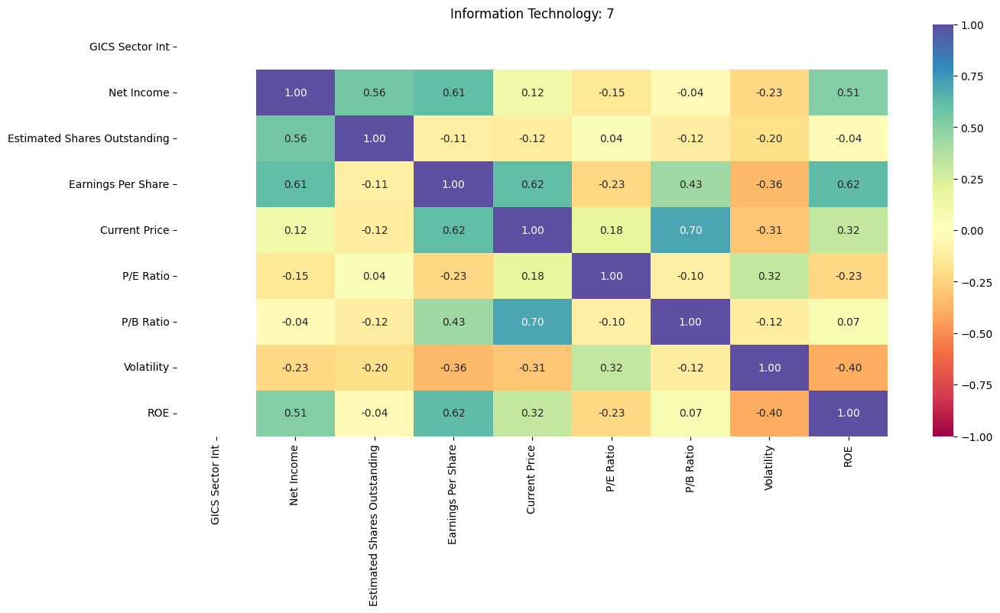

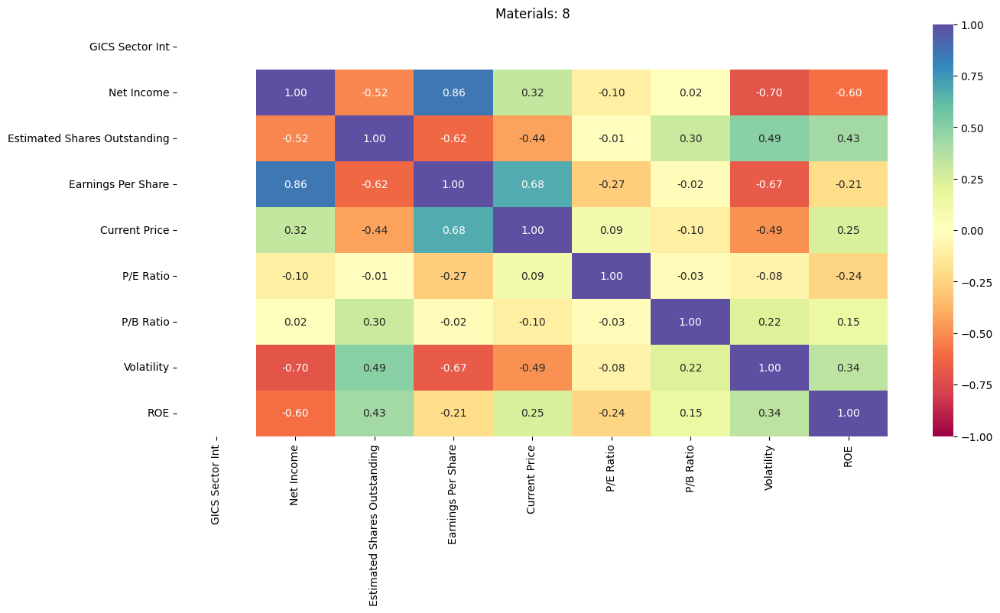

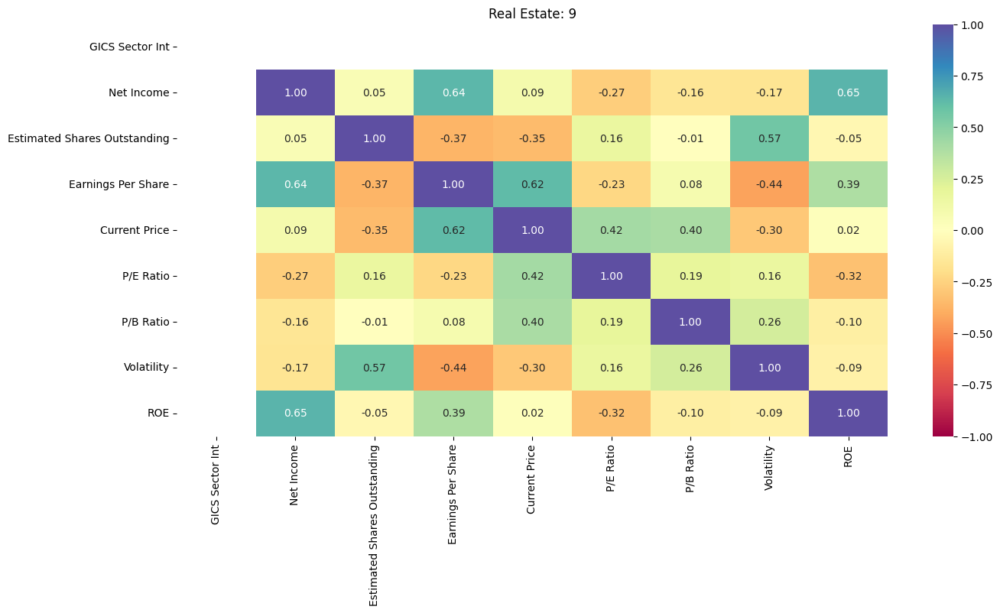

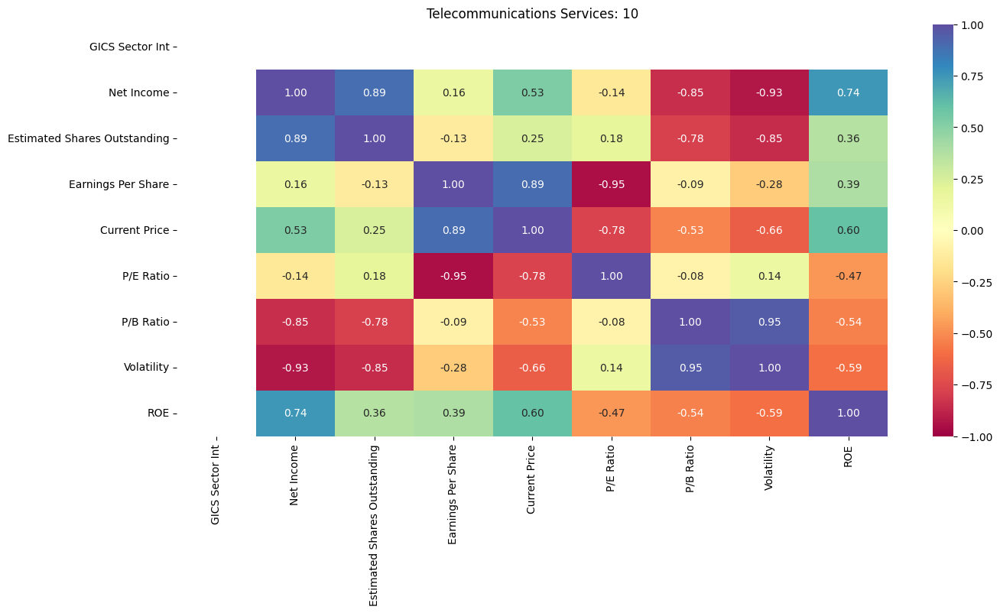

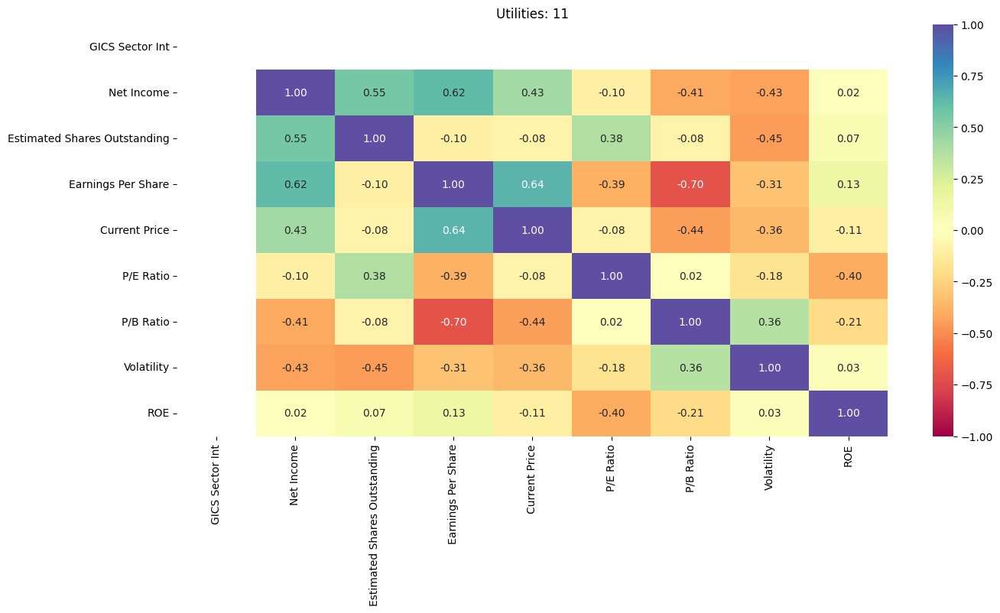

In [ ]:
# Plot new results for each sector, using only the top variables and our dictionary from earlier

#normalized_numerical_data_df is the scaled dataframe we created earlier as part of final_normalized_df_eda

cols_to_include = ['GICS Sector Int', 'Net Income', 'Estimated Shares Outstanding',
                   'Earnings Per Share', 'Current Price', 'P/E Ratio',
                   'P/B Ratio', 'Volatility', 'ROE']

# Create an empty DataFrame to store correlations
all_correlations = []

# Plot new results by sector
for friendly_name, rank in rank_mapping.items():
    # Filter the DataFrame for the current sector
    df_temp_corr = final_normalized_df_eda[cols_to_include]
    df_temp_corr = df_temp_corr[df_temp_corr['GICS Sector Int'] == rank]

    # Calculate the correlation matrix
    corr_matrix = df_temp_corr.corr()

    # Store the correlation matrix in a list with sector information
    corr_df = corr_matrix.stack().reset_index()
    corr_df.columns = ['Variable1', 'Variable2', 'Correlation']
    corr_df['Sector'] = friendly_name  # Add the sector name

    # Append to the list
    all_correlations.append(corr_df)

    # Plot the heatmap
    plt.figure(figsize=(15, 7))
    sns.heatmap(corr_matrix, annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
    plt.title(f'{friendly_name}: {rank}')
    plt.show()

# Concatenate all correlation DataFrames into one
all_correlations_df = pd.concat(all_correlations, ignore_index=True)

# Filter for correlations greater than 0.75 (and not equal to 1)
high_corrs = all_correlations_df[(all_correlations_df['Correlation'] > 0.75) & (all_correlations_df['Variable1'] != all_correlations_df['Variable2'])]



**ANSWER**

In our initial correlation observations earlier, we visualized the correlation of the variables in both their native and scaled form. The scaled version normalizes the values of each feature and gives us a better picture of correlations.

Summary of prior results, for a correlation scale of 0 to 1:

* Only a few of the variables show significant correlations (above .25 or below -.25).

* For the scaled data, it's worth nothing that Net Income is present in both the top 2 positive and negative correlations. We can infer that Net Income has a major effect on other aspects of a stock ticker.

* These series all show a positive correlation of greater than .25:

  * Net Income and Estimated Shares Outstanding (.59)
  * Net Income and Earnings per Share (.56)
  * Earnings per Share and Current Price (.48)
  * P/E Ratio and Current Price (.26)
  * P/E Ratio and Volatility (.26)

* These series all show a negative correlation of less than -.25:

  * Price Change and Volatility (-.41)
  * Net Income and Volatility (-.38)
  * Net Income and ROE (-.29)
  * Earnings per Share and Volatility (-.38)
  * Earnings per Share and P/E Ratio (-.26)



When we examine correlations by sector using our *scaled* data, we can observe some interesting information.

* Ten different correlations exist that are .75 or higher.
* The highest correlation exists between P/B Ratio and Volatility, for the Telecommunications Services sector.
* Telecommunications Services claims the top three correlations out of all features and sectors.
* Consumer Discretionary and Financials have  two apiece of the top 10 correlations.
* Net Income and Estimated Shares Outstanding surfaced as a top correlation for four different sectors.

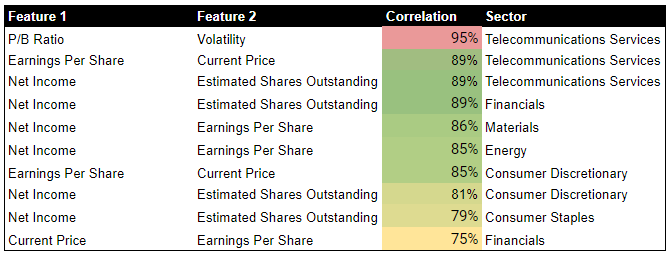

####**Q4: How does the average cash ratio vary across economic sectors?**

Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents.



In [ ]:
# Create pivot table for cash ratio by sector
df_eda_sector_cash_ratio_pivot = df_eda.pivot_table(
    index='GICS Sector',
    values='Cash Ratio',
    aggfunc='mean'
)

# Sort the DataFrame by mean in descending order
df_eda_sector_cash_ratio_pivot.sort_values(by='Cash Ratio', ascending=False, inplace=True)

# Display the combined DataFrame
display(df_eda_sector_cash_ratio_pivot)


,Cash Ratio
GICS Sector,
Information Technology,149.818182
Telecommunications Services,117.000000
Health Care,103.775000
Financials,98.591837
Consumer Staples,70.947368
Energy,51.133333
Real Estate,50.111111
Consumer Discretionary,49.575000
Materials,41.700000


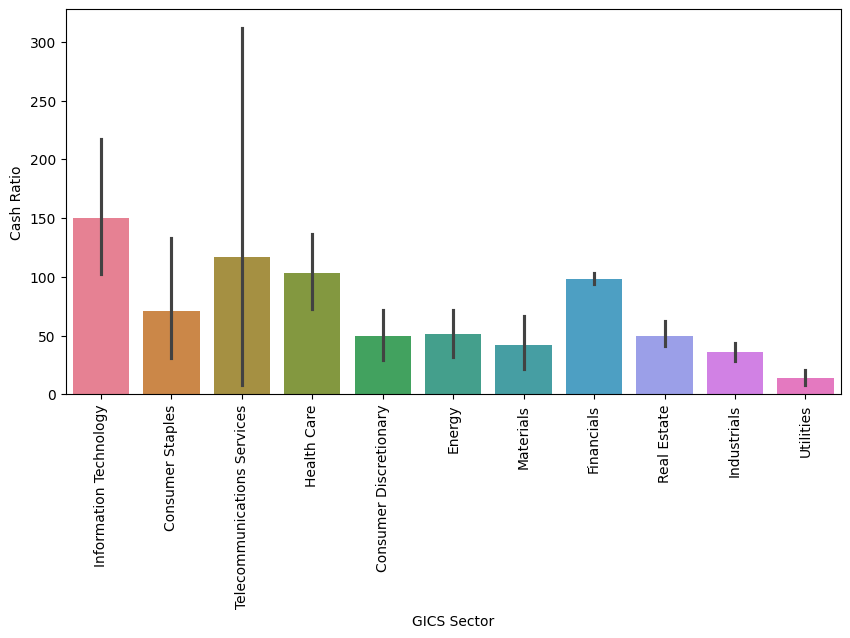

In [ ]:
# Visualize cash ratio
plt.figure(figsize=(10, 5))
sns.barplot(data=df_eda.sort_values(by='Cash Ratio', ascending=False), x='GICS Sector', y='Cash Ratio', hue='GICS Sector')
plt.xticks(rotation=90)
plt.show()

**ANSWER**

As a whole, the average Cash Ratio is 70.02, with a median of 47.0.
We can further examine by sector.

* The top five sectors all have an average cash ratio above the average Cash Ratio:

   * Information Technology: 149.82
   * Telecommunications Services: 117.00
   * Health Care:	103.78
   * Financials	98.59
   * Consumer Staples	70.95

* The bottom three sectors for average cash ratio are:
   * Materials:	41.70
   * Industrials: 36.19
   * Utilities: 13.63

* The widest ranges of Cash Ratios exist in the Telecommunications Services and Information Technology sectors. The highest levels of Cash Ratios exist in these sectors as well, and companies within this sector have a strong liquidity position, meaning they can easily cover their short-term obligations.

* Conversely, Utilities, Industrials and Real Estate have the tightest Cash Ratio ranges. Liquidity is low in these industries.

####**Q5: How does the P/E ratio vary, on average, across economic sectors?**

P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings.

In [ ]:
# Create pivot table for P/E Ratio by sector
df_eda_sector_pe_ratio_pivot = df_eda.pivot_table(
    index='GICS Sector',
    values='P/E Ratio',
    aggfunc='mean'
)

# Sort the DataFrame by mean in descending order
df_eda_sector_pe_ratio_pivot.sort_values(by='P/E Ratio', ascending=False, inplace=True)

# Display the combined DataFrame
display(df_eda_sector_pe_ratio_pivot)


,P/E Ratio
GICS Sector,
Energy,72.897709
Information Technology,43.782546
Real Estate,43.065585
Health Care,41.135272
Consumer Discretionary,35.211613
Consumer Staples,25.521195
Materials,24.585352
Utilities,18.719412
Industrials,18.259380


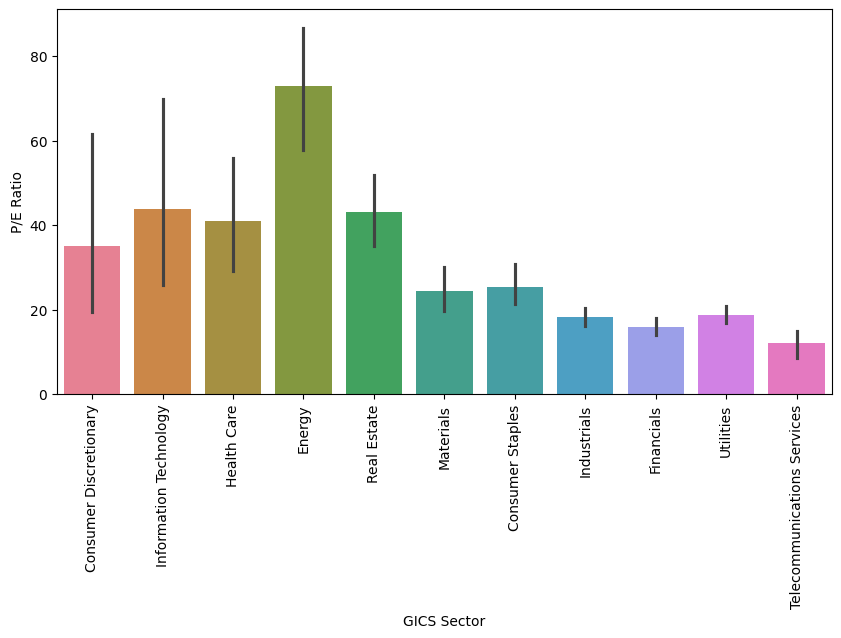

In [ ]:
# Visualize P/E ratio
plt.figure(figsize=(10, 5))
sns.barplot(data=df_eda.sort_values(by='P/E Ratio', ascending=False), x='GICS Sector', y='P/E Ratio', hue='GICS Sector')
plt.xticks(rotation=90)
plt.show()

**ANSWER**

The average P/E Ratio across all sectors is 32.61, with a median of 20.82. Again, we can further examine by sector.

Five sectors all have an average P/E ratio above the average, and companies are holding onto cash longer. The market is likely bullish on these industries and expect future growth and/or profitablity.
   * Energy:	72.90
   * Information Technology: 43.78
   * Real Estate: 43.07
   * Health Care: 41.14
   * Consumer Discretionary: 35.21

The bottom three sectors for average P/E ratio are as follows. These sectors are likely not expected to grow much or generate much profit, and do not maintain large cash reserves.
   * Industrials: 18.26
   * Financials: 16.02
   * Telecommunications Services: 12.22

* The widest range of P/E Ratios exist in the Information Technology and Consumer Discretionary sectors.

* The tightest range of P/E ratios exist in the Industrials, Financials, Utilities and Telecommunications Services sectors.


##Unsupervised Learning Analysis

The goal of our data analysis is to group stocks into similar clusters based on the data attributes we have in our dataset, so that we can define the characteristics of each group.

To do this, we need to:

* Understand the data through univariate and bivariate analysis (completed earlier)
* Pre-process the data to handle missing values and normalize/scale the data
* Decide what type of clustering solution to use
  * Use K-means clustering
  * Use Hierarchical clustering
  * Use Principal Component Analysis
* Select the algorithm we want to use and fit our final model
* Interpret the results

### Helpers

In [ ]:
# Import additional libraries
from scipy.spatial.distance import cdist

# Library to compute distances
from scipy.spatial.distance import cdist, pdist

# Library to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Library for principal component analysis
from sklearn.decomposition import PCA

# Library for scaling; RobustScaler is supposed to work better for datasets with outliers
from sklearn.preprocessing import RobustScaler

# Libraries for visualization
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.manifold import TSNE

# Library to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

### Data Preprocessing

- Duplicate value check
- Missing value treatment
- Outlier check
- Feature engineering (if needed)
- Any other preprocessing steps (if needed)

In [ ]:
# Copy the original dataframe before we begin
df_model = df.copy()

#### Value Check

We know from earlier that we are not missing any values, but let's double check.

In [ ]:
# Check data types
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

In [ ]:
# Describe the data. Can also use include=all to also show categorical series.
df_model.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ticker Symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.0,NaN,NaN,NaN,80.862345,98.055086,4.5,38.555,59.705,92.880001,1274.949951
Price Change,340.0,NaN,NaN,NaN,4.078194,12.006338,-47.129693,-0.939484,4.819505,10.695493,55.051683
Volatility,340.0,NaN,NaN,NaN,1.525976,0.591798,0.733163,1.134878,1.385593,1.695549,4.580042
ROE,340.0,NaN,NaN,NaN,39.597059,96.547538,1.0,9.75,15.0,27.0,917.0
Cash Ratio,340.0,NaN,NaN,NaN,70.023529,90.421331,0.0,18.0,47.0,99.0,958.0
Net Cash Flow,340.0,NaN,NaN,NaN,55537620.588235,1946365312.175789,-11208000000.0,-193906500.0,2098000.0,169810750.0,20764000000.0


#### Outlier Treatment

Our dataset is very small (340 rows of data). Below, we can observe quite a few outliers. However, eliminating these would remove a significant amount of data.
In addition, the top outlier in each area isn't consistently a single security, so we know that the most extreme outliers are not all the same security.

For these reasons, we will not remove any outliers. However, since we can observe a high number of outliers, we should carefully consider which clustering algorithms we select.

In [ ]:
# Check each feature to see if we have any single ticker/row as an outlier in all features

features = df_model.columns.difference(['Security'])

# Loop through each feature and print the Ticker Name with the maximum value
for feature in features:
    max_value_row = df_model.loc[df_model[feature].idxmax()]
    min_value_row = df_model.loc[df_model[feature].idxmin()]
    print(f'**{feature}**')
    print(f'  Max:  {max_value_row["Security"]} ({max_value_row[feature]})')
    print(f'  Min:  {min_value_row["Security"]} ({min_value_row[feature]})')

**Cash Ratio**
  Max:  Facebook (958)
  Min:  Charter Communications (0)
**Current Price**
  Max:  Priceline.com Inc (1274.949951)
  Min:  Chesapeake Energy (4.5)
**Earnings Per Share**
  Max:  Priceline.com Inc (50.09)
  Min:  Apache Corporation (-61.2)
**Estimated Shares Outstanding**
  Max:  Pfizer Inc. (6159292035.0)
  Min:  Mettler Toledo (27672156.86)
**GICS Sector**
  Max:  Ameren Corp (Utilities)
  Min:  Amazon.com Inc (Consumer Discretionary)
**GICS Sub Industry**
  Max:  American Water Works Company Inc (Water Utilities)
  Min:  Interpublic Group (Advertising)
**Net Cash Flow**
  Max:  Bank of America Corp (20764000000)
  Min:  Citigroup Inc. (-11208000000)
**Net Income**
  Max:  JPMorgan Chase & Co. (24442000000)
  Min:  Apache Corporation (-23528000000)
**P/B Ratio**
  Max:  Alliance Data Systems (129.0645854)
  Min:  Charter Communications (-76.11907749)
**P/E Ratio**
  Max:  Amazon.com Inc (528.0390742)
  Min:  United Continental Holdings (2.935450768)
**Price Change**
  

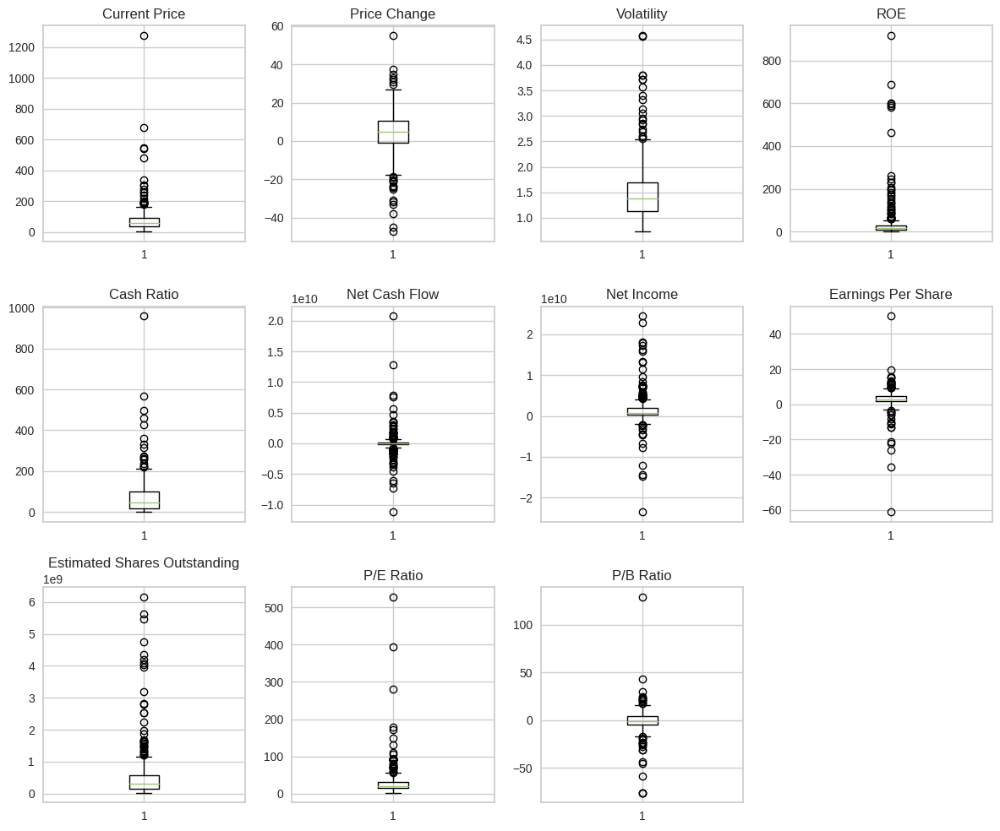

In [ ]:
# Create tight boxplots to show outliers
plt.figure(figsize=(12, 10))

num_cols = df_model.select_dtypes(include=np.number).columns.tolist()

for i, col in enumerate(num_cols):
    plt.subplot(3, 4, i + 1)
    plt.boxplot(df_model[col], whis=1.5)
    plt.tight_layout()
    plt.title(col)

plt.show()

In [ ]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

In [ ]:
# One-hot encode variables for Sector and Sub Sector: Determined we don't want to do this
#df_model_clean = pd.get_dummies(df_model_clean, columns=['GICS Sector'])
#df_model_clean = pd.get_dummies(df_model_clean, columns=['GICS Sub Industry'])

In [ ]:
# Drop unique values: Determined we don't want to do this
#df_model_clean = df_model_clean.drop(['Ticker Symbol', 'Security'], axis=1)

In [ ]:
df_model.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ticker Symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.0,NaN,NaN,NaN,80.862345,98.055086,4.5,38.555,59.705,92.880001,1274.949951
Price Change,340.0,NaN,NaN,NaN,4.078194,12.006338,-47.129693,-0.939484,4.819505,10.695493,55.051683
Volatility,340.0,NaN,NaN,NaN,1.525976,0.591798,0.733163,1.134878,1.385593,1.695549,4.580042
ROE,340.0,NaN,NaN,NaN,39.597059,96.547538,1.0,9.75,15.0,27.0,917.0
Cash Ratio,340.0,NaN,NaN,NaN,70.023529,90.421331,0.0,18.0,47.0,99.0,958.0
Net Cash Flow,340.0,NaN,NaN,NaN,55537620.588235,1946365312.175789,-11208000000.0,-193906500.0,2098000.0,169810750.0,20764000000.0


#### Scaling Treatment

We observed earlier that we have a high outlier count, and also major discrepancies of scale in our features. When we examined correlations, we normalized the data. We will need to similar do this to our base model data.

We can choose between several different types of scaling - MinMaxScaler, Z-score, or Robust. Since Robust works well with datasets containing outliers, we will use it.

In [ ]:
# Initialize the RobustScaler
scaler = RobustScaler()

subset = df_model.select_dtypes(include=['number']).copy()

# Scale the data
subset_scaled = scaler.fit_transform(subset)

# Convert to DataFrame
df_model_scaled = pd.DataFrame(subset_scaled, columns=subset.columns)

### Cluster Algorithm Selection

Next, let's see which clustering technique works best for our scaled dataset. To do this, we will first run PCA, and then use two clustering techniques.

* Principal Component Analysis (reduce dimensionality)
* K-Means Clustering (find ideal number of clusters)
* Hierarchical Clustering

#### K-means Clustering

First, we will attempt to visualize various k values to determine which one we want to use moving forward. To do this we will leverage the elbow method and visualize the distortion for each k value.

# of Clusters: 1 	Average Distortion: 6.165015784179755
# of Clusters: 2 	Average Distortion: 5.519913922135517
# of Clusters: 3 	Average Distortion: 5.301175199731372
# of Clusters: 4 	Average Distortion: 5.128821925696185
# of Clusters: 5 	Average Distortion: 4.852367478608126
# of Clusters: 6 	Average Distortion: 4.564025418031926
# of Clusters: 7 	Average Distortion: 4.454884657269399
# of Clusters: 8 	Average Distortion: 4.221774350762034
# of Clusters: 9 	Average Distortion: 4.191296800846647
# of Clusters: 10 	Average Distortion: 4.079244586736443
# of Clusters: 11 	Average Distortion: 3.829791083252664
# of Clusters: 12 	Average Distortion: 3.753949415523762
# of Clusters: 13 	Average Distortion: 3.6369603635468146
# of Clusters: 14 	Average Distortion: 3.596860202066002
# of Clusters: 15 	Average Distortion: 3.445799561982341


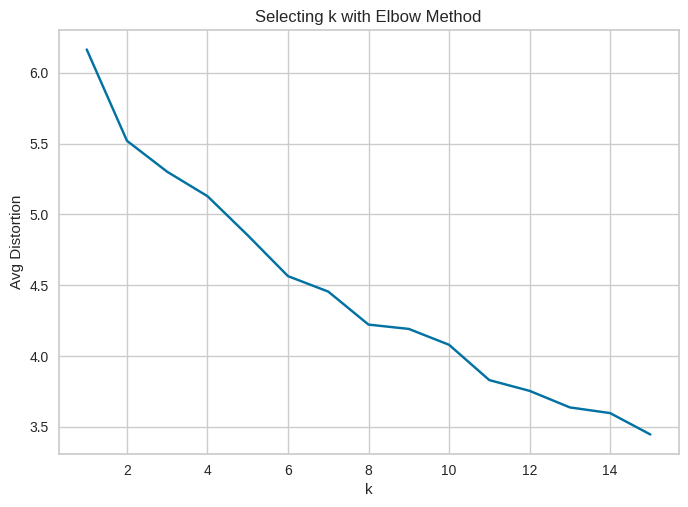

CPU times: user 409 ms, sys: 112 ms, total: 521 ms
Wall time: 488 ms


In [ ]:
# Measure execution time
%%time

# Identify desired cluster count
df_k_means = df_model_scaled.copy()

clusters = range(1, 16)
meanDistortions = []

# Loop through cluster values
for k in clusters:
    model_k_means = KMeans(n_clusters=k)
    model_k_means.fit(df_k_means)
    prediction = model_k_means.predict(df_k_means)
    distortion = (
        sum(
            np.min(cdist(df_k_means, model_k_means.cluster_centers_, 'euclidean'), axis=1)
        )
        / df_k_means.shape[0]
    )

    meanDistortions.append(distortion)

    print('# of Clusters:', k, '\tAverage Distortion:', distortion)

plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Avg Distortion')
plt.title('Selecting k with Elbow Method')
plt.show()


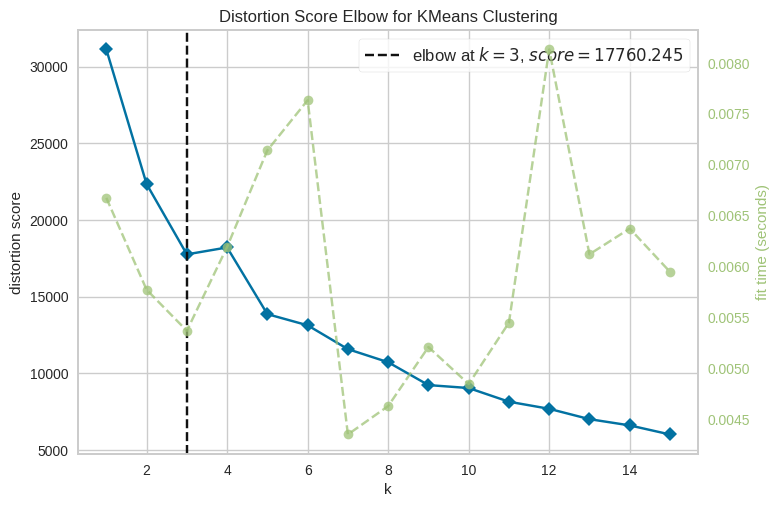

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Fit the model to the visualizer
model_k_means_2 = KMeans(random_state=1)
visualizer = KElbowVisualizer(model_k_means_2, k=(1, 16), timings=True)
visualizer.fit(df_k_means)
visualizer.show()

n_clusters=2: Silhouette score=0.7757324276239033)
n_clusters=3: Silhouette score=0.7454764840420494)
n_clusters=4: Silhouette score=0.4621955535259713)
n_clusters=5: Silhouette score=0.4829025199901958)
n_clusters=6: Silhouette score=0.4813819928027789)
n_clusters=7: Silhouette score=0.49576783422468745)
n_clusters=8: Silhouette score=0.411864134740954)
n_clusters=9: Silhouette score=0.4012633404812339)
n_clusters=10: Silhouette score=0.3763626634759577)
n_clusters=11: Silhouette score=0.3505016857108297)
n_clusters=12: Silhouette score=0.3613349297613386)
n_clusters=13: Silhouette score=0.3806084017704855)
n_clusters=14: Silhouette score=0.3183846743555661)
n_clusters=15: Silhouette score=0.27805939414564607)


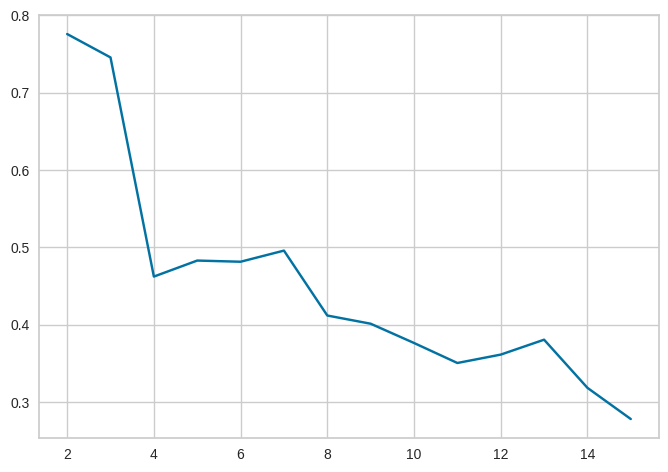

In [ ]:
# Check silhouette scores
sil_score = []

cluster_list = range(2, 16)

for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict((df_k_means))
    score = silhouette_score(df_k_means, preds)
    sil_score.append(score)
    print('n_clusters={}: Silhouette score={})'.format(n_clusters, score))

plt.plot(cluster_list, sil_score)
plt.show()

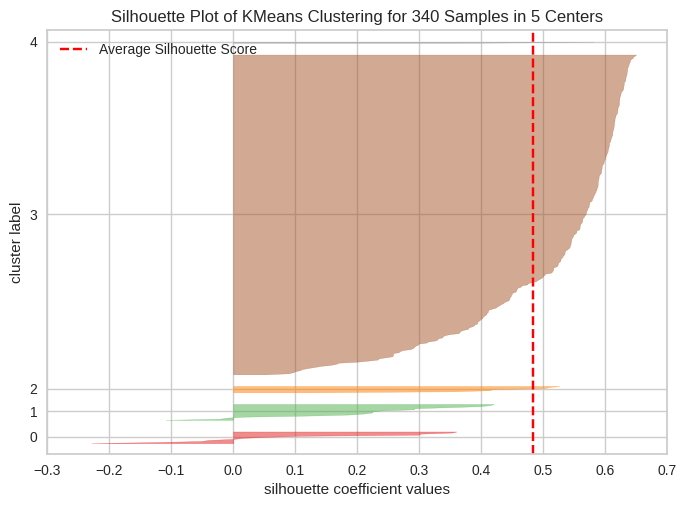

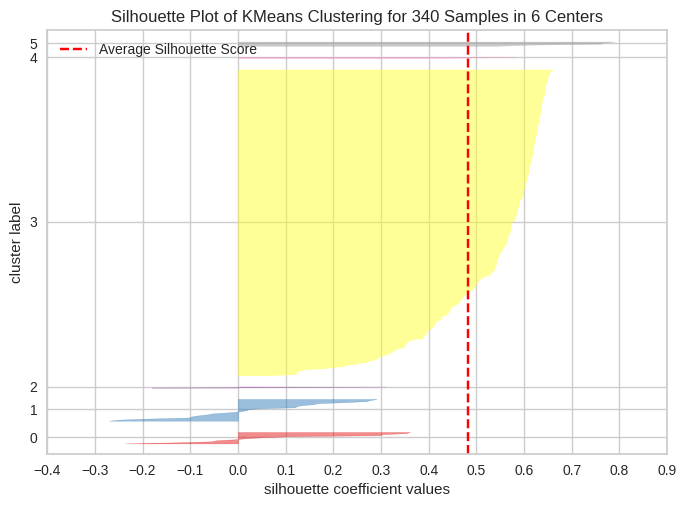

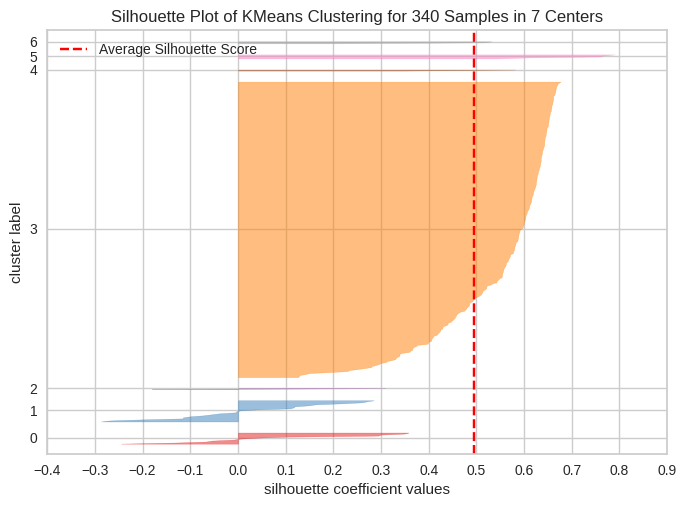

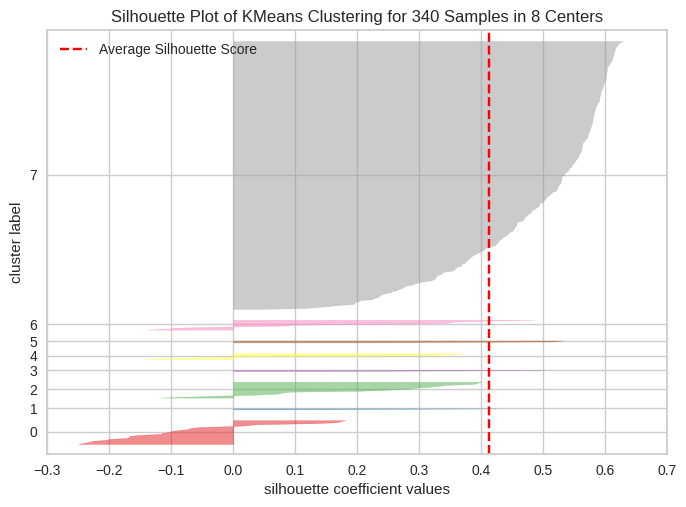

In [ ]:
# Visualize the silhouette score for various values between 5 and 8

for i in range(5, 9):
    visualizer = SilhouetteVisualizer(KMeans(i, random_state=1))
    visualizer.fit(df_k_means)
    visualizer.show()

In [ ]:
# Run again for the ideal cluster count for k-means
kmeans = KMeans(n_clusters=5, random_state=1)
kmeans.fit(df_model_scaled)

KMeans(n_clusters=5, random_state=1)

In [ ]:
# Apply the k-means to a final model
df_kmean = df_model.copy()

# Add labels
df_kmean['Cluster'] = kmeans.labels_
df_model_scaled['Cluster'] = kmeans.labels_

##### Cluster Profile

In [ ]:
# Show counts by cluster
display(df_kmean['Cluster'].value_counts())

,count
Cluster,
3,303
1,16
0,12
2,7
4,2


In [ ]:
# Show the securities in each cluster
for cluster in df_kmean['Cluster'].unique():
    cluster_securities = df_kmean[df_kmean['Cluster'] == cluster]['Security']
    print(f'Cluster {cluster}: {", ".join(cluster_securities)}')

Cluster 1: American Airlines Group, AbbVie, Devon Energy Corp., Freeport-McMoran Cp & Gld, IDEXX Laboratories, Masco Corp., Moody's Corp, Altria Group Inc, Newfield Exploration Co, Pitney-Bowes, Sherwin-Williams, Southwestern Energy, United Parcel Service, Wynn Resorts Ltd, Cimarex Energy, Yum! Brands Inc
Cluster 3: Abbott Laboratories, Adobe Systems Inc, Analog Devices, Inc., Archer-Daniels-Midland Co, Alliance Data Systems, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Alexion Pharmaceuticals, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Amgen Inc, Ameriprise Financial, American Tower Corp A, Amazon.com Inc, AutoNation Inc, Anthem Inc., Aon plc, Amphenol Corp, Arconic Inc, Activision Blizzard, AvalonBay Communities, Inc., Broadcom, American Water Works Company Inc, American Expre

In [ ]:
# Create a crosstab for sectors and clusters
df_kmean_crosstab_with_totals = pd.crosstab(df_kmean['Cluster'], df_kmean['GICS Sector'], margins=True, margins_name="Total")

# Display the crosstab with totals
df_kmean_crosstab_with_totals.T  # Transpose to switch rows/columns if needed




Cluster,0,1,2,3,4,Total
GICS Sector,,,,,,
Consumer Discretionary,1,2,1,36,0,40
Consumer Staples,1,1,2,15,0,19
Energy,2,4,2,22,0,30
Financials,3,1,1,43,1,49
Health Care,2,2,0,36,0,40
Industrials,0,4,1,48,0,53
Information Technology,1,0,0,31,1,33
Materials,0,2,0,18,0,20
Real Estate,0,0,0,27,0,27


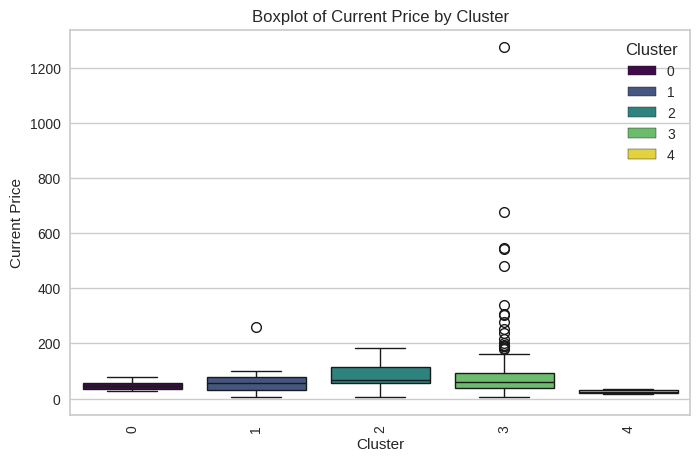

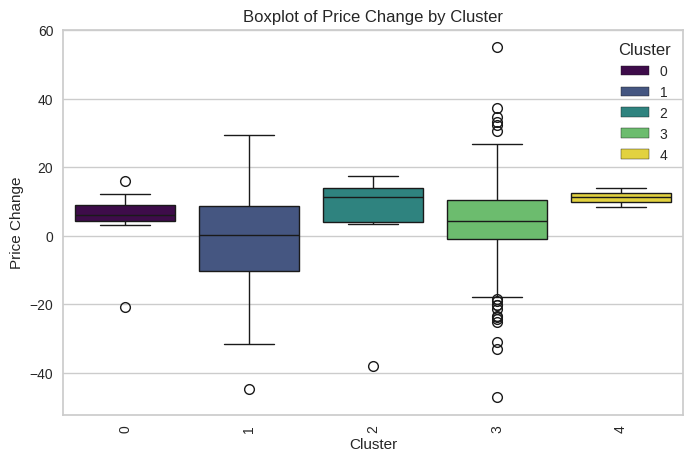

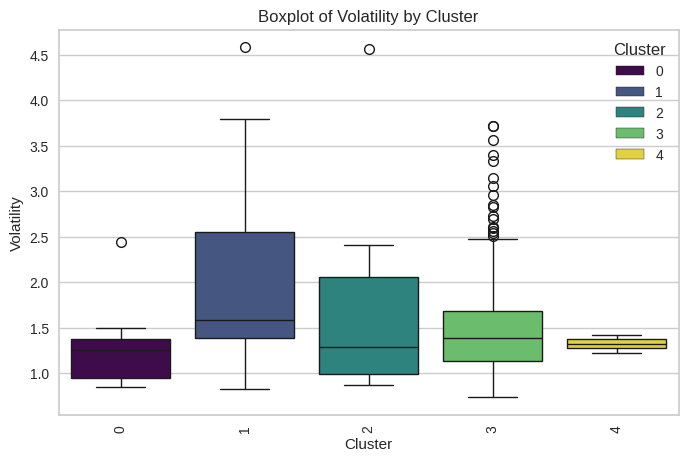

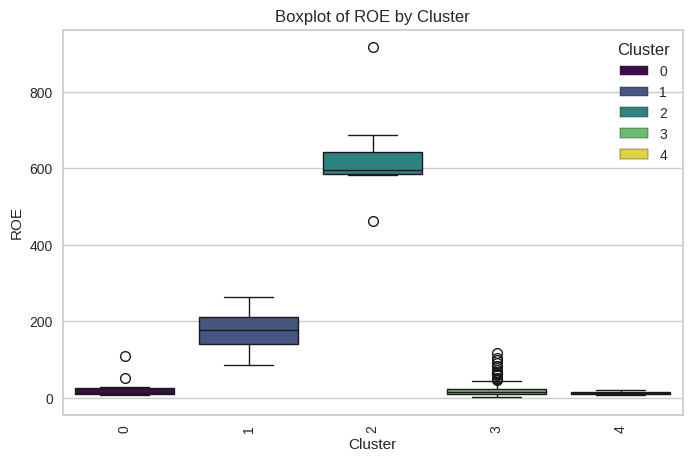

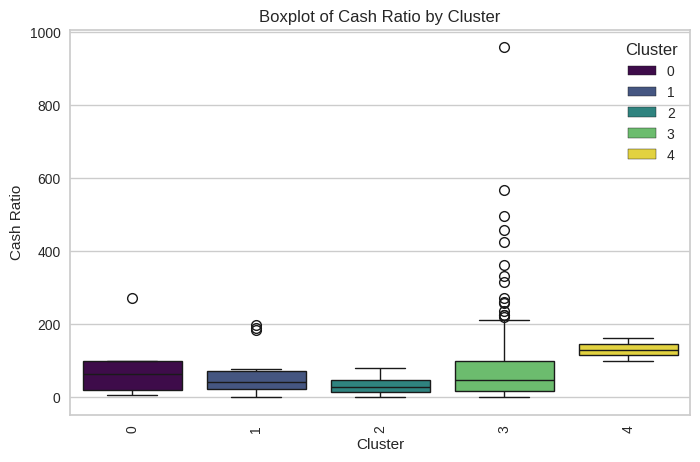

...

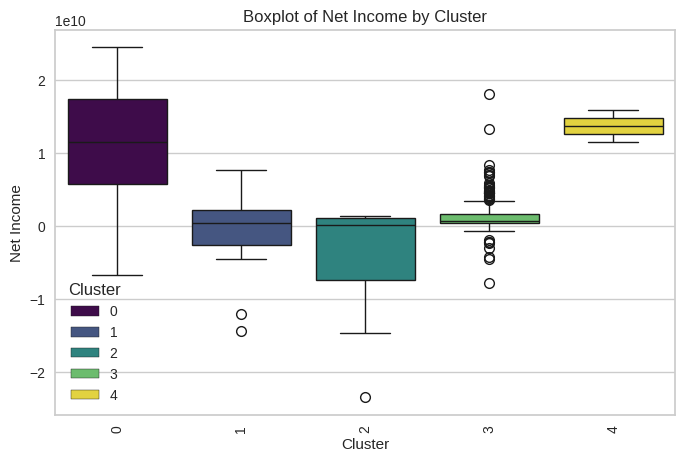

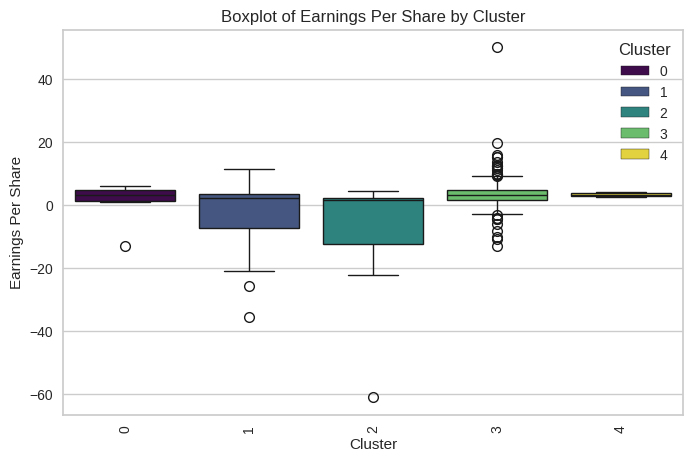

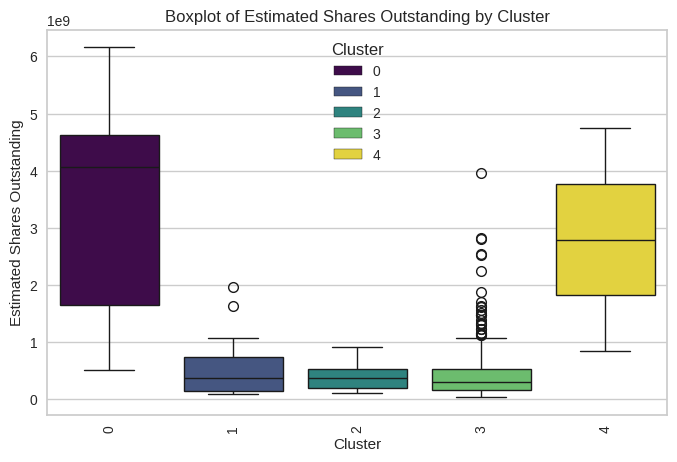

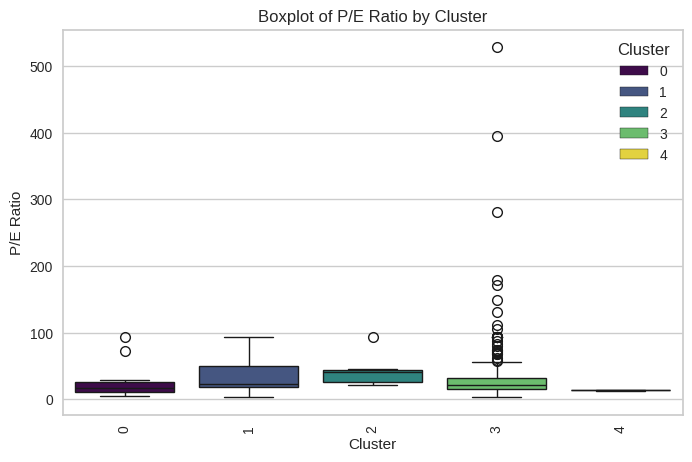

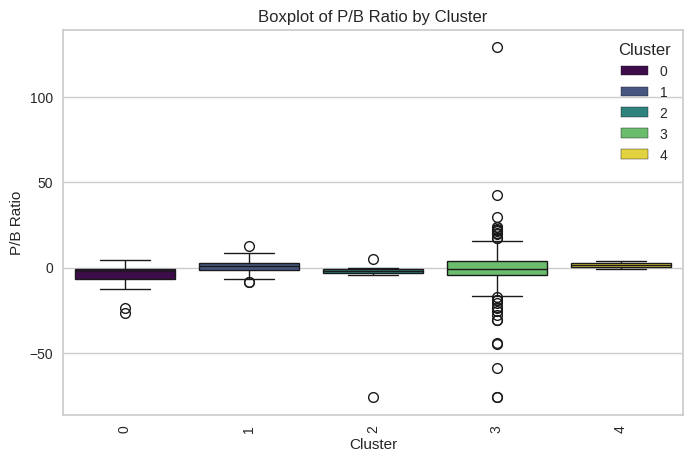

In [ ]:
# Show means for our original columns by Cluster
#df_model_k_means_grouped = df_model_k_means.groupby('Cluster').mean()

# Loop through the selected columns and plot boxplots
for col in list_numcol:
    if col in df_kmean.columns:  # Ensure the column exists in the DataFrame
        plt.figure(figsize=(8, 5))
        sns.boxplot(data=df_kmean, x='Cluster', y=col, hue='Cluster', palette='viridis', legend='full')
        plt.xticks(rotation=90)
        plt.title(f'Boxplot of {col} by Cluster')
        plt.show()


**OBSERVATION**

It appears that a k value of 5 or 6 would  work best for our dataset, as it has the highest silhouette score, and also emerged as a key value in the elbow exercise.

After using K-means to predict the clusters on our dataset, we can see the companies break out as follows into our five clusters:

**Cluster 0 (12 Companies)**

Anadarko Petroleum Corp, Bristol-Myers Squibb, Citigroup Inc., eBay Inc., General Motors, JPMorgan Chase & Co., Coca Cola Company, Pfizer Inc., AT&T Inc, Verizon Communications, Wells Fargo, Exxon Mobil Corp.

**Cluster 1 (16 Companies)**

American Airlines Group, AbbVie, Devon Energy Corp., Freeport-McMoran Cp & Gld, IDEXX Laboratories, Masco Corp., Moody's Corp, Altria Group Inc, Newfield Exploration Co, Pitney-Bowes, Sherwin-Williams, Southwestern Energy, United Parcel Service, Wynn Resorts Ltd, Cimarex Energy, Yum! Brands Inc

**Cluster 2 (7 Companies)**

Allegion, Apache Corporation, Chesapeake Energy, Charter Communications, Colgate-Palmolive, Kimberly-Clark, S&P Global, Inc.


**Cluster 4 (2 Companies)**

Bank of America Corp, Intel Corp.

**Cluster 3 (All remaining 303 Companies)**

Abbott Laboratories, Adobe Systems Inc, Analog Devices, Inc., Archer-Daniels-Midland Co, Alliance Data Systems, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Alexion Pharmaceuticals, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Amgen Inc, Ameriprise Financial, American Tower Corp A, Amazon.com Inc, AutoNation Inc, Anthem Inc., Aon plc, Amphenol Corp, Arconic Inc, Activision Blizzard, AvalonBay Communities, Inc., Broadcom, American Water Works Company Inc, American Express Co, Boeing Company, Baxter International Inc., BB&T Corporation, Bard (C.R.) Inc., Baker Hughes Inc, BIOGEN IDEC Inc., The Bank of New York Mellon Corp., Ball Corp, Boston Scientific, BorgWarner, Boston Properties, Caterpillar Inc., Chubb Limited, CBRE Group, Crown Castle International Corp., Carnival Corp., Celgene Corp., CF Industries Holdings Inc, Citizens Financial Group, Church & Dwight, C. H. Robinson Worldwide, CIGNA Corp., Cincinnati Financial, Comerica Inc., CME Group Inc., Chipotle Mexican Grill, Cummins Inc., CMS Energy, Centene Corporation, CenterPoint Energy, Capital One Financial, Cabot Oil & Gas, The Cooper Companies, CSX Corp., CenturyLink Inc, Cognizant Technology Solutions, Citrix Systems, CVS Health, Chevron Corp., Concho Resources, Dominion Resources, Delta Air Lines, Du Pont (E.I.), Deere & Co., Discover Financial Services, Quest Diagnostics, Danaher Corp., The Walt Disney Company, Discovery Communications-A, Discovery Communications-C, Delphi Automotive, Digital Realty Trust, Dun & Bradstreet, Dover Corp., Dr Pepper Snapple Group, Duke Energy, DaVita Inc., Ecolab Inc., Consolidated Edison, Equifax Inc., Edison Int'l, Eastman Chemical, EOG Resources, Equinix, Equity Residential, EQT Corporation, Eversource Energy, Essex Property Trust, Inc., E*Trade, Eaton Corporation, Entergy Corp., Edwards Lifesciences, Exelon Corp., Expeditors Int'l, Expedia Inc., Extra Space Storage, Ford Motor, Fastenal Co, Facebook, Fortune Brands Home & Security, FirstEnergy Corp, Fidelity National Information Services, Fiserv Inc, FLIR Systems, Fluor Corp., Flowserve Corporation, FMC Corporation, Federal Realty Investment Trust, First Solar Inc, Frontier Communications, General Dynamics, General Growth Properties Inc., Gilead Sciences, Corning Inc., Genuine Parts, Garmin Ltd., Goodyear Tire & Rubber, Grainger (W.W.) Inc., Halliburton Co., Hasbro Inc., Huntington Bancshares, HCA Holdings, Welltower Inc., HCP Inc., Hess Corporation, Hartford Financial Svc.Gp., Harley-Davidson, Honeywell Int'l Inc., Hewlett Packard Enterprise, HP Inc., Hormel Foods Corp., Henry Schein, Host Hotels & Resorts, The Hershey Company, Humana Inc., International Business Machines, Intl Flavors & Fragrances, International Paper, Interpublic Group, Iron Mountain Incorporated, Intuitive Surgical Inc., Illinois Tool Works, Invesco Ltd., J. B. Hunt Transport Services, Jacobs Engineering Group, Juniper Networks, Kimco Realty, Kinder Morgan, Kansas City Southern, Leggett & Platt, Lennar Corp., Laboratory Corp. of America Holding, LKQ Corporation, L-3 Communications Holdings, Lilly (Eli) & Co., Lockheed Martin Corp., Alliant Energy Corp, Leucadia National Corp., Southwest Airlines, Level 3 Communications, LyondellBasell, Mastercard Inc., Mid-America Apartments, Macerich, Marriott Int'l., Mattel Inc., McDonald's Corp., Mondelez International, MetLife Inc., Mohawk Industries, Mead Johnson, McCormick & Co., Martin Marietta Materials, Marsh & McLennan, 3M Company, Monster Beverage, The Mosaic Company, Marathon Petroleum, Merck & Co., Marathon Oil Corp., M&T Bank Corp., Mettler Toledo, Murphy Oil, Mylan N.V., Navient, Noble Energy Inc, NASDAQ OMX Group, NextEra Energy, Newmont Mining Corp. (Hldg. Co.), Netflix Inc., Nielsen Holdings, National Oilwell Varco Inc., Norfolk Southern Corp., Northern Trust Corp., Nucor Corp., Newell Brands, Realty Income Corporation, ONEOK, Omnicom Group, O'Reilly Automotive, Occidental Petroleum, People's United Financial, PACCAR Inc., PG&E Corp., Priceline.com Inc, Public Serv. Enterprise Inc., PepsiCo Inc., Principal Financial Group, Procter & Gamble, Progressive Corp., Pulte Homes Inc., Philip Morris International, PNC Financial Services, Pentair Ltd., Pinnacle West Capital, PPG Industries, PPL Corp., Prudential Financial, Phillips 66, Quanta Services Inc., Praxair Inc., PayPal, Ryder System, Royal Caribbean Cruises Ltd, Regeneron, Robert Half International, Roper Industries, Range Resources Corp., Republic Services Inc, SCANA Corp, Charles Schwab Corporation, Spectra Energy Corp., Sealed Air, SL Green Realty, Scripps Networks Interactive Inc., Southern Co., Simon Property Group Inc, Stericycle Inc, Sempra Energy, SunTrust Banks, State Street Corp., Skyworks Solutions, Synchrony Financial, Stryker Corp., Molson Coors Brewing Company, Teradata Corp., Tegna, Inc., Torchmark Corp., Thermo Fisher Scientific, TripAdvisor, The Travelers Companies Inc., Tractor Supply Company, Tyson Foods, Tesoro Petroleum Co., Total System Services, Texas Instruments, Under Armour, United Continental Holdings, UDR Inc, Universal Health Services, Inc., United Health Group Inc., Unum Group, Union Pacific, United Technologies, Varian Medical Systems, Valero Energy, Vulcan Materials, Vornado Realty Trust, Verisk Analytics, Verisign Inc., Vertex Pharmaceuticals Inc, Ventas Inc, Waters Corporation, Wec Energy Group Inc, Whirlpool Corp., Waste Management Inc., Williams Cos., Western Union Co, Weyerhaeuser Corp., Wyndham Worldwide, Xcel Energy Inc, XL Capital, Dentsply Sirona, Xerox Corp., Xylem Inc., Yahoo Inc., Zimmer Biomet Holdings, Zions Bancorp, Zoetis

#### Hierarchical Clustering

Next, we will try hierarchical clusterings.

The first thing we will do is figure out which distance metric and linkage type to use.

In [ ]:
df_hierarchical = df_model_scaled.copy()

In [ ]:
#Measure execution time
%%time

# Create list of distance metrics
distance_metrics = ['euclidean', 'chebyshev', 'mahalanobis', 'cityblock']

# Create list of linkage methods
linkage_methods = ['single', 'complete', 'average', 'centroid', 'ward', 'weighted']

high_cophenet_corr = 0
high_dm_lm = [0, 0]

# Calculate the cophentics for each combination of distance type and linkage method
for dm in distance_metrics:
    for lm in linkage_methods:
        try:
            # Try to compute linkage and cophenet correlation
            Z = linkage(df_hierarchical, metric=dm, method=lm)
            c, coph_dists = cophenet(Z, pdist(df_hierarchical))

            # Print cophenetic correlation result
            print(
                'Cophenetic correlation for {} distance and {} linkage is {}.'.format(
                    dm.capitalize(), lm, c
                )
            )

            # Update the highest cophenetic correlation
            if high_cophenet_corr < c:
                high_cophenet_corr = c
                high_dm_lm[0] = dm
                high_dm_lm[1] = lm

        except Exception as e:
            # Not all distance types can be used with all linkage types, so we need to gracefully handle errors
            print(f'Error for {dm.capitalize()} distance and {lm} linkage: {e}')


Cophenetic correlation for Euclidean distance and single linkage is 0.9515911691498813.
Cophenetic correlation for Euclidean distance and complete linkage is 0.8973300286572553.
Cophenetic correlation for Euclidean distance and average linkage is 0.9456134806319734.
Cophenetic correlation for Euclidean distance and centroid linkage is 0.9468040178955592.
Cophenetic correlation for Euclidean distance and ward linkage is 0.8184834889632843.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8824190968054058.
Cophenetic correlation for Chebyshev distance and single linkage is 0.944359706184292.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.8863927240886589.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9381981458216698.
Error for Chebyshev distance and centroid linkage: `method=centroid` requires the distance metric to be Euclidean
Error for Chebyshev distance and ward linkage: `method=ward` requires the distance metr

In [ ]:
# Print the ideal combination
print(
    'Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.'.format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9515911691498813, which is obtained with Euclidean distance and single linkage.


The above code tells us that the best combination is Euclidean distance with single linkage. However, we need to visual the dendograms to see if this recommendation is suitable or not.

Let's re-run linkages, but using only Euclidian distances this time.

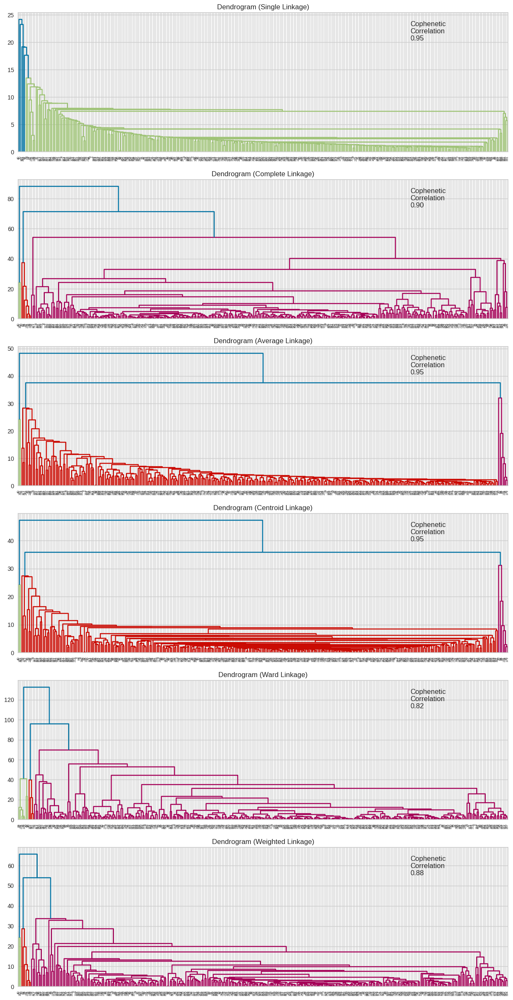

In [ ]:
# View dendograms

# Create list of linkage methods
linkage_methods = ['single', 'complete', 'average', 'centroid', 'ward', 'weighted'] ## Complete the code to add linkages

# Create lists to save results
compare_cols = ['Linkage', 'Cophenetic Coefficient']

# Create subplot
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# Loop through thelinkage methods and plot dendrogram and calculate cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(df_hierarchical, metric='euclidean', method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f'Dendrogram ({method.capitalize()} Linkage)')

    coph_corr, coph_dist = cophenet(Z, pdist(df_hierarchical))
    axs[i].annotate(
        f'Cophenetic\nCorrelation\n{coph_corr:0.2f}',
        (0.80, 0.80),
        xycoords='axes fraction',
    )

Next, we need to fit a new model using our chosen distance and linkage approach.

* Single, centroid and average have the highest cophenetic correlation values, but also exhibit overlaps:

* Single (Cophenetic Correlation = .95)
* Average (Cophenetic Correlation = .95)
* Centroid (Cophenetic Correlation = .95)

Several of the dendograms have lower scores but appear well organized.

* Complete (Cophenetic Correlation = .90)
* Ward (Cophenetic Correlation = .82)
* Weighted (Cophenetic Correlation = .88)

* We will choose complete, as the dendogram is very clean, and the value is not much lower than the single linkage (.95). In addition, we'll choose a cluster count of 5 again.

In [ ]:
# Fit the model with the desired number of clusters and selected distance and linkage type
# Note that affinity is now called metric in the function below
df_model_hc_5 = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='complete')
df_model_hc_5.fit(df_hierarchical)

AgglomerativeClustering(linkage='complete', n_clusters=5)

In [ ]:
# Apply the hierarchical clustering to a final model
df_hc = df_model.copy()

# Add labels
df_hierarchical['Cluster'] = df_model_hc_5.labels_
df_hc['Cluster'] = df_model_hc_5.labels_

##### Cluster Profile

In [ ]:
# Group and count the results
display(df_hc['Cluster'].value_counts())

,count
Cluster,
1,318
0,10
2,7
3,3
4,2


In [ ]:
# Show the securities in each cluster
for cluster in df_hc['Cluster'].unique():
    cluster_securities = df_hc[df_hc['Cluster'] == cluster]['Security']
    print(f'Cluster {cluster}: {", ".join(cluster_securities)}')

Cluster 1: American Airlines Group, AbbVie, Abbott Laboratories, Adobe Systems Inc, Analog Devices, Inc., Archer-Daniels-Midland Co, Alliance Data Systems, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Amgen Inc, Ameriprise Financial, American Tower Corp A, AutoNation Inc, Anthem Inc., Aon plc, Anadarko Petroleum Corp, Amphenol Corp, Arconic Inc, Activision Blizzard, AvalonBay Communities, Inc., Broadcom, American Water Works Company Inc, American Express Co, Boeing Company, Baxter International Inc., BB&T Corporation, Bard (C.R.) Inc., Baker Hughes Inc, BIOGEN IDEC Inc., The Bank of New York Mellon Corp., Ball Corp, Bristol-Myers Squibb, Boston Scientific, BorgWarner, Boston Properties, Caterpillar Inc., Chubb Limited, CBRE Group, Crown

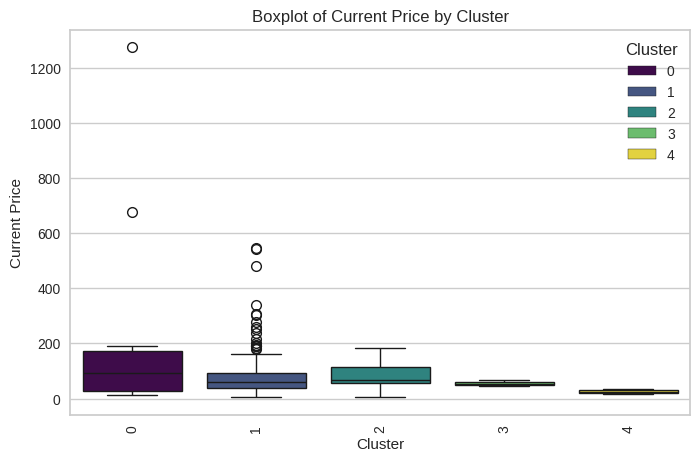

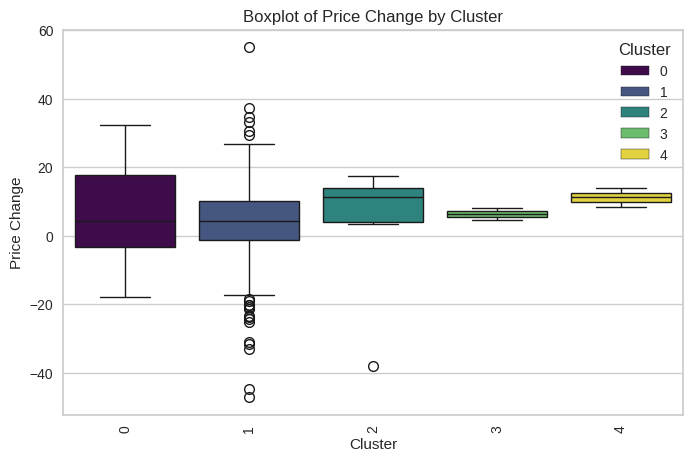

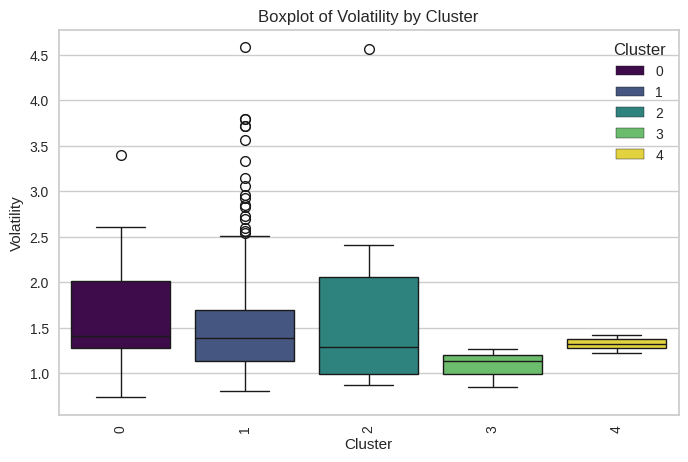

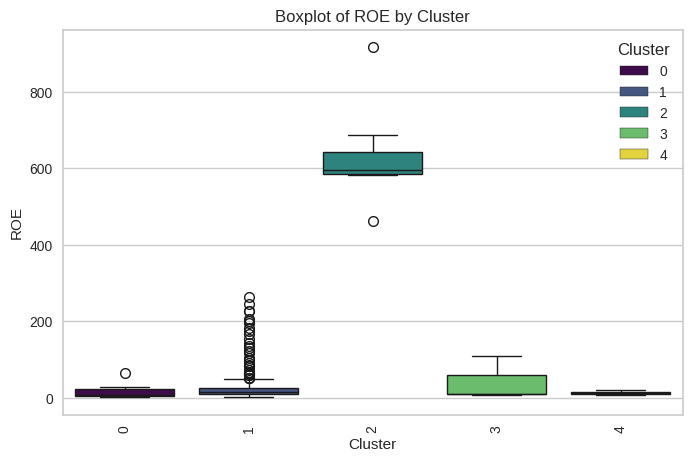

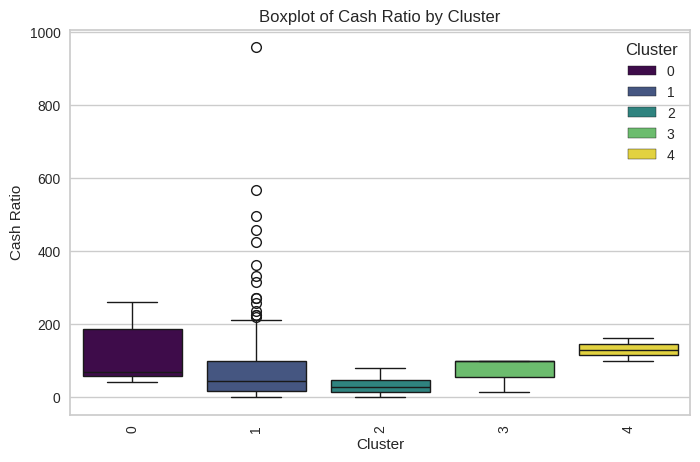

...

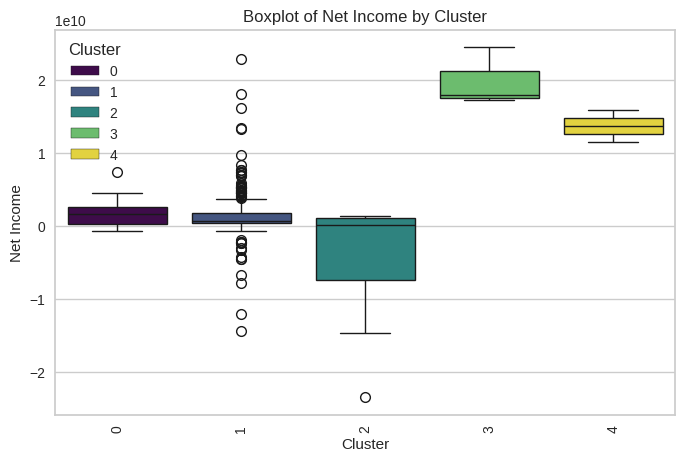

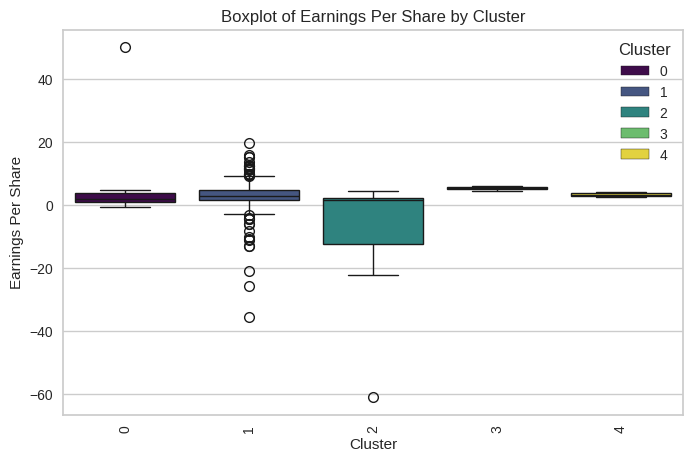

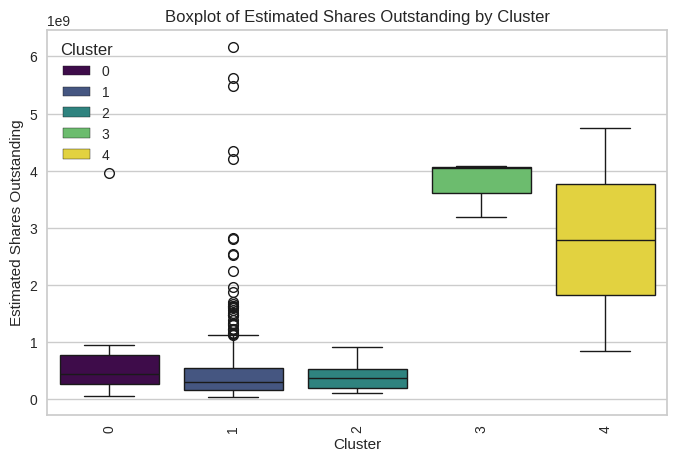

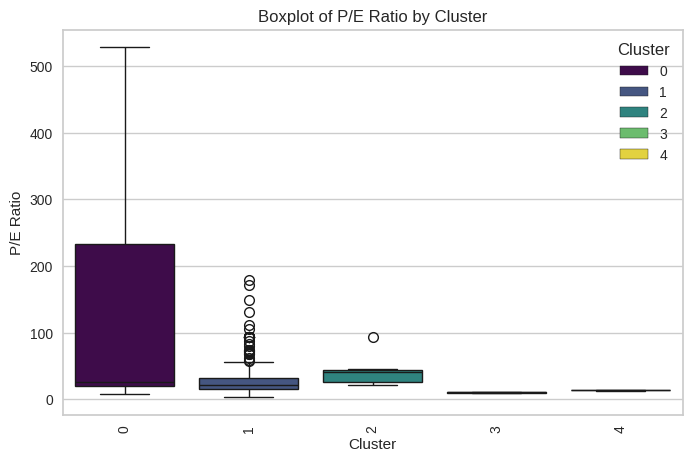

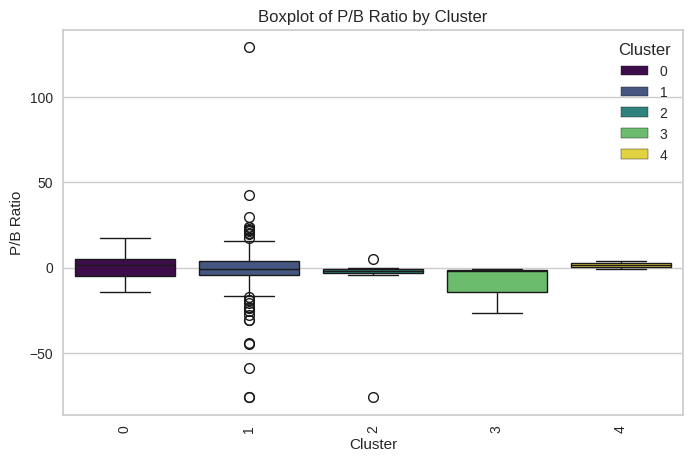

In [ ]:
# Loop through the selected columns and plot boxplots
for col in list_numcol:
    if col in df_hc.columns:  # Ensure the column exists in the DataFrame
        plt.figure(figsize=(8, 5))
        sns.boxplot(data=df_hc, x='Cluster', y=col, hue='Cluster', palette='viridis', legend='full')
        plt.xticks(rotation=90)
        plt.title(f"Boxplot of {col} by Cluster")
        plt.show()


**OBSERVATIONS**

Using five clusters in hierarchical clustering assigned companies as follows:


**Cluster 0	(10 companies)**

 Alexion Pharmaceuticals, Amazon.com Inc, Exelon Corp., Ford Motor, Halliburton Co., Hewlett Packard Enterprise, McDonald's Corp., Netflix Inc., Northern Trust Corp., Priceline.com Inc

**Cluster 2	(7 companies)**

Allegion, Apache Corporation, Chesapeake Energy, Charter Communications, Colgate-Palmolive, Kimberly-Clark, S&P Global, Inc.

**Cluster 3	(3 companies)**

Citigroup Inc., JPMorgan Chase & Co., Verizon Communications

**Cluster 4	(2 companies)**

Bank of America Corp, Intel Corp.

**Cluster 1	(All other 318 companies)**

American Airlines Group, AbbVie, Abbott Laboratories, Adobe Systems Inc, Analog Devices, Inc., Archer-Daniels-Midland Co, Alliance Data Systems, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Amgen Inc, Ameriprise Financial, American Tower Corp A, AutoNation Inc, Anthem Inc., Aon plc, Anadarko Petroleum Corp, Amphenol Corp, Arconic Inc, Activision Blizzard, AvalonBay Communities, Inc., Broadcom, American Water Works Company Inc, American Express Co, Boeing Company, Baxter International Inc., BB&T Corporation, Bard (C.R.) Inc., Baker Hughes Inc, BIOGEN IDEC Inc., The Bank of New York Mellon Corp., Ball Corp, Bristol-Myers Squibb, Boston Scientific, BorgWarner, Boston Properties, Caterpillar Inc., Chubb Limited, CBRE Group, Crown Castle International Corp., Carnival Corp., Celgene Corp., CF Industries Holdings Inc, Citizens Financial Group, Church & Dwight, C. H. Robinson Worldwide, CIGNA Corp., Cincinnati Financial, Comerica Inc., CME Group Inc., Chipotle Mexican Grill, Cummins Inc., CMS Energy, Centene Corporation, CenterPoint Energy, Capital One Financial, Cabot Oil & Gas, The Cooper Companies, CSX Corp., CenturyLink Inc, Cognizant Technology Solutions, Citrix Systems, CVS Health, Chevron Corp., Concho Resources, Dominion Resources, Delta Air Lines, Du Pont (E.I.), Deere & Co., Discover Financial Services, Quest Diagnostics, Danaher Corp., The Walt Disney Company, Discovery Communications-A, Discovery Communications-C, Delphi Automotive, Digital Realty Trust, Dun & Bradstreet, Dover Corp., Dr Pepper Snapple Group, Duke Energy, DaVita Inc., Devon Energy Corp., eBay Inc., Ecolab Inc., Consolidated Edison, Equifax Inc., Edison Int'l, Eastman Chemical, EOG Resources, Equinix, Equity Residential, EQT Corporation, Eversource Energy, Essex Property Trust, Inc., E*Trade, Eaton Corporation, Entergy Corp., Edwards Lifesciences, Expeditors Int'l, Expedia Inc., Extra Space Storage, Fastenal Co, Facebook, Fortune Brands Home & Security, Freeport-McMoran Cp & Gld, FirstEnergy Corp, Fidelity National Information Services, Fiserv Inc, FLIR Systems, Fluor Corp., Flowserve Corporation, FMC Corporation, Federal Realty Investment Trust, First Solar Inc, Frontier Communications, General Dynamics, General Growth Properties Inc., Gilead Sciences, Corning Inc., General Motors, Genuine Parts, Garmin Ltd., Goodyear Tire & Rubber, Grainger (W.W.) Inc., Hasbro Inc., Huntington Bancshares, HCA Holdings, Welltower Inc., HCP Inc., Hess Corporation, Hartford Financial Svc.Gp., Harley-Davidson, Honeywell Int'l Inc., HP Inc., Hormel Foods Corp., Henry Schein, Host Hotels & Resorts, The Hershey Company, Humana Inc., International Business Machines, IDEXX Laboratories, Intl Flavors & Fragrances, International Paper, Interpublic Group, Iron Mountain Incorporated, Intuitive Surgical Inc., Illinois Tool Works, Invesco Ltd., J. B. Hunt Transport Services, Jacobs Engineering Group, Juniper Networks, Kimco Realty, Kinder Morgan, Coca Cola Company, Kansas City Southern, Leggett & Platt, Lennar Corp., Laboratory Corp. of America Holding, LKQ Corporation, L-3 Communications Holdings, Lilly (Eli) & Co., Lockheed Martin Corp., Alliant Energy Corp, Leucadia National Corp., Southwest Airlines, Level 3 Communications, LyondellBasell, Mastercard Inc., Mid-America Apartments, Macerich, Marriott Int'l., Masco Corp., Mattel Inc., Moody's Corp, Mondelez International, MetLife Inc., Mohawk Industries, Mead Johnson, McCormick & Co., Martin Marietta Materials, Marsh & McLennan, 3M Company, Monster Beverage, Altria Group Inc, The Mosaic Company, Marathon Petroleum, Merck & Co., Marathon Oil Corp., M&T Bank Corp., Mettler Toledo, Murphy Oil, Mylan N.V., Navient, Noble Energy Inc, NASDAQ OMX Group, NextEra Energy, Newmont Mining Corp. (Hldg. Co.), Newfield Exploration Co, Nielsen Holdings, National Oilwell Varco Inc., Norfolk Southern Corp., Nucor Corp., Newell Brands, Realty Income Corporation, ONEOK, Omnicom Group, O'Reilly Automotive, Occidental Petroleum, People's United Financial, Pitney-Bowes, PACCAR Inc., PG&E Corp., Public Serv. Enterprise Inc., PepsiCo Inc., Pfizer Inc., Principal Financial Group, Procter & Gamble, Progressive Corp., Pulte Homes Inc., Philip Morris International, PNC Financial Services, Pentair Ltd., Pinnacle West Capital, PPG Industries, PPL Corp., Prudential Financial, Phillips 66, Quanta Services Inc., Praxair Inc., PayPal, Ryder System, Royal Caribbean Cruises Ltd, Regeneron, Robert Half International, Roper Industries, Range Resources Corp., Republic Services Inc, SCANA Corp, Charles Schwab Corporation, Spectra Energy Corp., Sealed Air, Sherwin-Williams, SL Green Realty, Scripps Networks Interactive Inc., Southern Co., Simon Property Group Inc, Stericycle Inc, Sempra Energy, SunTrust Banks, State Street Corp., Skyworks Solutions, Southwestern Energy, Synchrony Financial, Stryker Corp., AT&T Inc, Molson Coors Brewing Company, Teradata Corp., Tegna, Inc., Torchmark Corp., Thermo Fisher Scientific, TripAdvisor, The Travelers Companies Inc., Tractor Supply Company, Tyson Foods, Tesoro Petroleum Co., Total System Services, Texas Instruments, Under Armour, United Continental Holdings, UDR Inc, Universal Health Services, Inc., United Health Group Inc., Unum Group, Union Pacific, United Parcel Service, United Technologies, Varian Medical Systems, Valero Energy, Vulcan Materials, Vornado Realty Trust, Verisk Analytics, Verisign Inc., Vertex Pharmaceuticals Inc, Ventas Inc, Waters Corporation, Wec Energy Group Inc, Wells Fargo, Whirlpool Corp., Waste Management Inc., Williams Cos., Western Union Co, Weyerhaeuser Corp., Wyndham Worldwide, Wynn Resorts Ltd, Cimarex Energy, Xcel Energy Inc, XL Capital, Exxon Mobil Corp., Dentsply Sirona, Xerox Corp., Xylem Inc., Yahoo Inc., Yum! Brands Inc, Zimmer Biomet Holdings, Zions Bancorp, Zoetis

####Principal Component Analysis and t-SNE

Let's see if we can use PCA and t-SNE to visualize our clusters, now that we have our cluster count. We will use both the K-means and Hierarchical methods and compare.


In [ ]:
# Copy datafrase
df_pca = df_model_scaled.copy()

##### Visualization: PCA with K-Means

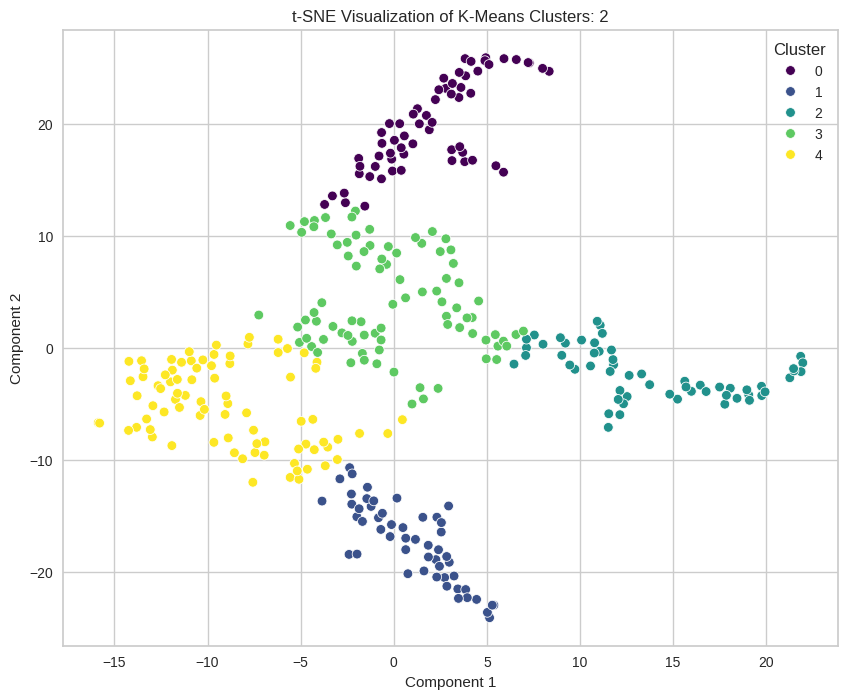

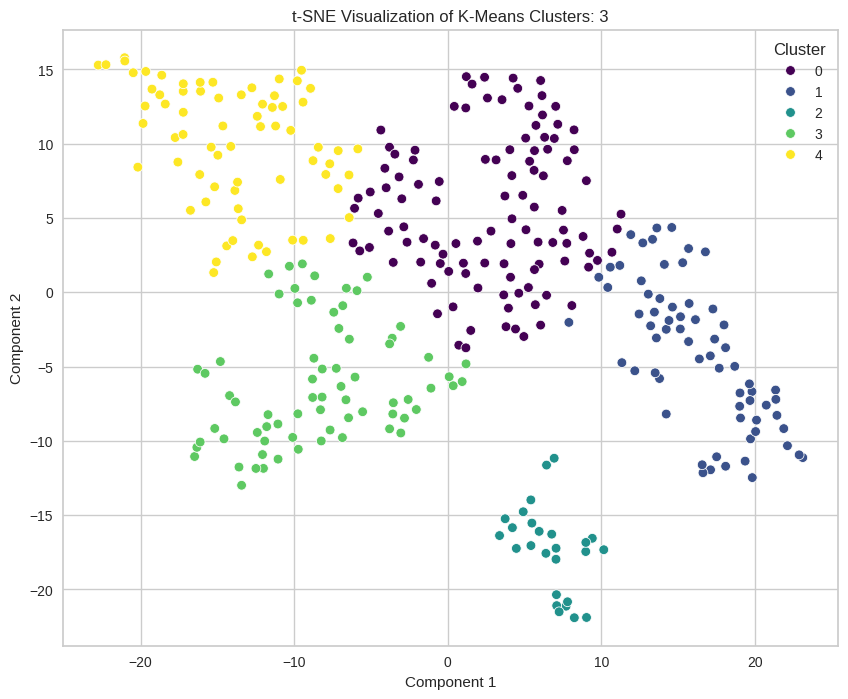

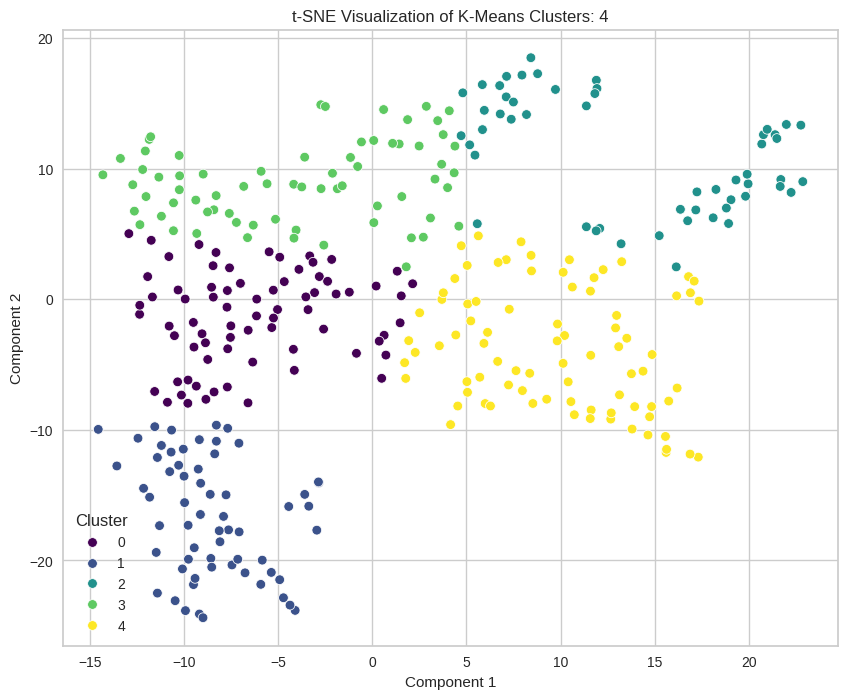

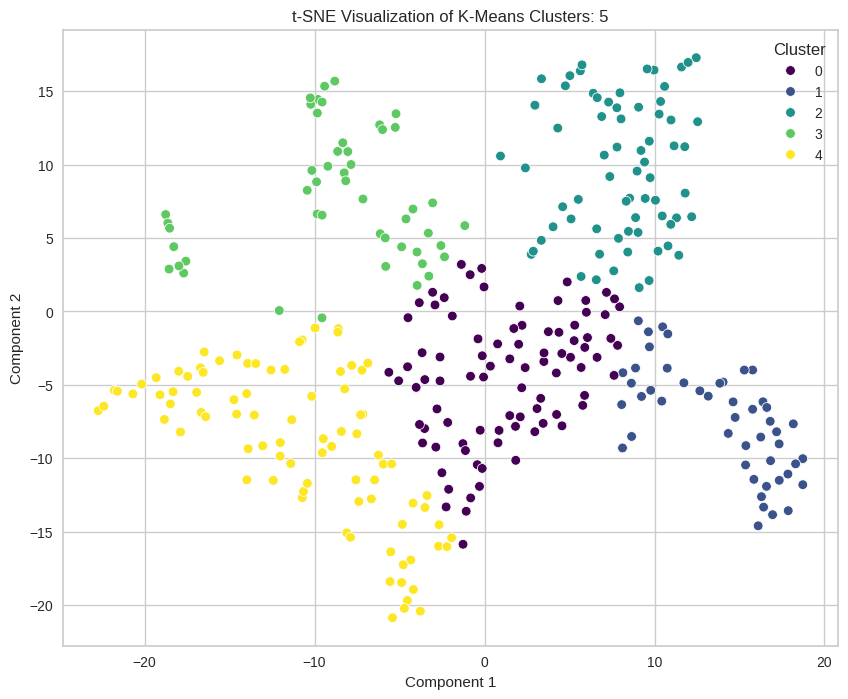

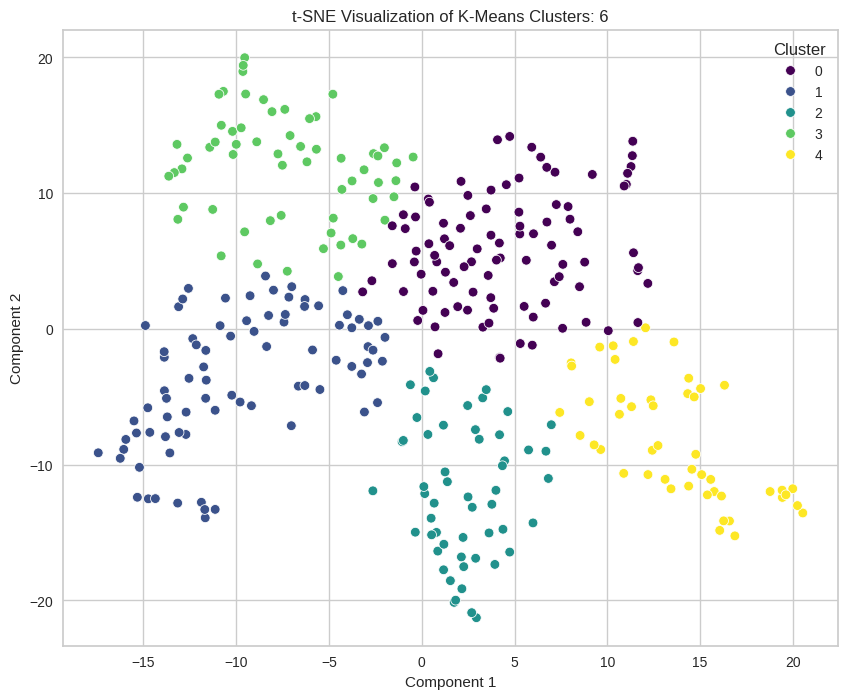

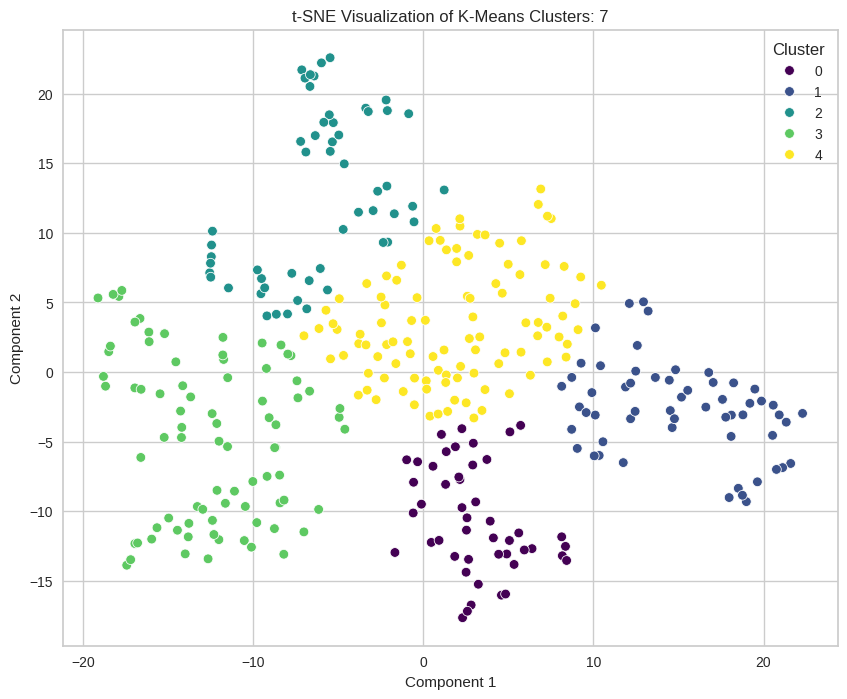

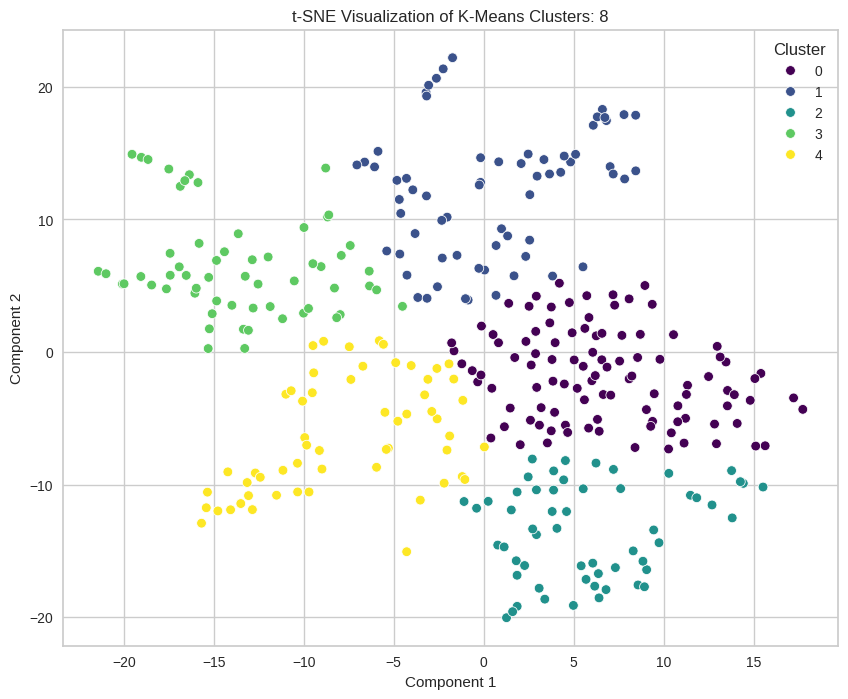

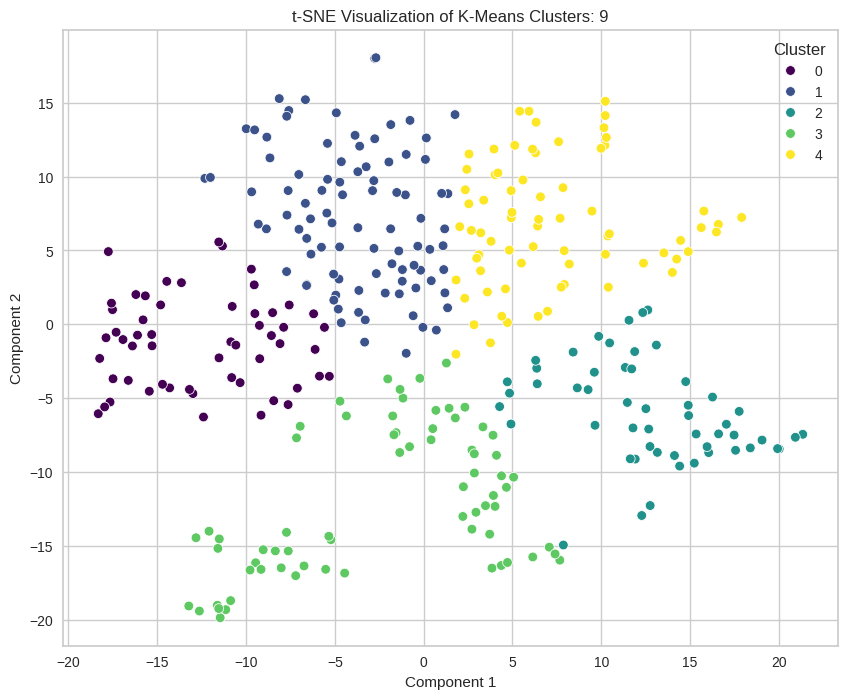

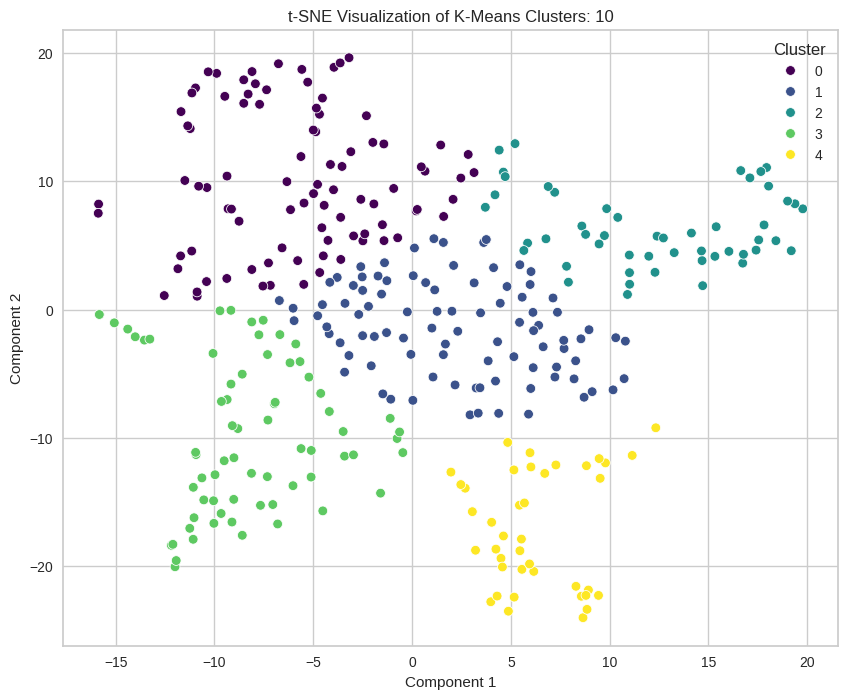

In [ ]:
# Reduce to higher dimensions first with PCA, using n_components from 2 to 10, and kmeans results *cluster=5)
for i in np.arange(2, 11):

  # Initialize PCA model
  pca = PCA(n_components=i)  # or any number you want
  X_pca = pca.fit_transform(df_pca)

  # Then apply t-SNE
  tsne = TSNE(n_components=2, random_state=8)
  X_reduced = tsne.fit_transform(X_pca)

  # Perform clustering on the reduced data (using KMeans cluster count here)
  kmeans = KMeans(n_clusters=5, random_state=8)
  clusters = kmeans.fit_predict(X_reduced)

  # Put t-SNE results in a dataframe
  df_tsne = pd.DataFrame(data=X_reduced, columns=['Component 1', 'Component 2'])

  # Add the cluster labels to the dataframe
  df_tsne['Cluster'] = clusters

  # Show it in a scatterplot
  plt.figure(figsize=(10, 8))
  sns.scatterplot(data=df_tsne, x='Component 1', y='Component 2',  hue='Cluster', palette='viridis', legend='full')

  # Customize the plot
  plt.title(f't-SNE Visualization of K-Means Clusters: {i}')
  plt.xlabel('Component 1')
  plt.ylabel('Component 2')
  plt.legend(title='Cluster')
  plt.show()


##### Visualization: PCA with Hierarchical

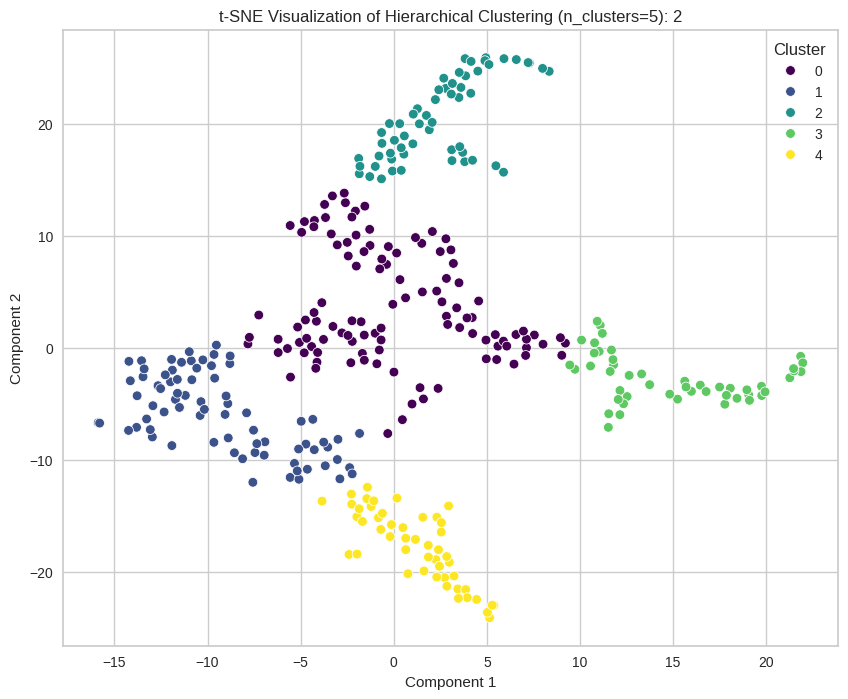

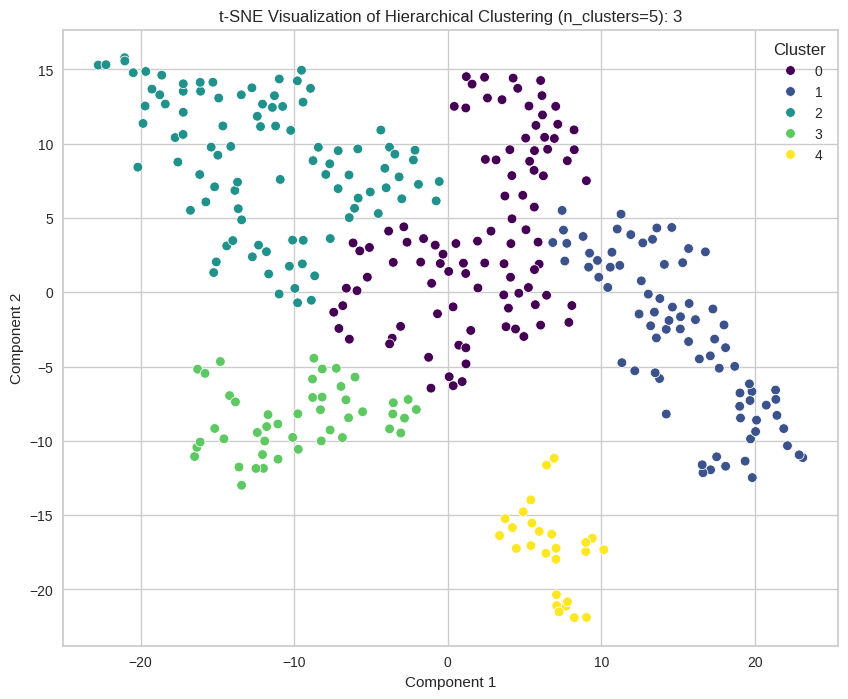

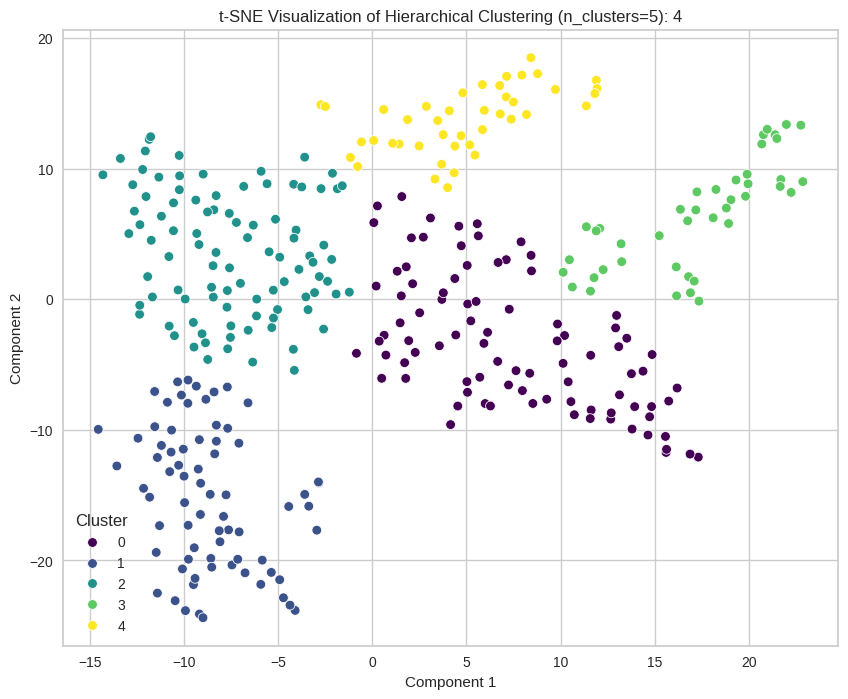

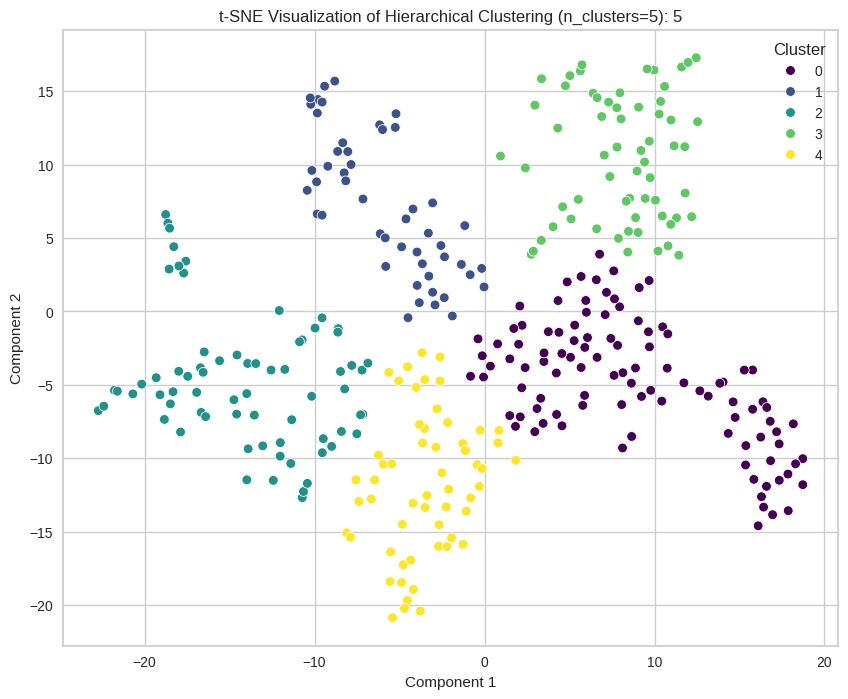

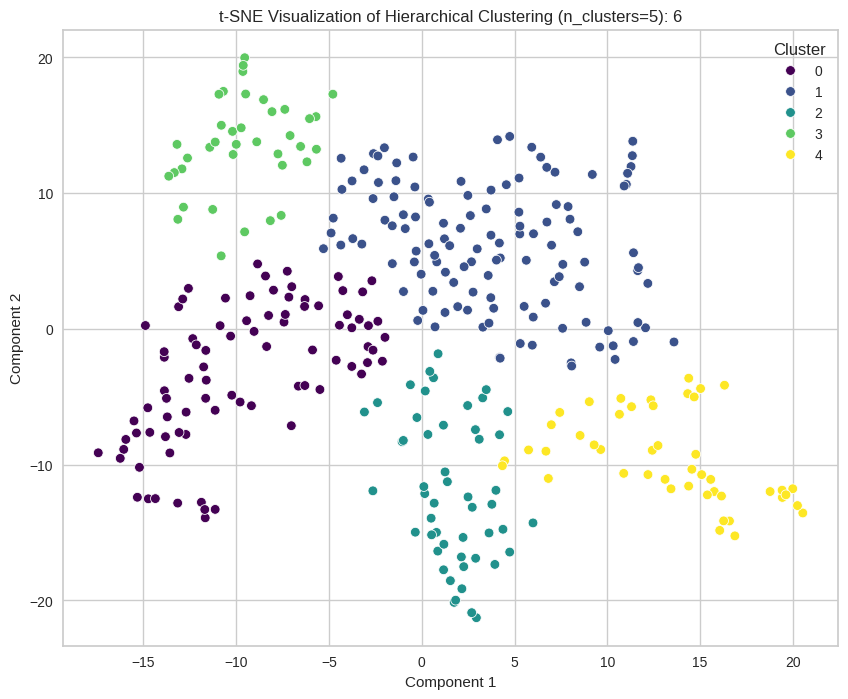

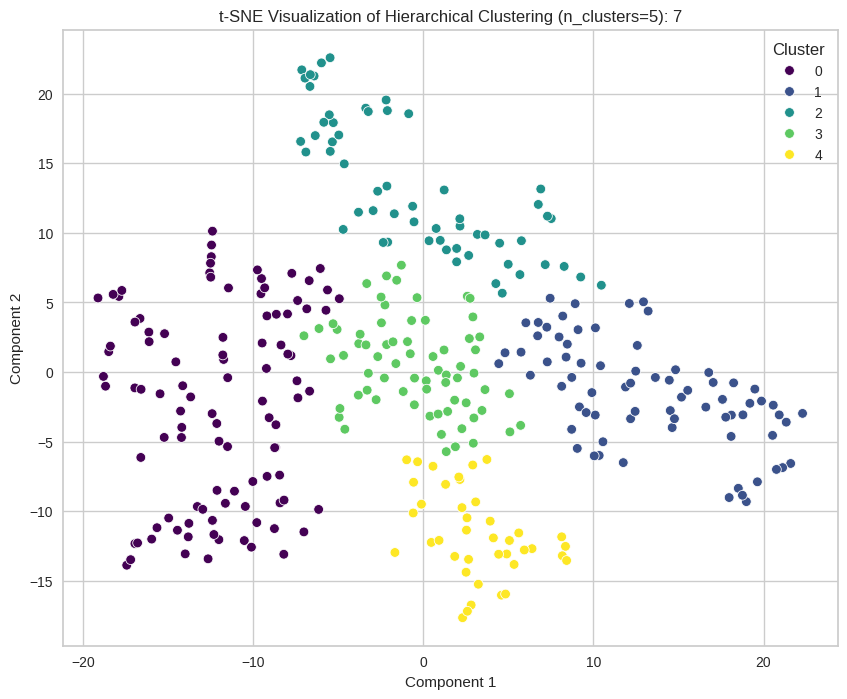

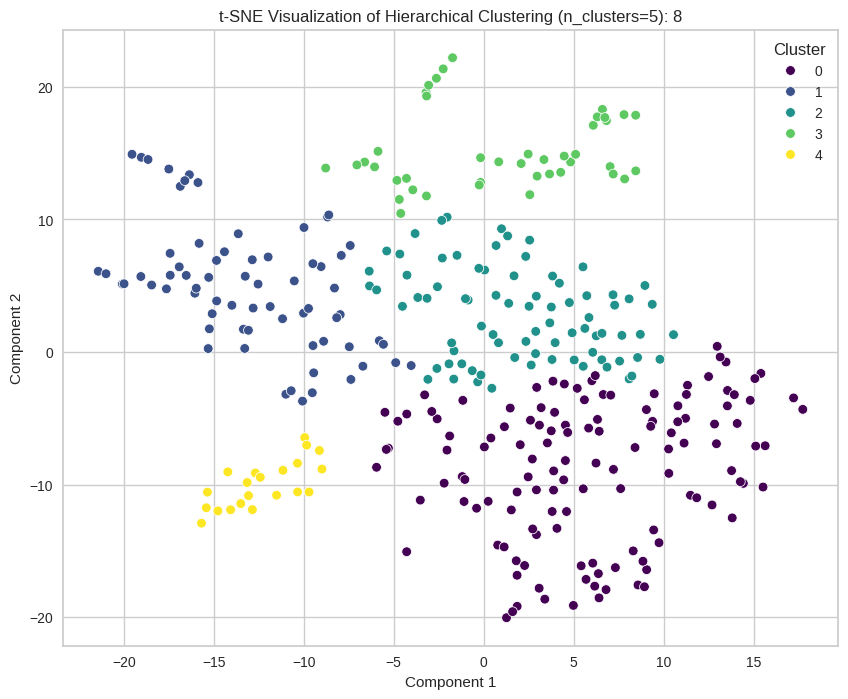

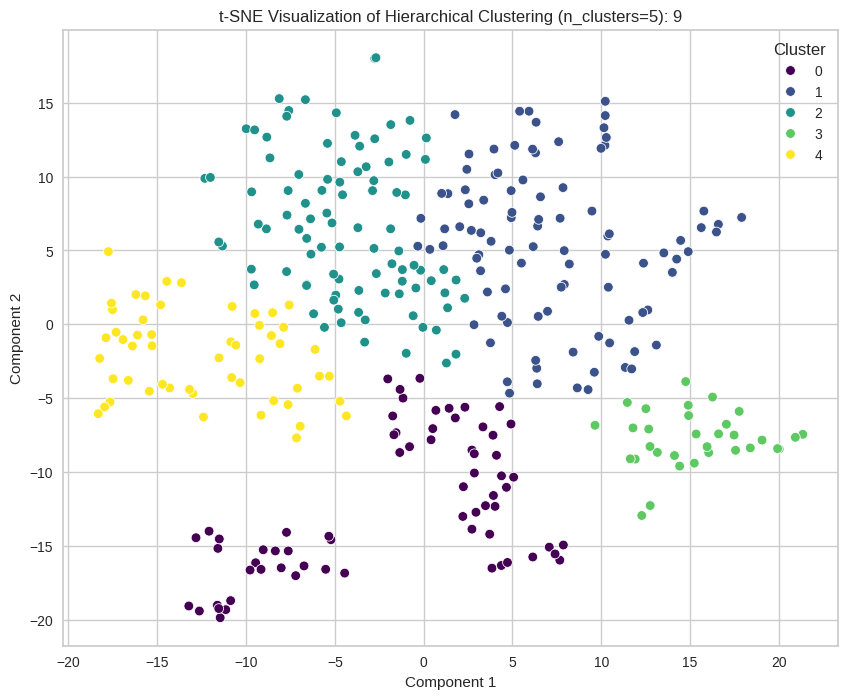

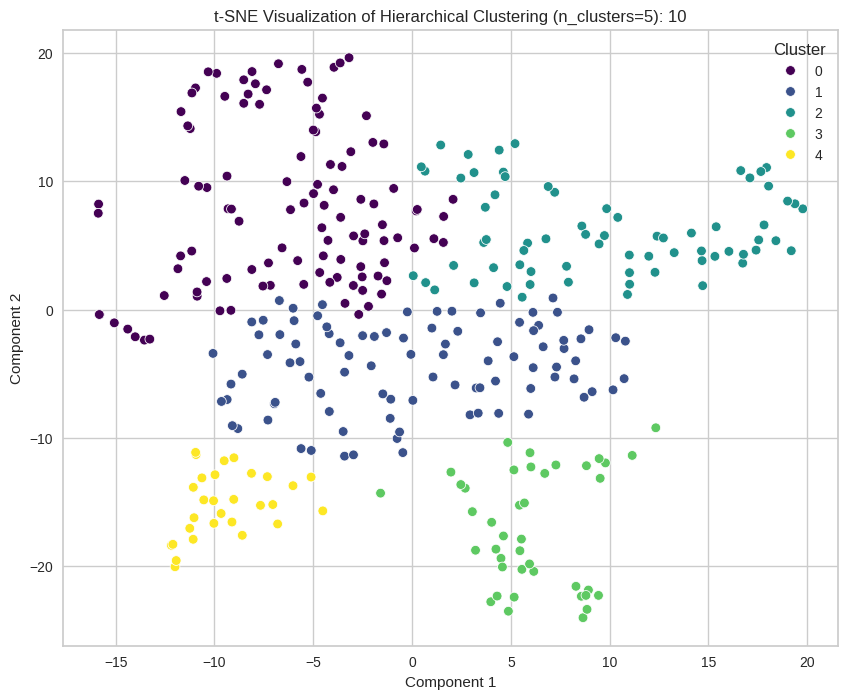

In [ ]:
# Reduce to higher dimensions first with PCA, using n_components from 2 to 10
for i in np.arange(2, 11):

  # Initialize PCA model
  pca = PCA(n_components=i)
  X_pca = pca.fit_transform(df_pca)

  # Then apply t-SNE
  tsne = TSNE(n_components=2, random_state=8)
  X_reduced = tsne.fit_transform(X_pca)

  # Perform hierarchical clustering (AgglomerativeClustering) on the reduced data
  hierarchical = AgglomerativeClustering(n_clusters=5)  # Set number of clusters to 5
  clusters = hierarchical.fit_predict(X_reduced)

  # Put t-SNE results in a dataframe
  df_tsne = pd.DataFrame(data=X_reduced, columns=['Component 1', 'Component 2'])

  # Add the cluster labels to the dataframe
  df_tsne['Cluster'] = clusters

  # Show it in a scatterplot
  plt.figure(figsize=(10, 8))
  sns.scatterplot(data=df_tsne, x='Component 1', y='Component 2',  hue='Cluster', palette='viridis', legend='full')

  # Customize the plot
  plt.title(f't-SNE Visualization of Hierarchical Clustering (n_clusters=5): {i}')
  plt.xlabel('Component 1')
  plt.ylabel('Component 2')
  plt.legend(title='Cluster')
  plt.show()



#### K-means vs Hierarchical Clustering

Next, let's determine which approach to take: K-means or Hierarchical.

* Execution time
* Cluster Distinction
* Ideal number of clusters
* Comparision of cluster profile results


**Execution Time**

Hierarchical runs more than twice as fast as K-means:

* K-means CPU times
  * user 663 ms
  * sys: 54.8 ms
  * total: 718 ms
  * wall time: 827 ms

* Hierarchical CPU times
  * user: 267 ms
  * sys: 73.4 ms
  * total: 341 ms
  * wall time: 295 ms

**Ideal Number of Clusters**

* In both cases, 5 is the ideal cluster count.

**Cluster Distinction**

* Visualizing the clusters in each method for K-means, the elbow method reveals a very distinct elbow between a count of 5 and 6. For clusters 6 and higher, the gained distortion reduction tapers off.

* For Hierarchical, our Dendogram for complete linkage is well-organized for either 5 or 6 clusters.

* Given both inputs, we will choose 5 clusters, resulting in the following data point assignents.
  * The overall cluster shapes are very similar in shape but nearly touching one another..
  * With K-means, we have a more distinguished middle centroid. In  Hierarchical clustering, these same points are allocated to neighboring clusters.
  * The outliers in the middle left section were assigned to different clusters.


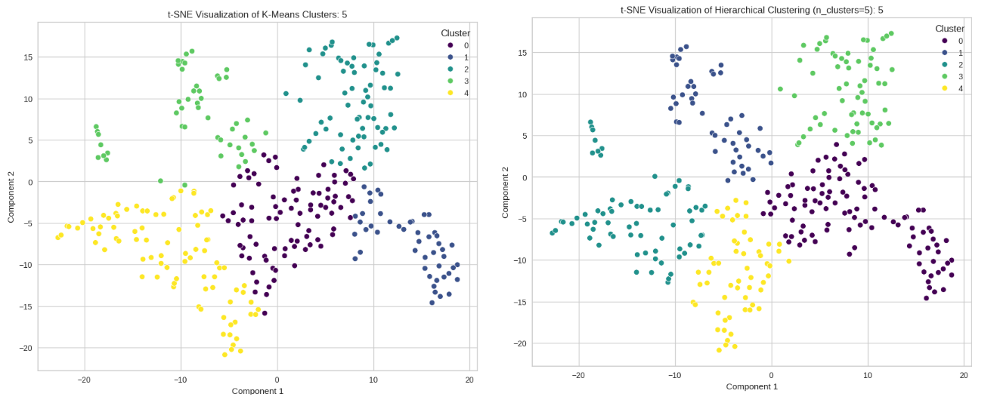

**Cluster Profile Result Comparision**

K-means performed best with five clusters, allocated as follows:
* Cluster 3:	303
* Cluster 1:	16
* Cluster 0:	12
* Cluster 2:	7
* Cluster 4:	2

Hierarchical also has five clusters, with a similar allocation. In this algorithm, more data points were assigned to Cluster 1, while other clusters saw reduced counts.
* Cluster 1: 318
* Cluster 0:	10
* Cluster 2:	7
* Cluster 3:	3
* Cluster 4:	2

Next, let's aggregate the data by cluster so that we can compare various features per cluster.

In [ ]:
# Create cluster-specific dataframes
df_kmean_cluster_0 = df_kmean[df_kmean['Cluster'] == 0]
df_kmean_cluster_1 = df_kmean[df_kmean['Cluster'] == 1]
df_kmean_cluster_2 = df_kmean[df_kmean['Cluster'] == 2]
df_kmean_cluster_3 = df_kmean[df_kmean['Cluster'] == 3]
df_kmean_cluster_4 = df_kmean[df_kmean['Cluster'] == 4]

list_clusters = [0,1,2,3,4]


In [ ]:
# View details for Cluster means
for col in num_cols:
  print(f'\n****** Feature {col} ******')
  for cluster in list_clusters:
    cluster_data = df_kmean[df_kmean['Cluster'] == cluster]
    print(f'Cluster {cluster} mean for {col}: {cluster_data[col].mean()}')


****** Feature Current Price ******
Cluster 0 mean for Current Price: 48.73499975000001
Cluster 1 mean for Current Price: 64.210386025625
Cluster 2 mean for Current Price: 84.35571614285713
Cluster 3 mean for Current Price: 83.29782519843894
Cluster 4 mean for Current Price: 25.6400005

****** Feature Price Change ******
Cluster 0 mean for Price Change: 5.318747360916667
Cluster 1 mean for Price Change: -2.1037755721874998
Cluster 2 mean for Price Change: 3.854980541142857
Cluster 3 mean for Price Change: 4.313401507676567
Cluster 4 mean for Price Change: 11.2379082245

****** Feature Volatility ******
Cluster 0 mean for Volatility: 1.2708920399166668
Cluster 1 mean for Volatility: 2.11978607225
Cluster 2 mean for Volatility: 1.827670343428571
Cluster 3 mean for Volatility: 1.499096510122112
Cluster 4 mean for Volatility: 1.32235485

****** Feature ROE ******
Cluster 0 mean for ROE: 26.0
Cluster 1 mean for ROE: 178.5
Cluster 2 mean for ROE: 633.5714285714286
Cluster 3 mean for ROE: 19

In [ ]:
# Merge individual dataframes and write comparisions to new table

df_all_clusters = [df_kmean_cluster_0, df_kmean_cluster_1, df_kmean_cluster_2, df_kmean_cluster_3, df_kmean_cluster_4]

mean_table = pd.DataFrame()

for idx, df in enumerate(df_all_clusters):
    temp_mean_dict = {}

    for col in num_cols:
        if pd.api.types.is_numeric_dtype(df[col]):
            other_dfs = [df_all_clusters[i] for i in range(len(df_all_clusters)) if i != idx]  # Exclude the current dataframe
            col_means = [other_df[col].mean() for other_df in other_dfs]
            temp_mean_dict[col] = sum(col_means) / len(col_means)
        else:
            temp_mean_dict[col] = 'Non-numeric'

    # Add results
    temp_mean_df = pd.DataFrame([temp_mean_dict], index=[f'DF {idx}'])
    mean_table = pd.concat([mean_table, temp_mean_df])

# Set pandas option to display float values with 6 decimal places
pd.options.display.float_format = '{:,.2f}'.format

mean_table
#import ace_tools as tools; tools.display_dataframe_to_user(name="Mean Table from Other DataFrames", dataframe=mean_table)


,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
DF 0,64.38,4.33,1.69,210.96,74.73,"4,079,747,790.53","2,344,517,479.14",-1.83,"1,047,485,195.42",31.89,-2.72
DF 1,60.51,6.18,1.48,172.83,76.63,"3,060,504,238.45","5,256,863,645.80",-0.52,"1,787,280,186.71",28.83,-4.44
DF 2,55.47,4.69,1.55,59.06,84.27,"3,204,139,457.20","6,347,973,431.52",1.39,"1,824,714,208.35",28.07,-1.38
DF 3,55.74,4.58,1.64,212.64,74.99,"3,030,601,885.42","4,781,947,880.95",-2.18,"1,811,247,152.41",30.54,-3.91
DF 4,70.15,2.85,1.68,214.33,60.04,"-1,126,835,542.80","1,692,434,145.80",-2.15,"1,226,299,126.93",35.23,-4.65


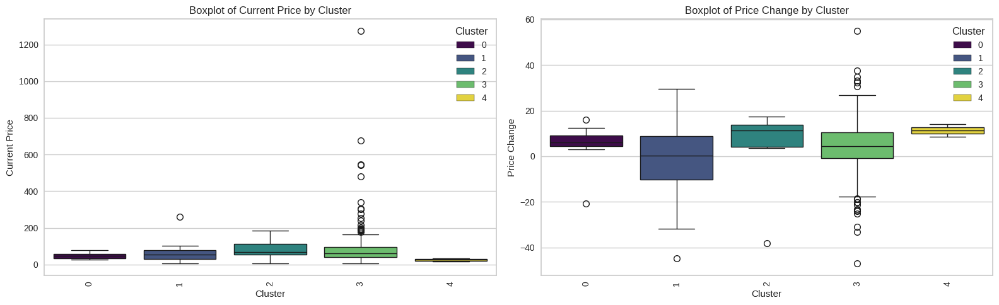

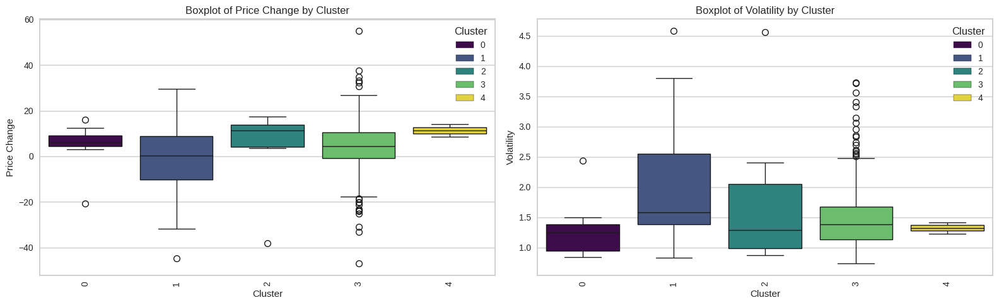

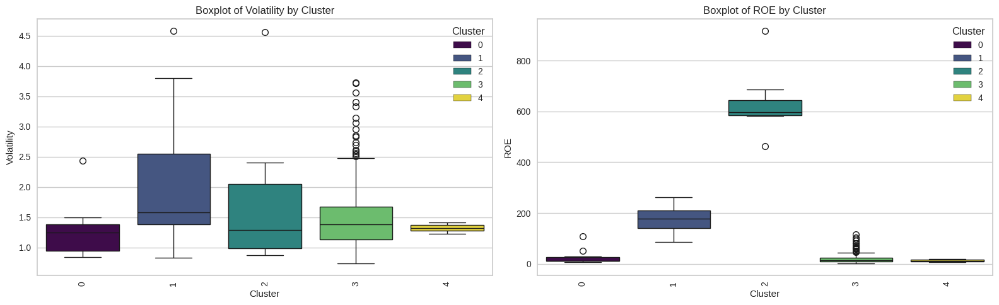

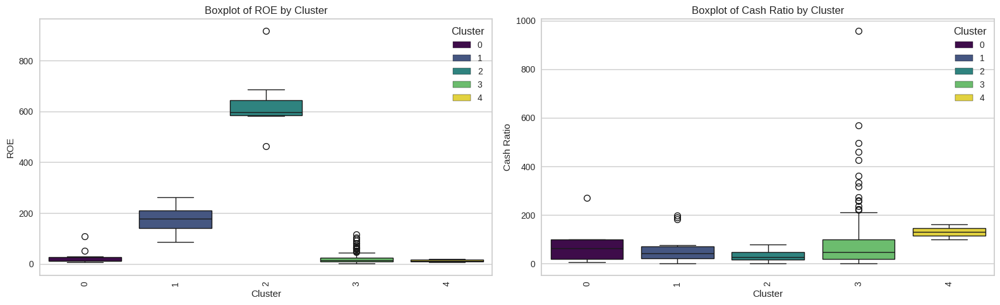

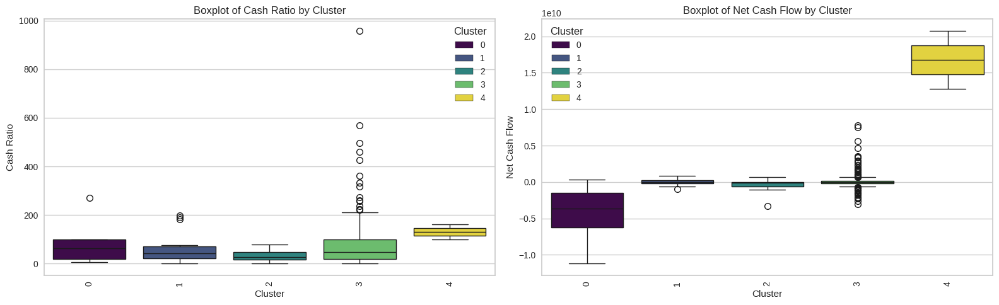

...

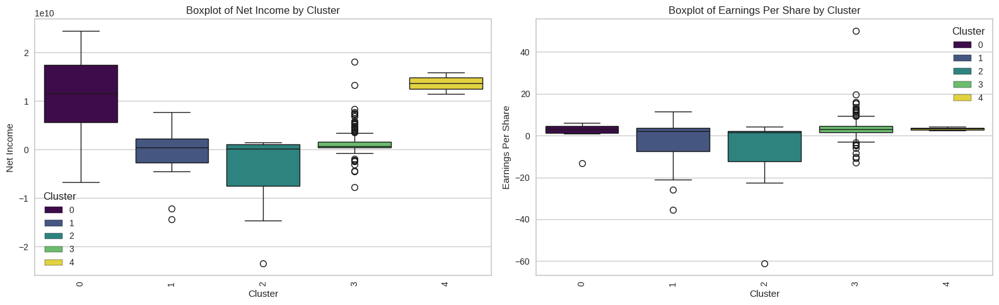

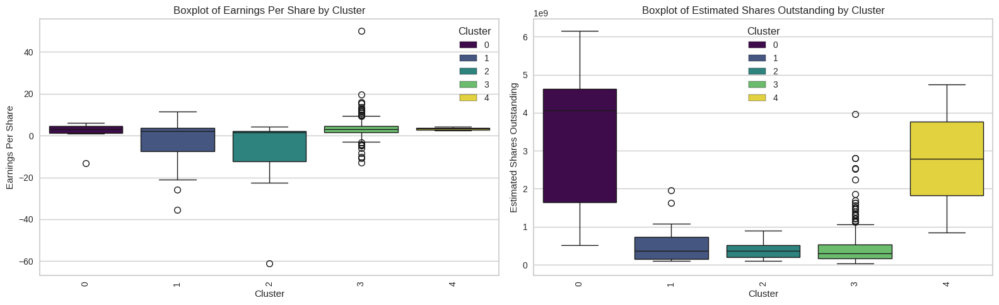

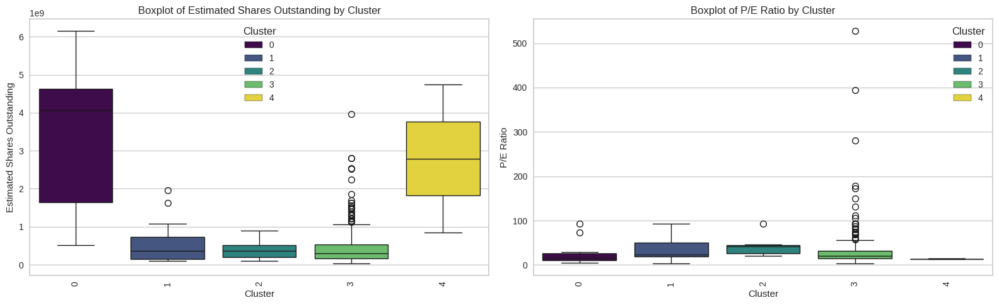

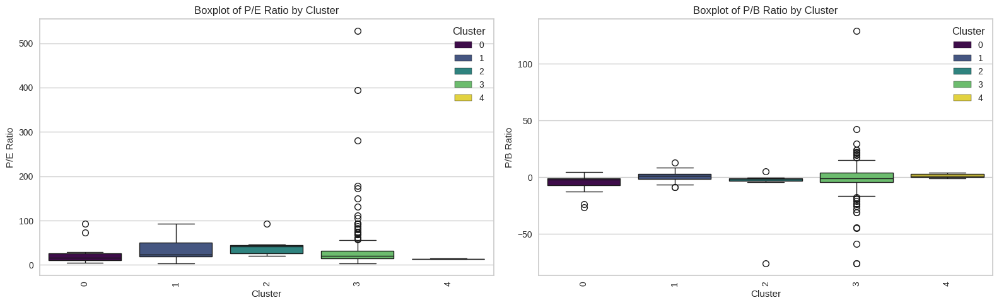

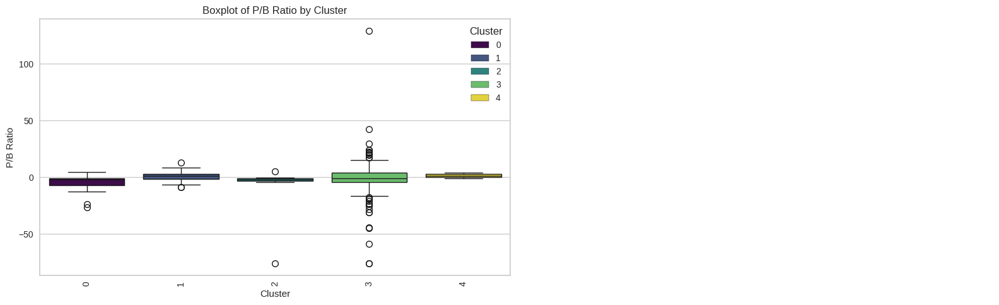

In [ ]:
# Loop through the selected columns and plot boxplots in two columns

n_cols = 2

# Iterate through numberical columns
for i, col in enumerate(list_numcol):
    if col in df_kmean.columns:

        # Set up subplots
        fig, axs = plt.subplots(1, n_cols, figsize=(16, 5))

        # Create boxplot
        sns.boxplot(data=df_kmean, x='Cluster', y=col, ax=axs[0], hue='Cluster', palette='viridis')
        axs[0].set_title(f'Boxplot of {col} by Cluster')
        axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=90)

        if i + 1 < len(list_numcol):
            next_col = list_numcol[i + 1]
            if next_col in df_kmean.columns:
                sns.boxplot(data=df_kmean, x='Cluster', y=next_col, ax=axs[1], hue='Cluster', palette='viridis')
                axs[1].set_title(f'Boxplot of {next_col} by Cluster')
                axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=90)
        else:
            axs[1].axis('off')

        plt.tight_layout()
        plt.show()

        if i + 1 < len(list_numcol):
            i += 1



In [ ]:
# Show the means
df_means_by_cluster = df_kmean.groupby('Cluster')[list_numcol].mean()
df_means_by_cluster = df_means_by_cluster.T  # Transpose to get clusters as columns
df_means_by_cluster

Cluster,0,1,2,3,4
Current Price,48.73,64.21,84.36,83.30,25.64
Price Change,5.32,-2.10,3.85,4.31,11.24
Volatility,1.27,2.12,1.83,1.50,1.32
ROE,26.00,178.50,633.57,19.26,12.50
Cash Ratio,71.75,64.12,33.57,70.71,130.50
Net Cash Flow,"-4,070,833,333.33","6,140,875.00","-568,400,000.00","125,750,287.13","16,755,500,000.00"
Net Income,"11,045,666,666.67","-603,718,000.00","-4,968,157,142.86","1,295,945,059.41","13,654,000,000.00"
Earnings Per Share,2.03,-3.21,-10.84,3.43,3.29
Estimated Shares Outstanding,"3,507,085,088.12","547,905,122.99","398,169,036.44","452,037,260.17","2,791,829,362.10"
P/E Ratio,26.99,39.24,42.28,32.39,13.65


Finally, let's display boxplots of the model and the means for each numerical metric, so we can compare clusters.

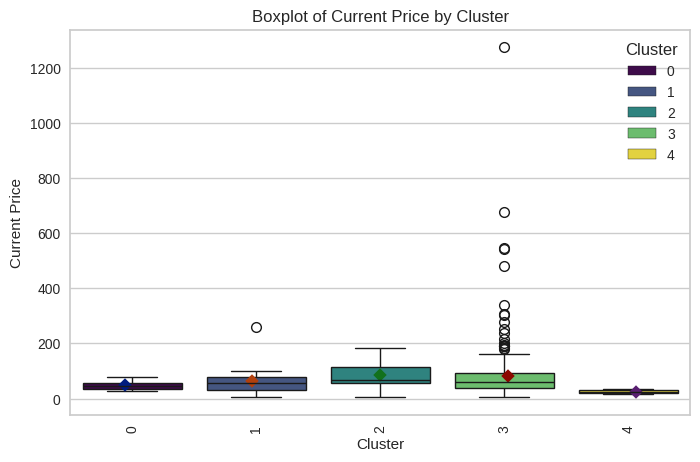

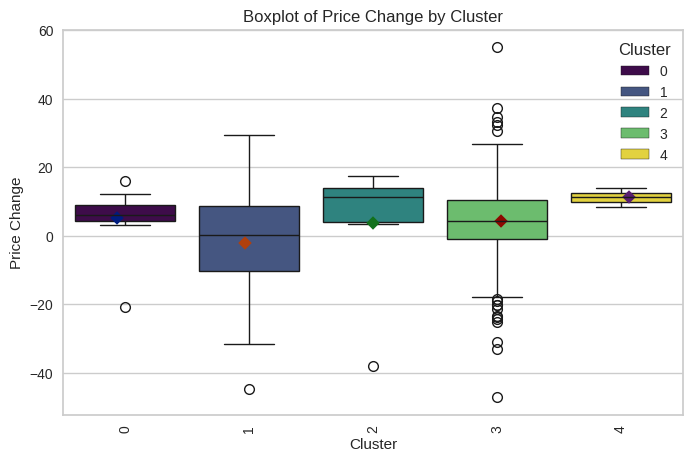

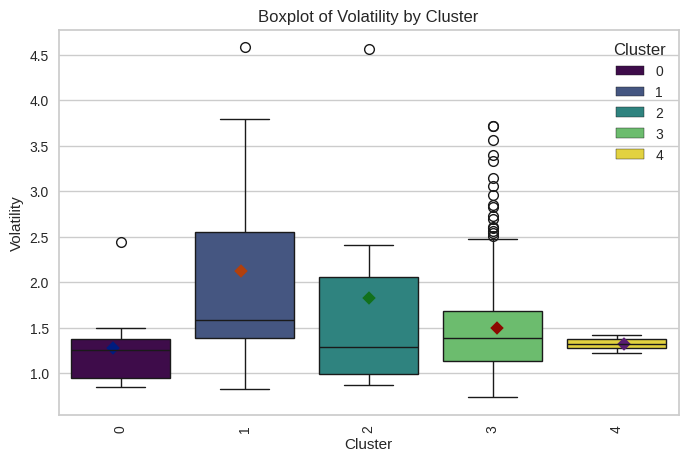

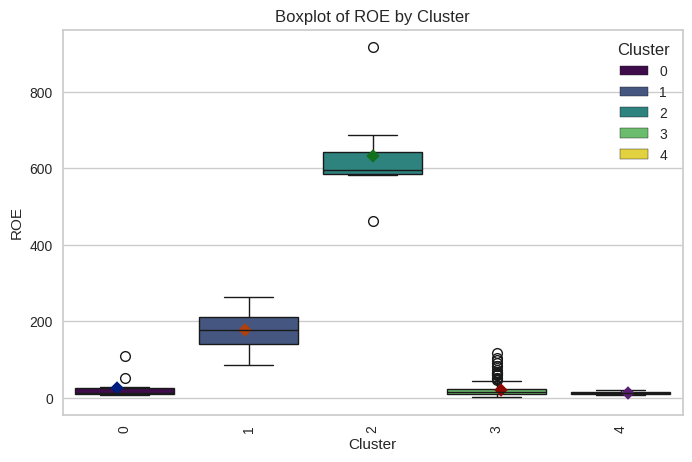

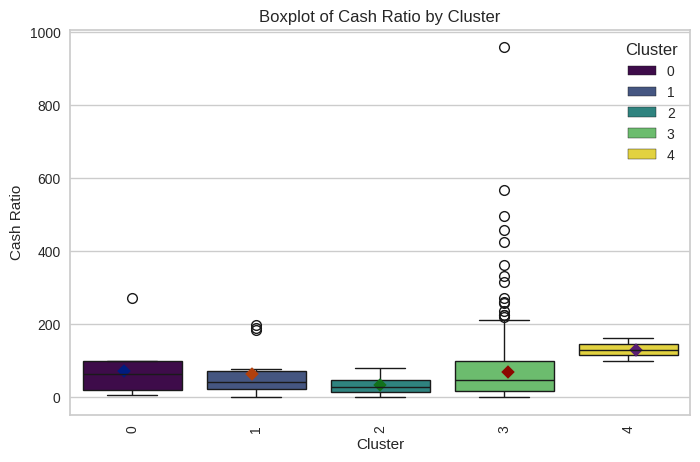

...

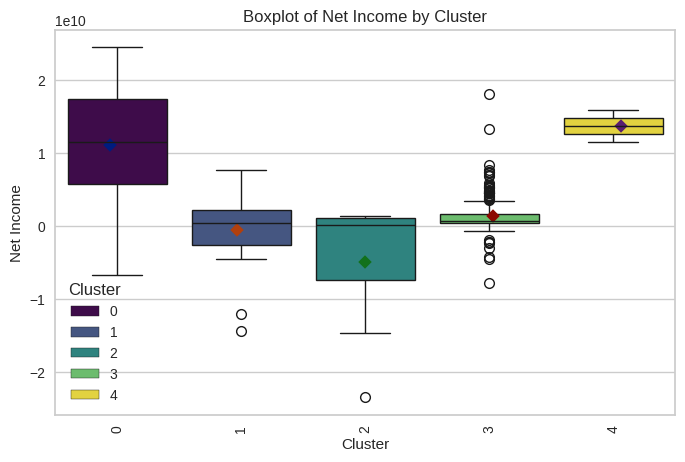

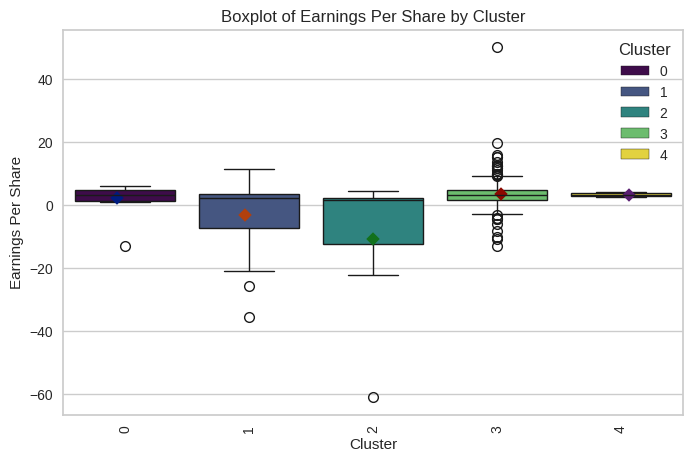

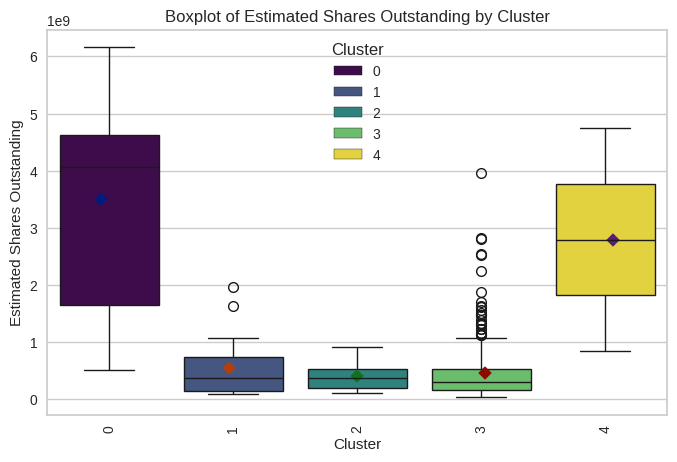

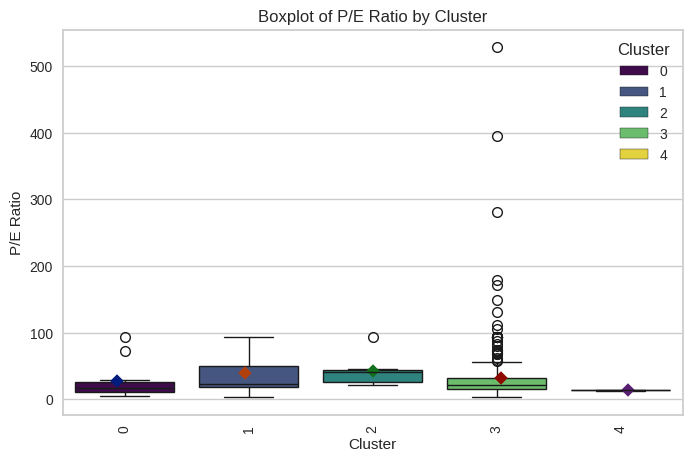

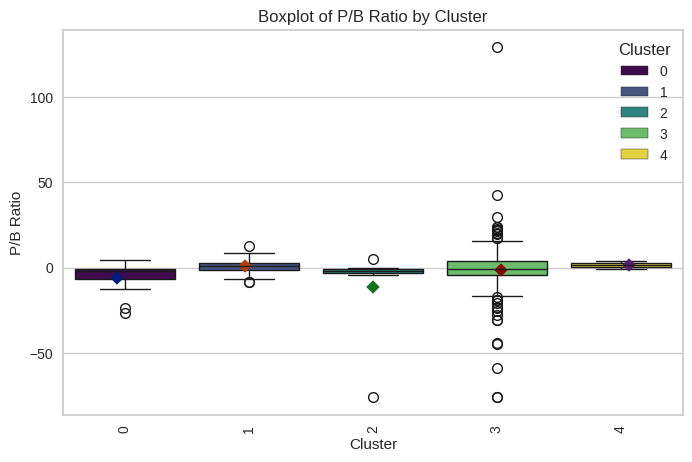

In [ ]:
# Plot boxplots with mean
for col in list_numcol:
    if col in df_kmean.columns:
        plt.figure(figsize=(8, 5))
        sns.boxplot(data=df_kmean, x='Cluster', y=col, hue='Cluster', palette='viridis', showmeans=False)

        # Use an overlaid  pointplot to show means
        sns.pointplot(data=df_kmean, x='Cluster', y=col, hue='Cluster', dodge=True, markers='D',
                      scale=0.75, ci=None, palette='dark', legend=False)

        plt.xticks(rotation=90)
        plt.title(f'Boxplot of {col} by Cluster')
        plt.show()

#### Final Model

Finally, let's determine which algorithm worked the best.

* For both K-means and Hierarchical, the plot density decreases as the number of clusters (K-means) or components (Hierarchical) increases.

* Since no extra definitive information surfaced during our PCA analysis, we will retain  K-means and 5 clusters as our final model. This more evenly allocated the data points into different clusters, and since the dataset is small, we are not as concerned with increased execution time.

* Some of the clusters have notable differences within the feature, as we can see in the boxplots. Other clusters show little difference, indicating that the feature may not be that important. Without normalizing the y-axis, it's difficult to compare them relative to one another.

* Next, we will revisit the numerical results to determine the characteristics of various clusters.

In [ ]:
# Re-display final results from our k-means analysis
mean_table

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
DF 0,64.38,4.33,1.69,210.96,74.73,"4,079,747,790.53","2,344,517,479.14",-1.83,"1,047,485,195.42",31.89,-2.72
DF 1,60.51,6.18,1.48,172.83,76.63,"3,060,504,238.45","5,256,863,645.80",-0.52,"1,787,280,186.71",28.83,-4.44
DF 2,55.47,4.69,1.55,59.06,84.27,"3,204,139,457.20","6,347,973,431.52",1.39,"1,824,714,208.35",28.07,-1.38
DF 3,55.74,4.58,1.64,212.64,74.99,"3,030,601,885.42","4,781,947,880.95",-2.18,"1,811,247,152.41",30.54,-3.91
DF 4,70.15,2.85,1.68,214.33,60.04,"-1,126,835,542.80","1,692,434,145.80",-2.15,"1,226,299,126.93",35.23,-4.65


## Actionable Insights and Recommendations

As the last step in our analysis, we can examine details of each cluster resulting from K-means with 5 clusters.

##### Cluster 0

This cluster's data encapsulates large, major companies with moderate growth potential and strong profitability, but possibly poor management of cash.

**Metrics**

* Current Price: 48.73
* Price Change: +5.32 (positive momentum)
* Volatility: 1.27 (stable)
* Return on Equity (ROE): 26% (good profitability and use of equity)
* Cash Ratio: 71.75 (sufficient cash cushion)
* Net Cash Flow: -4.07 billion (high value; possibly indiciating poor cash management despite being profitable)
* Net Income: 11.05 billion (good earnings)
* Earnings Per Share (EPS): $2.03 (good earnings)
* P/E Ratio: 26.99 (high; may be poised for growth)
* P/B Ratio: -6.24 (needs more research)

**Companies**

Anadarko Petroleum Corp, Bristol-Myers Squibb, Citigroup Inc., eBay Inc., General Motors, JPMorgan Chase & Co., Coca Cola Company, Pfizer Inc., AT&T Inc, Verizon Communications, Wells Fargo, Exxon Mobil Corp.

**Sectors and Sub Industries**

In [ ]:
# @title
# Show pivot of sectors and subsectors with counts
df_kmean_cluster_0_pivot = df_kmean_cluster_0.pivot_table(
    index=['GICS Sector', 'GICS Sub Industry'],
    values='Security',
    aggfunc={'Security': 'count'},
    fill_value=0
).reset_index()

# Rename columns
df_kmean_cluster_0_pivot.columns = ['GICS Sector', 'GICS Sub Industry', 'Company Count']

# Calculate grand total
grand_total_count = df_kmean_cluster_0_pivot['Company Count'].sum()
grand_total_df = pd.DataFrame({
    'GICS Sector': ['Grand Total'],
    'GICS Sub Industry': [''],
    'Company Count': [grand_total_count]
})

# Combine counts with grand total
combined = pd.concat([df_kmean_cluster_0_pivot, grand_total_df], ignore_index=True)

# Display the combined DataFrame
print('Cluster 0: Sector, Sub Industry and Company Count')
combined

Cluster 0: Sector, Sub Industry and Company Count


,GICS Sector,GICS Sub Industry,Company Count
0,Consumer Discretionary,Automobile Manufacturers,1
1,Consumer Staples,Soft Drinks,1
2,Energy,Integrated Oil & Gas,1
3,Energy,Oil & Gas Exploration & Production,1
4,Financials,Banks,3
5,Health Care,Health Care Distributors,1
6,Health Care,Pharmaceuticals,1
7,Information Technology,Internet Software & Services,1
8,Telecommunications Services,Integrated Telecommunications Services,2
9,Grand Total,,12


##### Cluster 1

Companies in this cluster are large but have poor earnings performance and show high volatility. Seeing both a negative earnings and declining stock price could indicate underlying problems. Investing in companies in the cluster requires research to find the ones with potential for turnaround.

**Metrics**

* Current Price: 64.21
* Price Change: -2.10 (slight decline)
* Volatility: 2.12 (shows uncertainty in market)
* Return on Equity (ROE): 178.5% (very high; requires research)
* Cash Ratio: 64.12 (good liquidity)
* Net Cash Flow: 6.14 million (positive cash flow)
* Net Income: -603.7 million (major losses)
* Earnings Per Share (EPS): -3.21 (missed earnings)
* P/E Ratio: 39.24 (very high - could be a good investment if recovery starts to surface)
* P/B Ratio: 0.67 (undervalued)

**Companies**

American Airlines Group, AbbVie, Devon Energy Corp., Freeport-McMoran Cp & Gld, IDEXX Laboratories, Masco Corp., Moody's Corp, Altria Group Inc, Newfield Exploration Co, Pitney-Bowes, Sherwin-Williams, Southwestern Energy, United Parcel Service, Wynn Resorts Ltd, Cimarex Energy, Yum! Brands

**Sectors and Sub Industries**

In [ ]:
# @title
# Show pivot of sectors and subsectors with counts
df_kmean_cluster_1_pivot = df_kmean_cluster_1.pivot_table(
    index=['GICS Sector', 'GICS Sub Industry'],
    values='Security',
    aggfunc={'Security': 'count'},
    fill_value=0
).reset_index()

# Rename columns
df_kmean_cluster_1_pivot.columns = ['GICS Sector', 'GICS Sub Industry', 'Company Count']

# Calculate grand total
grand_total_count = df_kmean_cluster_1_pivot['Company Count'].sum()
grand_total_df = pd.DataFrame({
    'GICS Sector': ['Grand Total'],
    'GICS Sub Industry': [''],
    'Company Count': [grand_total_count]
})

# Combine counts with grand total
combined = pd.concat([df_kmean_cluster_1_pivot, grand_total_df], ignore_index=True)

# Display the combined DataFrame
print('Cluster 1: Sector, Sub Industry and Company Count')
combined


Cluster 1: Sector, Sub Industry and Company Count


,GICS Sector,GICS Sub Industry,Company Count
0,Consumer Discretionary,Casinos & Gaming,1
1,Consumer Discretionary,Restaurants,1
2,Consumer Staples,Tobacco,1
3,Energy,Oil & Gas Exploration & Production,4
4,Financials,Diversified Financial Services,1
5,Health Care,Health Care Equipment,1
6,Health Care,Pharmaceuticals,1
7,Industrials,Air Freight & Logistics,1
8,Industrials,Airlines,1
9,Industrials,Building Products,1


##### Cluster 2

This cluster consists of high-risk companies with significant losses and poor liquidity. Even though they show positive price movement, the company may have weak fundamentals. Investments should be limited and/or carefully researched for these companies.

**Metrics**

* Current Price: 84.36
* Price Change: +3.85 (positive momentum)
* Volatility: 1.83 (moderate)
* Return on Equity (ROE): 633.57% (exceptionally high)
* Cash Ratio: 33.57 (low liquidity)
* Net Cash Flow: -568.4 million (negative cash flow)
* Net Income: -4.97 billion (significant losses)
* Earnings Per Share (EPS): -10.84 (bad earnings)
* P/E Ratio: 42.28 (may find growth, but risky)
* P/B Ratio: -11.59 (not a good signal; could be liabilities)

**Companies**

Allegion, Apache Corporation, Chesapeake Energy, Charter Communications, Colgate-Palmolive, Kimberly-Clark, S&P Global, Inc.

**Sectors and Sub Industries**


In [ ]:
# @title
# Show pivot of sectors and subsectors with counts
df_kmean_cluster_2_pivot = df_kmean_cluster_2.pivot_table(
    index=['GICS Sector', 'GICS Sub Industry'],
    values='Security',
    aggfunc={'Security': 'count'},
    fill_value=0
).reset_index()

# Rename columns
df_kmean_cluster_2_pivot.columns = ['GICS Sector', 'GICS Sub Industry', 'Company Count']

# Calculate grand total
grand_total_count = df_kmean_cluster_2_pivot['Company Count'].sum()
grand_total_df = pd.DataFrame({
    'GICS Sector': ['Grand Total'],
    'GICS Sub Industry': [''],
    'Company Count': [grand_total_count]
})

# Combine counts with grand total
combined = pd.concat([df_kmean_cluster_2_pivot, grand_total_df], ignore_index=True)

# Display the combined DataFrame
print('Cluster 2: Sector, Sub Industry and Company Count')
combined


Cluster 2: Sector, Sub Industry and Company Count


,GICS Sector,GICS Sub Industry,Company Count
0,Consumer Discretionary,Cable & Satellite,1
1,Consumer Staples,Household Products,2
2,Energy,Integrated Oil & Gas,1
3,Energy,Oil & Gas Exploration & Production,1
4,Financials,Diversified Financial Services,1
5,Industrials,Building Products,1
6,Grand Total,,7


##### Cluster 3

This cluster is by far the largest one. Companies falling into this cluster have good liquidity, stable performance, and are profitable. Investment comes with moderate risk but potential for growth.

**Metrics**

* Current Price: 83.30
* Price Change: +4.31 (positive price momentum)
* Volatility: 1.50 (stable)
* Return on Equity (ROE): 19.26% (good)
* Cash Ratio: 70.71 (good liquidity)
* Net Cash Flow: 125.75 million (good cash flow management)
* Net Income: 1.29 billion (profitable)
* Earnings Per Share (EPS): 3.43 (strong earnings performance)
* P/E Ratio: 32.39 (some risk, but also growth potential)
* P/B Ratio: -1.46 (needs research)

**Companies**

Abbott Laboratories, Adobe Systems Inc, Analog Devices, Inc., Archer-Daniels-Midland Co, Alliance Data Systems, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Alexion Pharmaceuticals, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Amgen Inc, Ameriprise Financial, American Tower Corp A, Amazon.com Inc, AutoNation Inc, Anthem Inc., Aon plc, Amphenol Corp, Arconic Inc, Activision Blizzard, AvalonBay Communities, Inc., Broadcom, American Water Works Company Inc, American Express Co, Boeing Company, Baxter International Inc., BB&T Corporation, Bard (C.R.) Inc., Baker Hughes Inc, BIOGEN IDEC Inc., The Bank of New York Mellon Corp., Ball Corp, Boston Scientific, BorgWarner, Boston Properties, Caterpillar Inc., Chubb Limited, CBRE Group, Crown Castle International Corp., Carnival Corp., Celgene Corp., CF Industries Holdings Inc, Citizens Financial Group, Church & Dwight, C. H. Robinson Worldwide, CIGNA Corp., Cincinnati Financial, Comerica Inc., CME Group Inc., Chipotle Mexican Grill, Cummins Inc., CMS Energy, Centene Corporation, CenterPoint Energy, Capital One Financial, Cabot Oil & Gas, The Cooper Companies, CSX Corp., CenturyLink Inc, Cognizant Technology Solutions, Citrix Systems, CVS Health, Chevron Corp., Concho Resources, Dominion Resources, Delta Air Lines, Du Pont (E.I.), Deere & Co., Discover Financial Services, Quest Diagnostics, Danaher Corp., The Walt Disney Company, Discovery Communications-A, Discovery Communications-C, Delphi Automotive, Digital Realty Trust, Dun & Bradstreet, Dover Corp., Dr Pepper Snapple Group, Duke Energy, DaVita Inc., Ecolab Inc., Consolidated Edison, Equifax Inc., Edison Int'l, Eastman Chemical, EOG Resources, Equinix, Equity Residential, EQT Corporation, Eversource Energy, Essex Property Trust, Inc., E*Trade, Eaton Corporation, Entergy Corp., Edwards Lifesciences, Exelon Corp., Expeditors Int'l, Expedia Inc., Extra Space Storage, Ford Motor, Fastenal Co, Facebook, Fortune Brands Home & Security, FirstEnergy Corp, Fidelity National Information Services, Fiserv Inc, FLIR Systems, Fluor Corp., Flowserve Corporation, FMC Corporation, Federal Realty Investment Trust, First Solar Inc, Frontier Communications, General Dynamics, General Growth Properties Inc., Gilead Sciences, Corning Inc., Genuine Parts, Garmin Ltd., Goodyear Tire & Rubber, Grainger (W.W.) Inc., Halliburton Co., Hasbro Inc., Huntington Bancshares, HCA Holdings, Welltower Inc., HCP Inc., Hess Corporation, Hartford Financial Svc.Gp., Harley-Davidson, Honeywell Int'l Inc., Hewlett Packard Enterprise, HP Inc., Hormel Foods Corp., Henry Schein, Host Hotels & Resorts, The Hershey Company, Humana Inc., International Business Machines, Intl Flavors & Fragrances, International Paper, Interpublic Group, Iron Mountain Incorporated, Intuitive Surgical Inc., Illinois Tool Works, Invesco Ltd., J. B. Hunt Transport Services, Jacobs Engineering Group, Juniper Networks, Kimco Realty, Kinder Morgan, Kansas City Southern, Leggett & Platt, Lennar Corp., Laboratory Corp. of America Holding, LKQ Corporation, L-3 Communications Holdings, Lilly (Eli) & Co., Lockheed Martin Corp., Alliant Energy Corp, Leucadia National Corp., Southwest Airlines, Level 3 Communications, LyondellBasell, Mastercard Inc., Mid-America Apartments, Macerich, Marriott Int'l., Mattel Inc., McDonald's Corp., Mondelez International, MetLife Inc., Mohawk Industries, Mead Johnson, McCormick & Co., Martin Marietta Materials, Marsh & McLennan, 3M Company, Monster Beverage, The Mosaic Company, Marathon Petroleum, Merck & Co., Marathon Oil Corp., M&T Bank Corp., Mettler Toledo, Murphy Oil, Mylan N.V., Navient, Noble Energy Inc, NASDAQ OMX Group, NextEra Energy, Newmont Mining Corp. (Hldg. Co.), Netflix Inc., Nielsen Holdings, National Oilwell Varco Inc., Norfolk Southern Corp., Northern Trust Corp., Nucor Corp., Newell Brands, Realty Income Corporation, ONEOK, Omnicom Group, O'Reilly Automotive, Occidental Petroleum, People's United Financial, PACCAR Inc., PG&E Corp., Priceline.com Inc, Public Serv. Enterprise Inc., PepsiCo Inc., Principal Financial Group, Procter & Gamble, Progressive Corp., Pulte Homes Inc., Philip Morris International, PNC Financial Services, Pentair Ltd., Pinnacle West Capital, PPG Industries, PPL Corp., Prudential Financial, Phillips 66, Quanta Services Inc., Praxair Inc., PayPal, Ryder System, Royal Caribbean Cruises Ltd, Regeneron, Robert Half International, Roper Industries, Range Resources Corp., Republic Services Inc, SCANA Corp, Charles Schwab Corporation, Spectra Energy Corp., Sealed Air, SL Green Realty, Scripps Networks Interactive Inc., Southern Co., Simon Property Group Inc, Stericycle Inc, Sempra Energy, SunTrust Banks, State Street Corp., Skyworks Solutions, Synchrony Financial, Stryker Corp., Molson Coors Brewing Company, Teradata Corp., Tegna, Inc., Torchmark Corp., Thermo Fisher Scientific, TripAdvisor, The Travelers Companies Inc., Tractor Supply Company, Tyson Foods, Tesoro Petroleum Co., Total System Services, Texas Instruments, Under Armour, United Continental Holdings, UDR Inc, Universal Health Services, Inc., United Health Group Inc., Unum Group, Union Pacific, United Technologies, Varian Medical Systems, Valero Energy, Vulcan Materials, Vornado Realty Trust, Verisk Analytics, Verisign Inc., Vertex Pharmaceuticals Inc, Ventas Inc, Waters Corporation, Wec Energy Group Inc, Whirlpool Corp., Waste Management Inc., Williams Cos., Western Union Co, Weyerhaeuser Corp., Wyndham Worldwide, Xcel Energy Inc, XL Capital, Dentsply Sirona, Xerox Corp., Xylem Inc., Yahoo Inc., Zimmer Biomet Holdings, Zions Bancorp, Zoetis

**Sectors and Sub Industries**

In [ ]:
# @title
# Show all rows in the DataFrame
pd.set_option('display.max_rows', None)

# Show pivot of sectors and subsectors with counts
df_kmean_cluster_3_pivot = df_kmean_cluster_3.pivot_table(
    index=['GICS Sector', 'GICS Sub Industry'],
    values='Security',
    aggfunc={'Security': 'count'},
    fill_value=0
).reset_index()

# Rename columns
df_kmean_cluster_3_pivot.columns = ['GICS Sector', 'GICS Sub Industry', 'Company Count']

# Calculate grand total
grand_total_count = df_kmean_cluster_3_pivot['Company Count'].sum()
grand_total_df = pd.DataFrame({
    'GICS Sector': ['Grand Total'],
    'GICS Sub Industry': [''],
    'Company Count': [grand_total_count]
})

# Combine counts with grand total
combined = pd.concat([df_kmean_cluster_3_pivot, grand_total_df], ignore_index=True)

# Display the combined DataFrame
print('Cluster 3: Sector, Sub Industry and Company Count')
combined


Cluster 3: Sector, Sub Industry and Company Count


,GICS Sector,GICS Sub Industry,Company Count
0,Consumer Discretionary,Advertising,2
1,Consumer Discretionary,"Apparel, Accessories & Luxury Goods",1
2,Consumer Discretionary,Auto Parts & Equipment,2
3,Consumer Discretionary,Automobile Manufacturers,1
4,Consumer Discretionary,Broadcasting & Cable TV,2
5,Consumer Discretionary,Cable & Satellite,2
6,Consumer Discretionary,Consumer Electronics,1
7,Consumer Discretionary,Distributors,1
8,Consumer Discretionary,Home Furnishings,1
9,Consumer Discretionary,Homebuilding,2


##### Cluster 4

Only two companies fell this cluster, and both are likely good long-term investments. They appear to be in excellent financial health, have strong cash flow, and also solid earnings. Their relatively low P/E ratio suggest they are undervalued and could continue to grow.

**Metrics**

* Current Price: 25.64 (lower end of the clusters)
* Price Change: +11.24 (strong momentum)
* Volatility: 1.32 (low/stable)
*Return on Equity (ROE): 12.50% (healthy)
* Cash Ratio: 130.50 (good liquidity)
* Net Cash Flow: 16.76 billion (strong cash flow)
* Net Income: 13.65 billion (strong earnings)
* Earnings Per Share (EPS): 3.29 (strong earnings performance)
* P/E Ratio: 13.65 (low value indicates undervaluation)
* P/B Ratio: 1.51 (fair market value)

**Companies**

Bank of America Corp, Intel Corp.

**Sectors and Sub Industries**

In [ ]:
# @title
# Show pivot of sectors and subsectors with counts
df_kmean_cluster_4_pivot = df_kmean_cluster_4.pivot_table(
    index=['GICS Sector', 'GICS Sub Industry'],
    values='Security',
    aggfunc={'Security': 'count'},
    fill_value=0
).reset_index()

# Rename columns
df_kmean_cluster_4_pivot.columns = ['GICS Sector', 'GICS Sub Industry', 'Company Count']

# Calculate grand total
grand_total_count = df_kmean_cluster_4_pivot['Company Count'].sum()
grand_total_df = pd.DataFrame({
    'GICS Sector': ['Grand Total'],
    'GICS Sub Industry': [''],
    'Company Count': [grand_total_count]
})

# Combine counts with grand total
combined = pd.concat([df_kmean_cluster_4_pivot, grand_total_df], ignore_index=True)

# Display the combined DataFrame
print('Cluster 4: Sector, Sub Industry and Company Count')
combined


Cluster 4: Sector, Sub Industry and Company Count


,GICS Sector,GICS Sub Industry,Company Count
0,Financials,Banks,1
1,Information Technology,Semiconductors,1
2,Grand Total,,2


## Summary

**Short-Term Investments**

For investors looking for short-term profits (weeks or months), the focus will be on price momentum and volatility, as well as  liquidity to handle short-term financial commitments.

Good:
* Cluster 4: Strong growth with low volatility and positive price momentum.
* Cluster 3: Moderate growth with positive price change and solid cash standing with less risk.

Risky:
* Cluster 0 has negative cash flow.
* Clusters 1 and 2 show higher volatility and risk

**Longer-Term Investments**

For investors who are willing to invest and wait (a year or longer),

Good:
* Cluster 4: Has strong financial health, excellent liquidity, and good  growth. Low P/E ratio indicates an undervalued stock.
* Cluster 3: Show both growth and positive cash flow, and low to medium volatility.

Risky:
* Cluster 0: May work for long-term investment, but a negative cash flow doesn't bode well.
* Clusters 1 and 2 both have poor financial health and weak fundamentals.

# Export Notebook

In [ ]:
!pip install nbconvert

In [ ]:
# Create an HTML version of this notebook - do this last
%%shell
jupyter nbconvert --to html '/content/drive/MyDrive/Learning/Data Coursework/PGP-DSBA/7-Unsupervised Learning/Project 7/USL_Project_LearnerNotebook_FullCode_Tuesday_Frase_vFinal.ipynb'

[NbConvertApp] Converting notebook /content/drive/MyDrive/Learning/Data Coursework/PGP-DSBA/7-Unsupervised Learning/Project 7/USL_Project_LearnerNotebook_FullCode_Tuesday_Frase_vFinal.ipynb to html
[NbConvertApp] Writing 11305405 bytes to /content/drive/MyDrive/Learning/Data Coursework/PGP-DSBA/7-Unsupervised Learning/Project 7/USL_Project_LearnerNotebook_FullCode_Tuesday_Frase_vFinal.html
